# 数据集：[Alzheimer Disease and Healthy Aging Data In US](https://www.kaggle.com/datasets/ananthu19/alzheimer-disease-and-healthy-aging-data-in-us)

## 1. 数据分析：
### 1.1 数据集介绍：
   该数据集包括有关各种变量的信息，例如人口统计特征、健康状况、医疗保健利用率和健康行为。由疾病控制和预防中心（CDC）编制，包括来自几项国家调查的数据，包括行为风险因素监测系统（BRFSS），国家健康和营养检查调查（NHANES）和全国健康访谈调查（NHIS）。具体数据字段将在下文介绍

### 1.2 要求一览：
**（1）数据摘要**
      标称属性，给出每个可能取值的频数；数值属性，给出5数概括及缺失值的个数

**（2）数据可视化**
      使用直方图、盒图等检查数据分布及离群点


In [1]:
#需要的包和库
import pandas as pd
from pandas.core.frame import DataFrame
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from impyute import fast_knn
import numpy as np

In [2]:
#读取数据
file_path = "./Alzheimer Disease and Healthy Aging Data In US/Alzheimer Disease and Healthy Aging Data In US.csv"
data = pd.read_csv(file_path,dtype={'Geolocation':'string'})
data.info()

C:\Users\LIURAN\AppData\Local\Temp\ipykernel_31644\3763118231.py:3: DtypeWarning: Columns (13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(file_path,dtype={'Geolocation':'string'})


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 214462 entries, 0 to 214461
Data columns (total 29 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   YearStart                  214462 non-null  int64  
 1   YearEnd                    214462 non-null  int64  
 2   LocationAbbr               214462 non-null  object 
 3   LocationDesc               214462 non-null  object 
 4   Datasource                 214462 non-null  object 
 5   Class                      214462 non-null  object 
 6   Topic                      214462 non-null  object 
 7   Question                   214462 non-null  object 
 8   Data_Value_Unit            214462 non-null  object 
 9   DataValueTypeID            214462 non-null  object 
 10  Data_Value_Type            214462 non-null  object 
 11  Data_Value                 144629 non-null  float64
 12  Data_Value_Alt             144629 non-null  float64
 13  Low_Confidence_Limit       14

### 数据字段介绍和分类
本次处理主要针对标称属性和数值属性
 0  YearStart  数据开始收集的年份（标称）    
 1  YearEnd  数据结束收集的年份（标称）                    
 2  LocationAbbr  数据收集地点缩写（标称）              
 3  LocationDesc  数据收集地点全称（标称）              
 4  Datasource  数据来源（标称）               
 5  Class  数据类别（标称）                       
 6  Topic  数据主题（标称）           
 7  Question  与数据有关的问题（标称）                 
 8  Data_Value_Unit  数据值的测量单位（标称）
 9  DataValueTypeID  数据值类型的ID（标称）           
 10  Data_Value_Type 数据值的类型（例如，平均值，百分比）（标称）  
 11  Data_Value  实际数据值（数值）            
 12  Data_Value_Alt  如果适用，则为替代数据值（数值）             
 13  Low_Confidence_Limit  数据值置信区间的下限 （数值）      
 14  High_Confidence_Limit  数据值置信区间的上限 （数值）     
 15  Sample_Size  用于收集数据的样本大小（值全为空，不考虑该属性）                
 16  StratificationCategory1  用于分层的第一个类别（例如，年龄组）（标称）    
 17  Stratification1  使用的具体分层（例如，18-24岁）（标称）          
 18  StratificationCategory2  如果适用，则为第二个用于分层的类别 （标称）  
 19  Stratification2  如果适用，则为第二个类别使用的具体分层 （标称）         
 20  Geolocation   收集数据的位置的纬度和经度 （数值，要转换一下）             
 21  ClassID   数据类别的ID（标称）                  
 22  TopicID   与数据相关的主题的ID（标称）                  
 23  QuestionID   与数据相关的问题的ID（标称）               
 24  LocationID  收集数据的位置的ID（标称）                
 25  StratificationCategoryID1  用于分层的第一个类别的ID （标称）
 26  StratificationID1  用于第一个类别的具体分层的ID（标称）         
 27  StratificationCategoryID2  如果适用，则为第二个用于分层的类别的ID（标称）  
 28  StratificationID2  如果适用，则为第二个类别使用的具体分层的ID（标称）        

In [3]:
for column in data.columns:
    print("属性"+column+"概况如下")
    print(data[column].value_counts())
    print("-------------------------------------")

属性YearStart概况如下
2015    45980
2020    36006
2019    34354
2016    34145
2017    33429
2018    30548
Name: YearStart, dtype: int64
-------------------------------------
属性YearEnd概况如下
2020    46966
2015    35020
2019    34354
2016    34145
2017    33429
2018    30548
Name: YearEnd, dtype: int64
-------------------------------------
属性LocationAbbr概况如下
US      4644
WEST    4638
NRE     4614
MDW     4611
OR      4565
NY      4557
SOU     4542
UT      4222
OH      3955
GA      3951
MD      3919
HI      3907
TN      3879
MI      3796
VA      3758
FL      3753
ME      3733
TX      3699
NV      3696
DC      3684
WV      3682
MS      3677
PA      3648
NM      3635
AL      3633
KY      3623
AK      3611
SC      3592
NJ      3589
AZ      3582
MO      3573
IL      3571
IN      3570
WI      3569
LA      3563
MN      3555
NE      3546
CT      3543
RI      3534
OK      3526
SD      3526
ND      3514
KS      3510
ID      3507
IA      3501
AR      3498
WY      3494
CA      3447
CO      3390
NC      3349

%         197929
Number     16533
Name: Data_Value_Unit, dtype: int64
-------------------------------------
属性DataValueTypeID概况如下
PRCTG    197929
MEAN      16533
Name: DataValueTypeID, dtype: int64
-------------------------------------
属性Data_Value_Type概况如下
Percentage    197929
Mean           16533
Name: Data_Value_Type, dtype: int64
-------------------------------------
属性Data_Value概况如下
6.0     473
6.3     467
6.1     459
5.8     458
5.2     456
       ... 
99.7      2
0.5       1
0.6       1
0.3       1
0.2       1
Name: Data_Value, Length: 999, dtype: int64
-------------------------------------
属性Data_Value_Alt概况如下
6.0     473
6.3     467
6.1     459
5.8     458
5.2     456
       ... 
99.7      2
0.5       1
0.6       1
0.3       1
0.2       1
Name: Data_Value_Alt, Length: 999, dtype: int64
-------------------------------------
属性Low_Confidence_Limit概况如下
5.4     350
5.1     318
4.8     314
5.3     313
5       305
       ... 
96.8      1
98.4      1
0.9       1
97.8      1
99.4     

In [4]:
#封装函数（是否需要写到单独的文件）
def getFiveDes(data,attr):#拿到五数概括
#for numattr in numetricAttr:
    print("对数值属性"+attr+"的五数概括如下")
    des = data[attr].describe()
    des_min = des['min']
    des_q1 = des['25%']
    des_median = des['50%']
    des_q3 = des['75%']
    des_max = des['max']
    print("最小值为{},第一四分位数为{},中位数为{},第三四分位数为{},最大值为{}".format(des_min,des_q1,des_median,des_q3,des_max))

In [5]:
#数据摘要 标称属性，给出每个可能取值的频数
#标称属性：分类
nominalAttr = ['YearStart','YearEnd','LocationAbbr','LocationDesc','Datasource','Class','Topic','Question','Data_Value_Unit','DataValueTypeID','Data_Value_Type','StratificationCategory1','Stratification1','StratificationCategory2','Stratification2','ClassID','TopicID','QuestionID','LocationID','StratificationCategoryID1','StratificationID1','StratificationCategoryID2','StratificationID2']#共9个
#列举
# for nattr in nominalAttr:
#     print("对于标称属性"+nattr+"的可能取值及频数分析如下")#column是字符串
#     print(data[nattr].value_counts())
#     print("--------------------------------------")
    
#数值属性:
numetricAttr = ['Data_Value','Data_Value_Alt','Low_Confidence_Limit','High_Confidence_Limit','Longitude','Latitude']#5个
#从上面对整体的处理可以发现维度数据格式为Point(x y)，需要转化一下，转成两个属性：维度、经度
i = 0
Longitude = []#经度
Latitude = []#维度

for t in data['Geolocation']:
    try:
        numbers = t.split("(")[1]
        numbers = numbers.replace(")","")
        lon, lat = numbers.split()
        
        Longitude.append(lon)
        Latitude.append(lat)
    except:
        #t = <NA>
        Longitude.append(t)
        Latitude.append(t)
    

data['Longitude'] = Longitude
data['Latitude'] = Latitude
data['Longitude'] = data['Longitude'].fillna(np.nan).astype(float)
data['Latitude'] = data['Latitude'].fillna(np.nan).astype(float)

data['Low_Confidence_Limit'] = data['Low_Confidence_Limit'].replace('.', '0')#通过分析发现无法转化为float的值全为.
data['Low_Confidence_Limit']=data['Low_Confidence_Limit'].astype('float64')


data['High_Confidence_Limit'] = data['High_Confidence_Limit'].replace('.', '0')#通过分析发现无法转化为float的值全为.
data['High_Confidence_Limit']=data['High_Confidence_Limit'].astype('float64')

data.info()
print("finish changing")# 获得时长全部为数值的df对象data
    
for numattr in numetricAttr:
    getFiveDes(data,numattr)
    #缺失值
    print("缺失值个数为{}".format(data[numattr].isnull().sum()))
    print("--------------------------------------")


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 214462 entries, 0 to 214461
Data columns (total 31 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   YearStart                  214462 non-null  int64  
 1   YearEnd                    214462 non-null  int64  
 2   LocationAbbr               214462 non-null  object 
 3   LocationDesc               214462 non-null  object 
 4   Datasource                 214462 non-null  object 
 5   Class                      214462 non-null  object 
 6   Topic                      214462 non-null  object 
 7   Question                   214462 non-null  object 
 8   Data_Value_Unit            214462 non-null  object 
 9   DataValueTypeID            214462 non-null  object 
 10  Data_Value_Type            214462 non-null  object 
 11  Data_Value                 144629 non-null  float64
 12  Data_Value_Alt             144629 non-null  float64
 13  Low_Confidence_Limit       14

### 1.2 数据可视化

YearStart


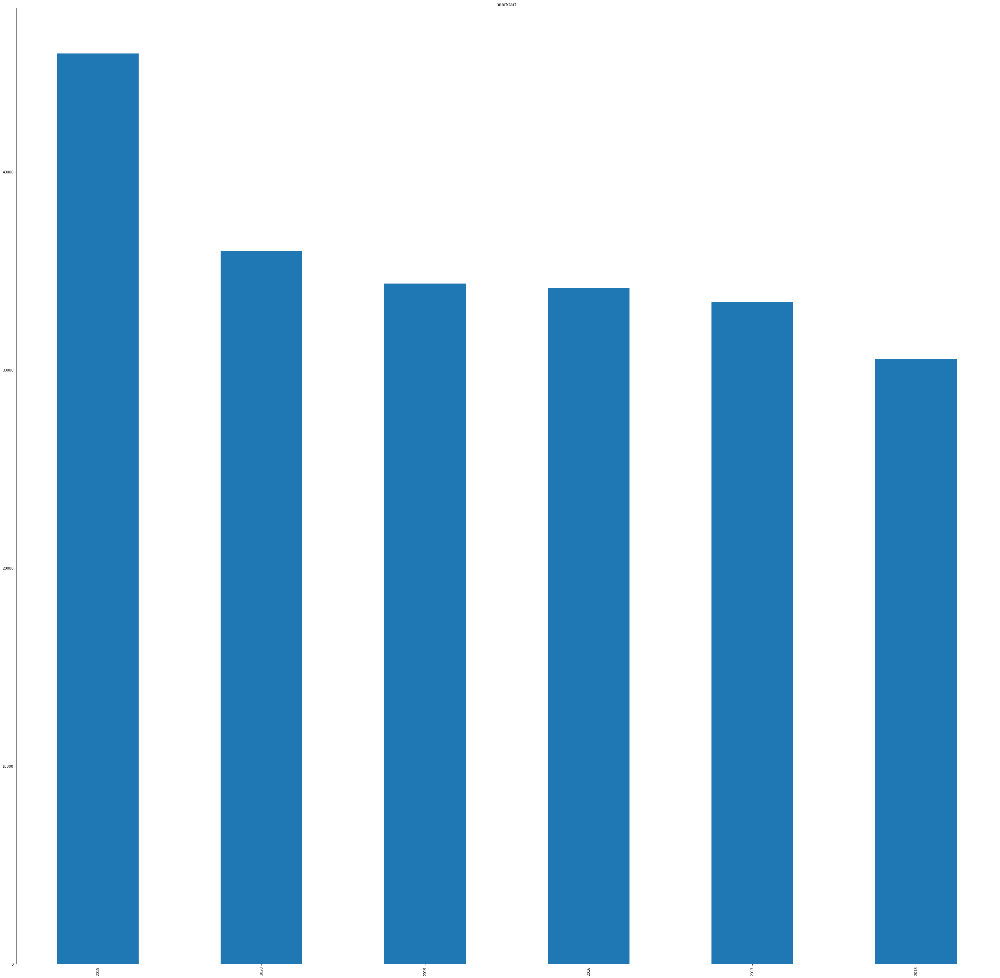

YearEnd


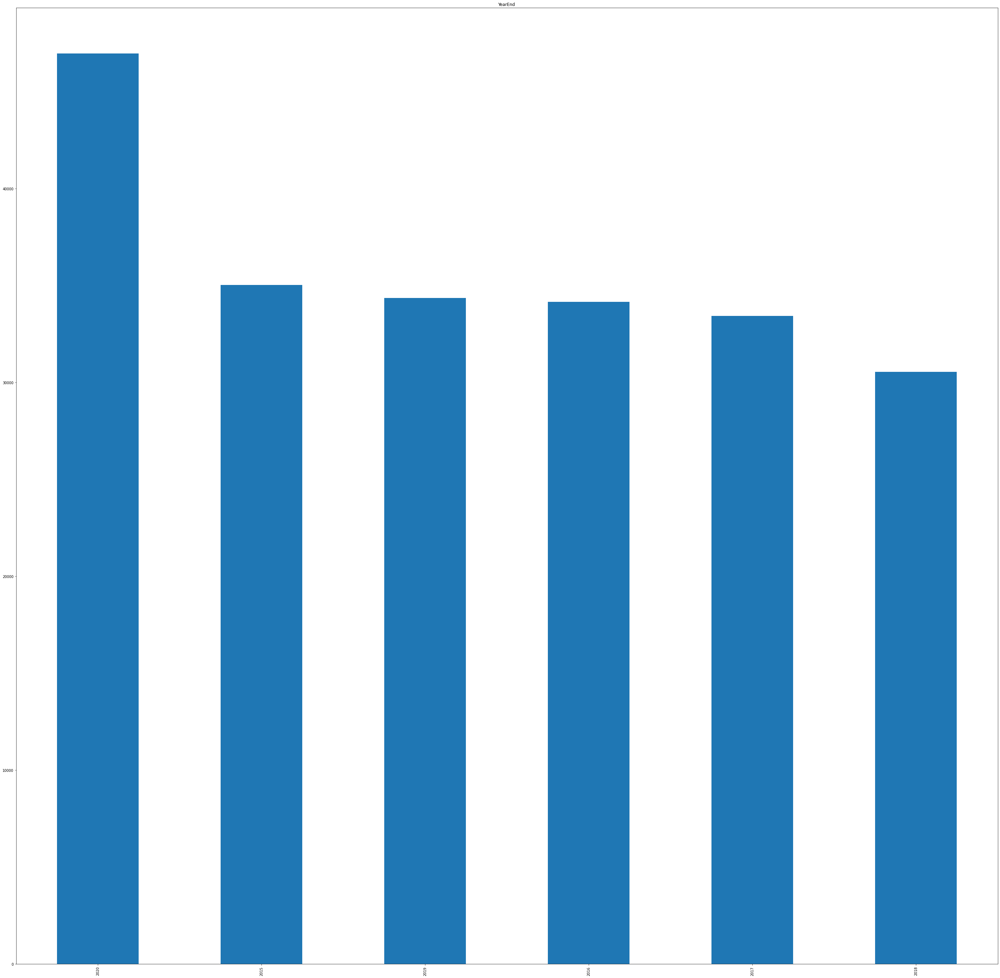

LocationAbbr


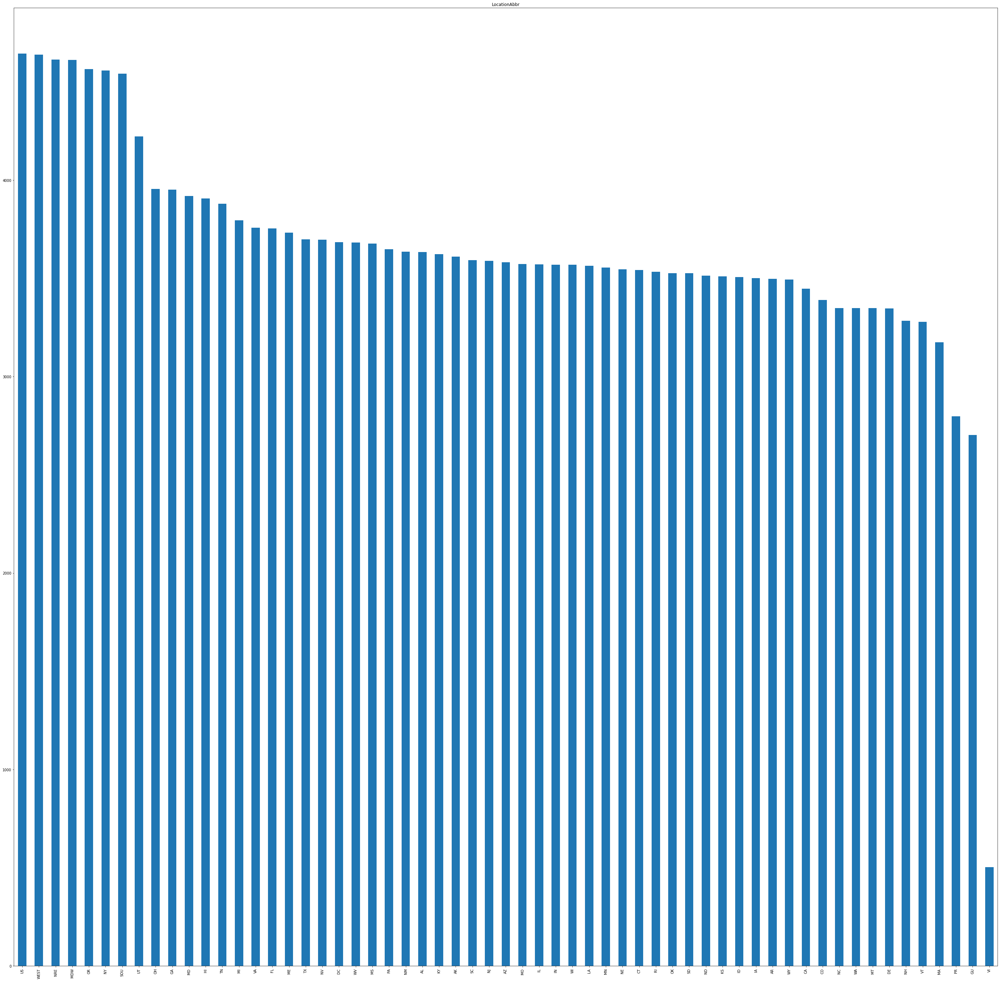

LocationDesc


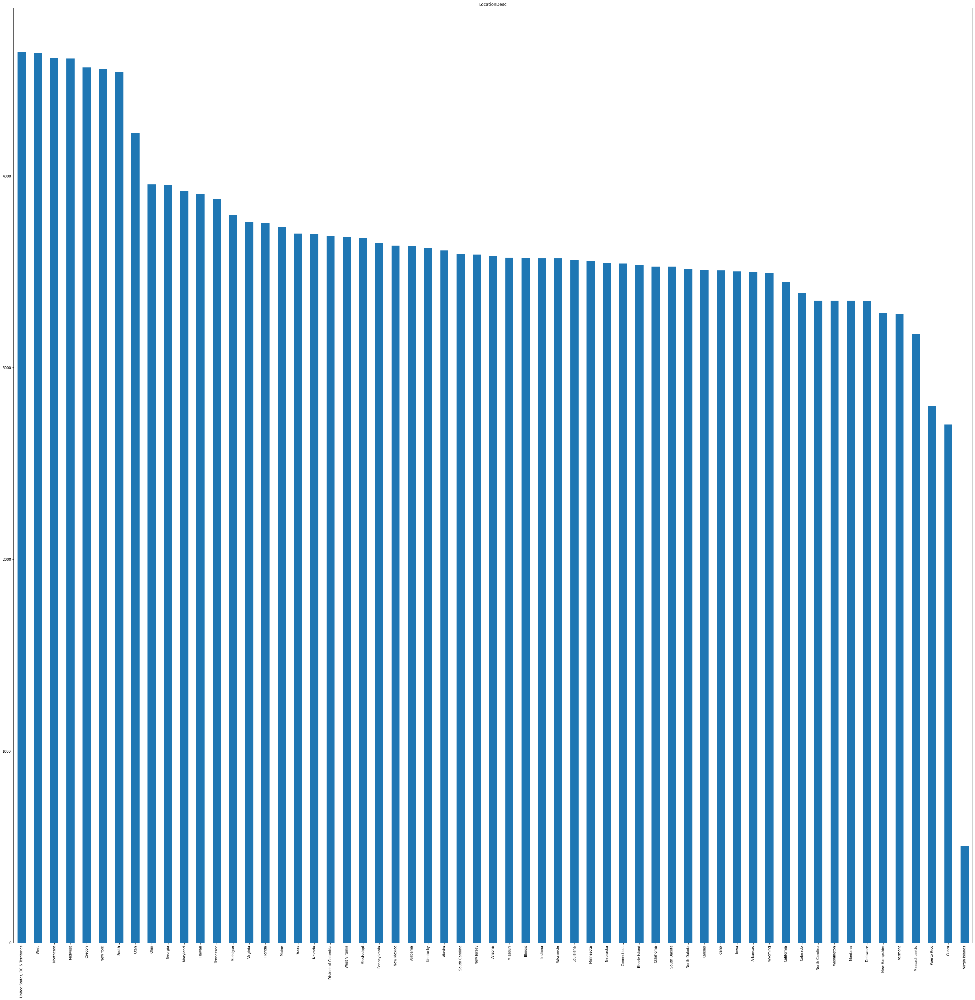

Datasource


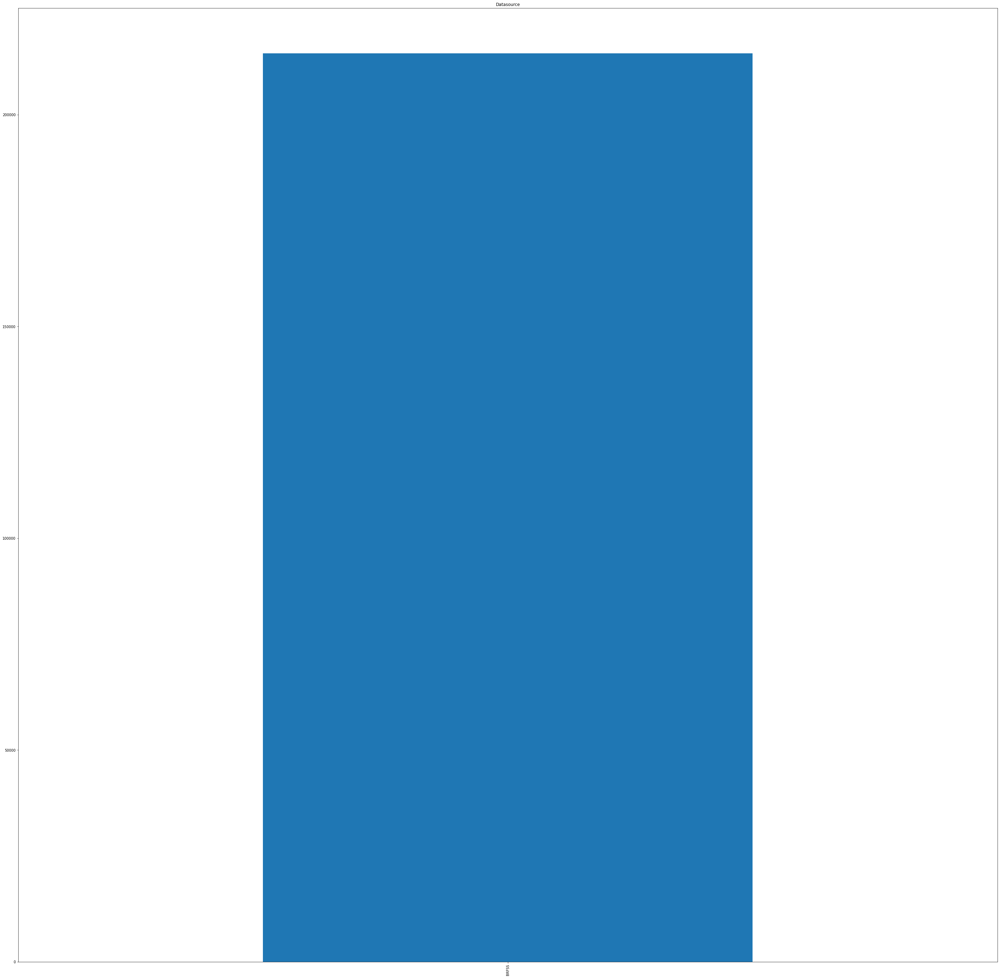

Class


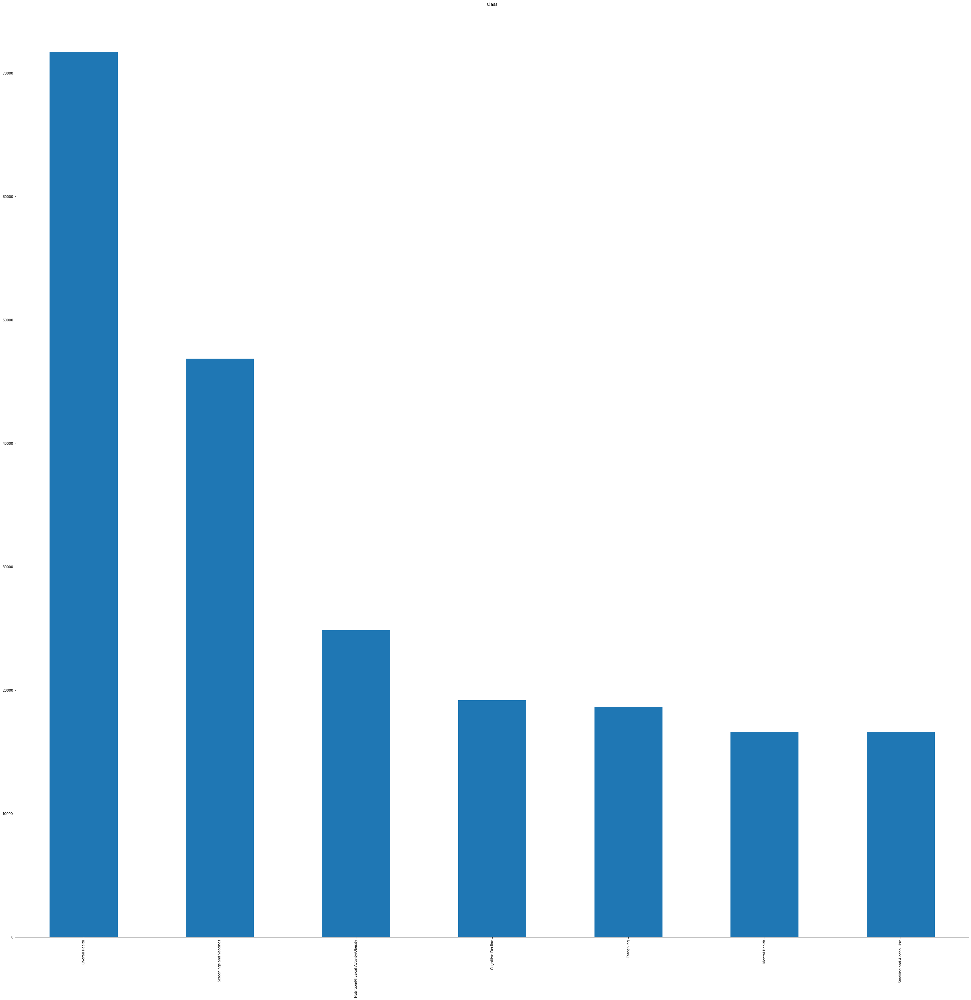

Topic


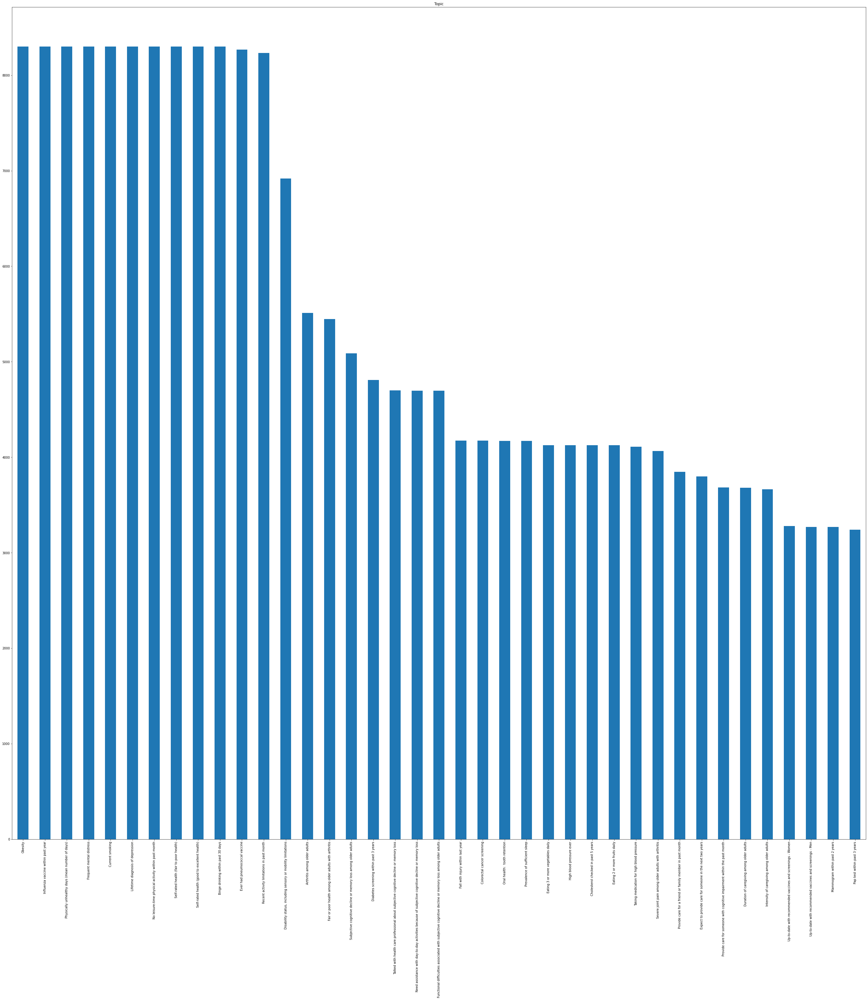

Question


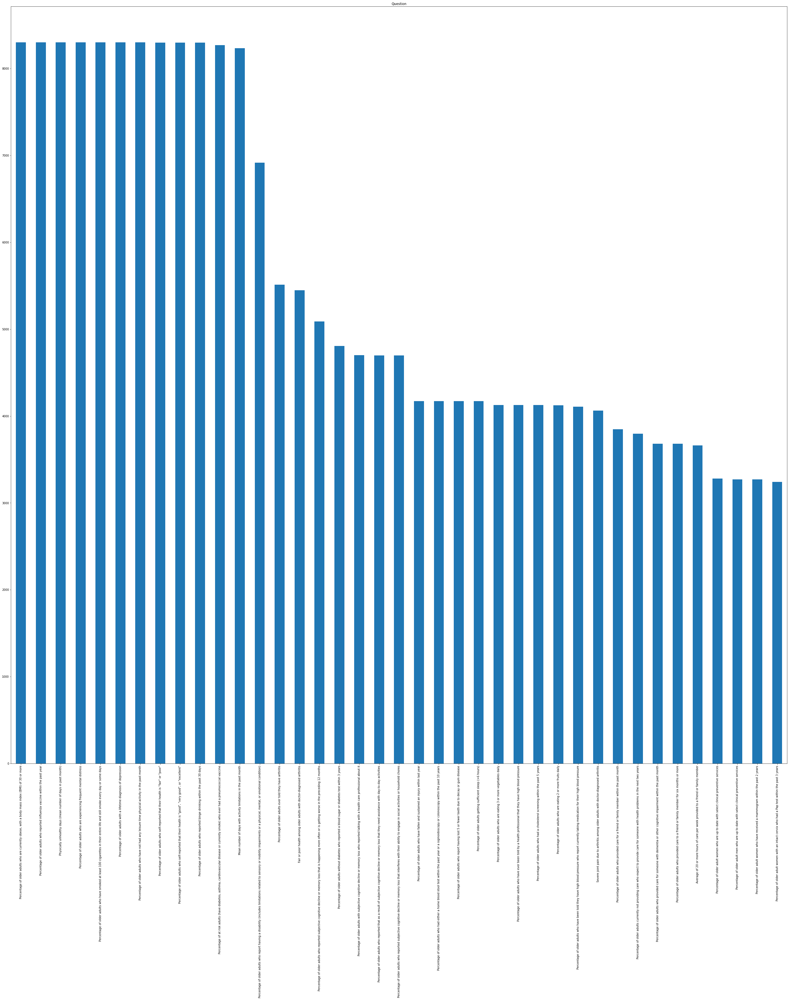

Data_Value_Unit


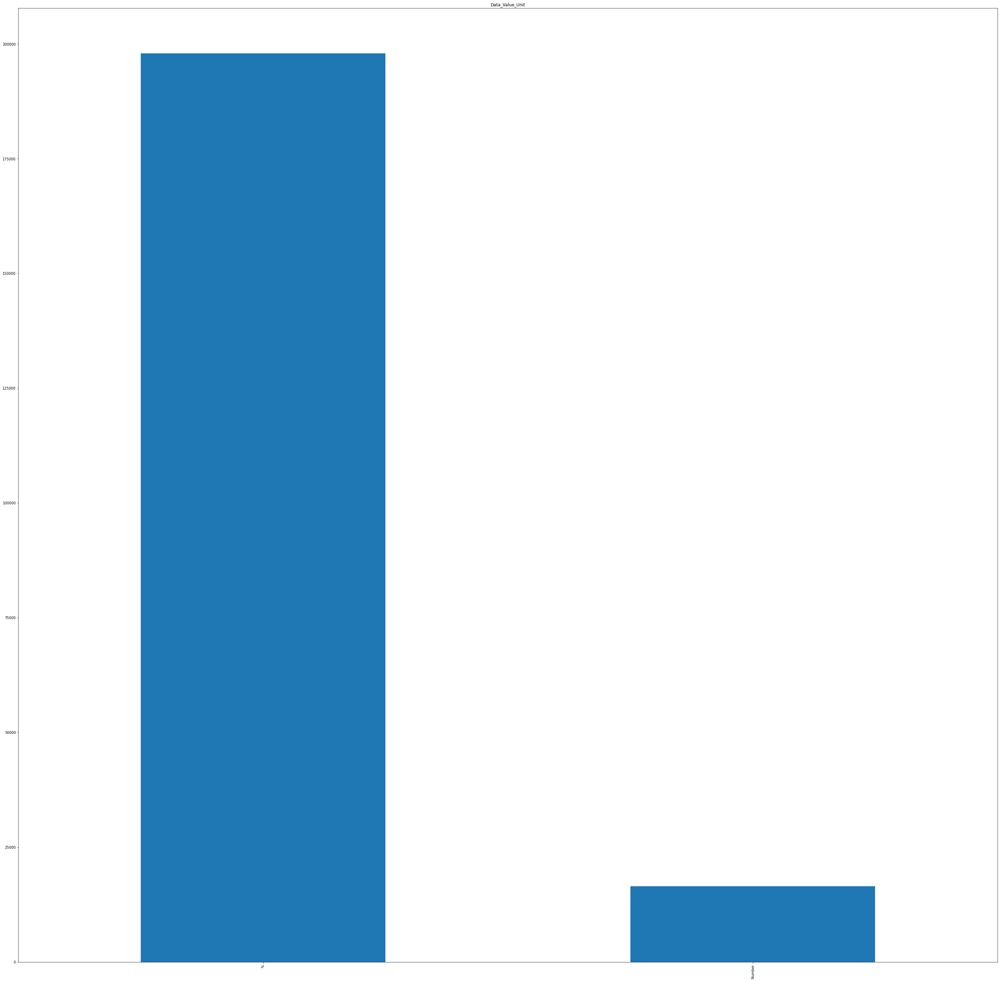

DataValueTypeID


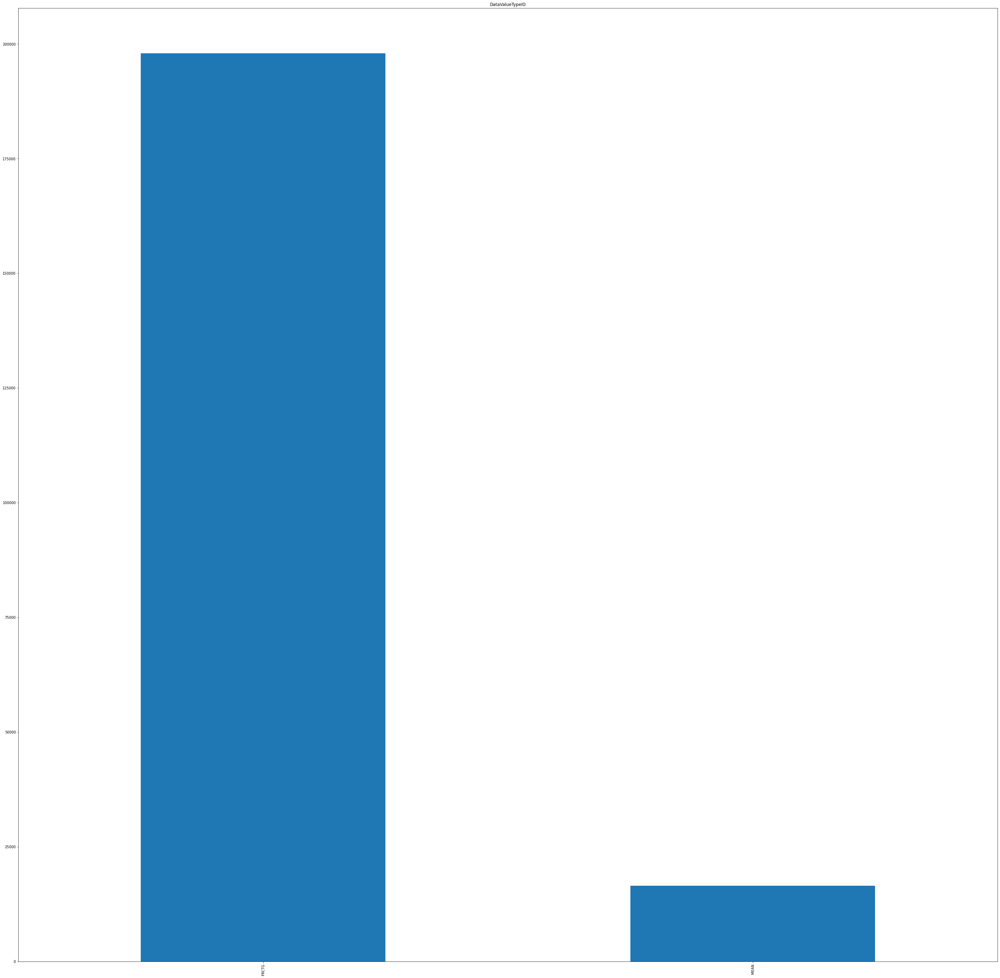

Data_Value_Type


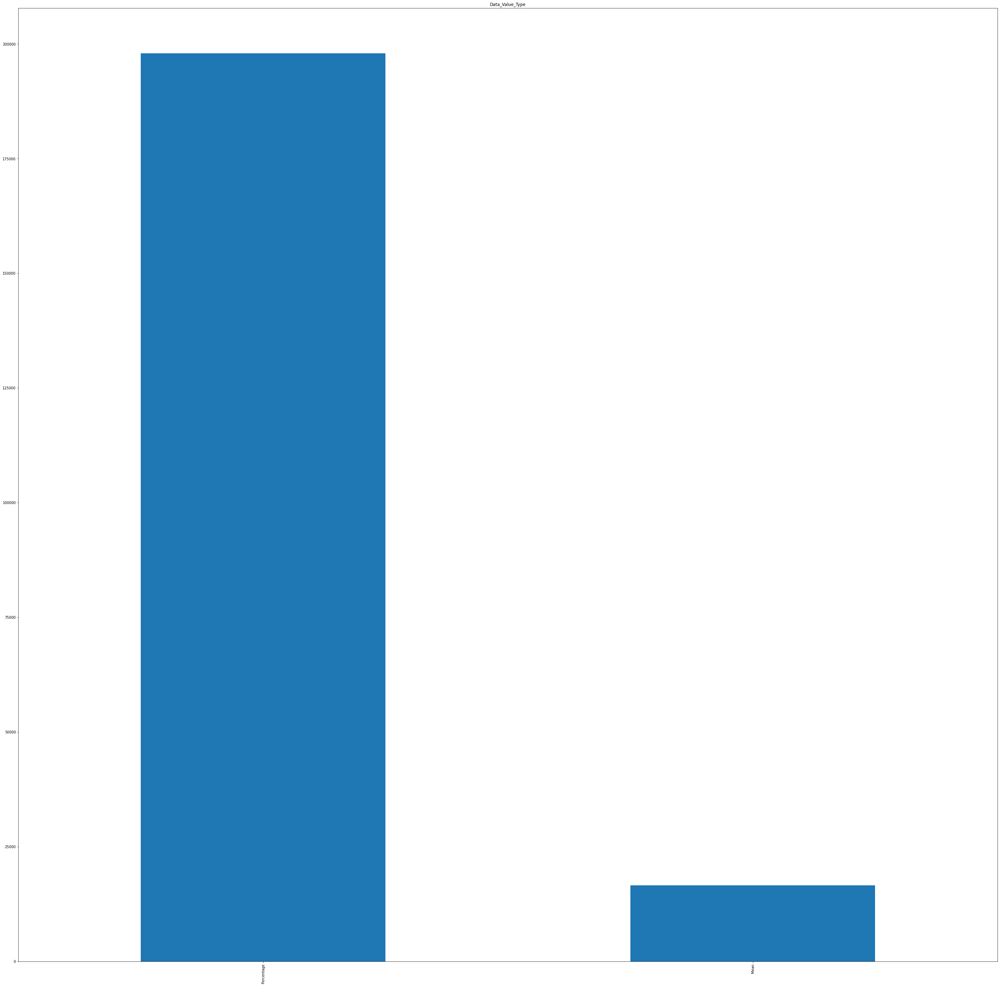

StratificationCategory1


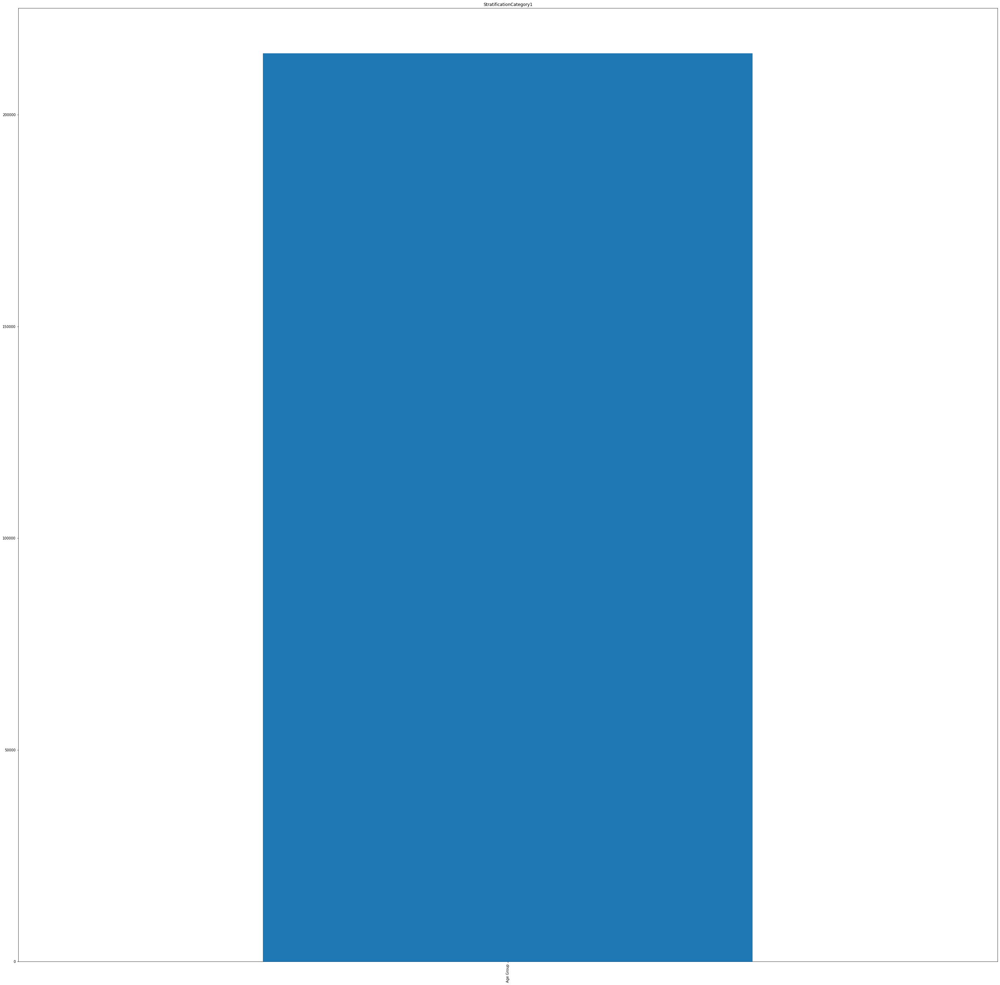

Stratification1


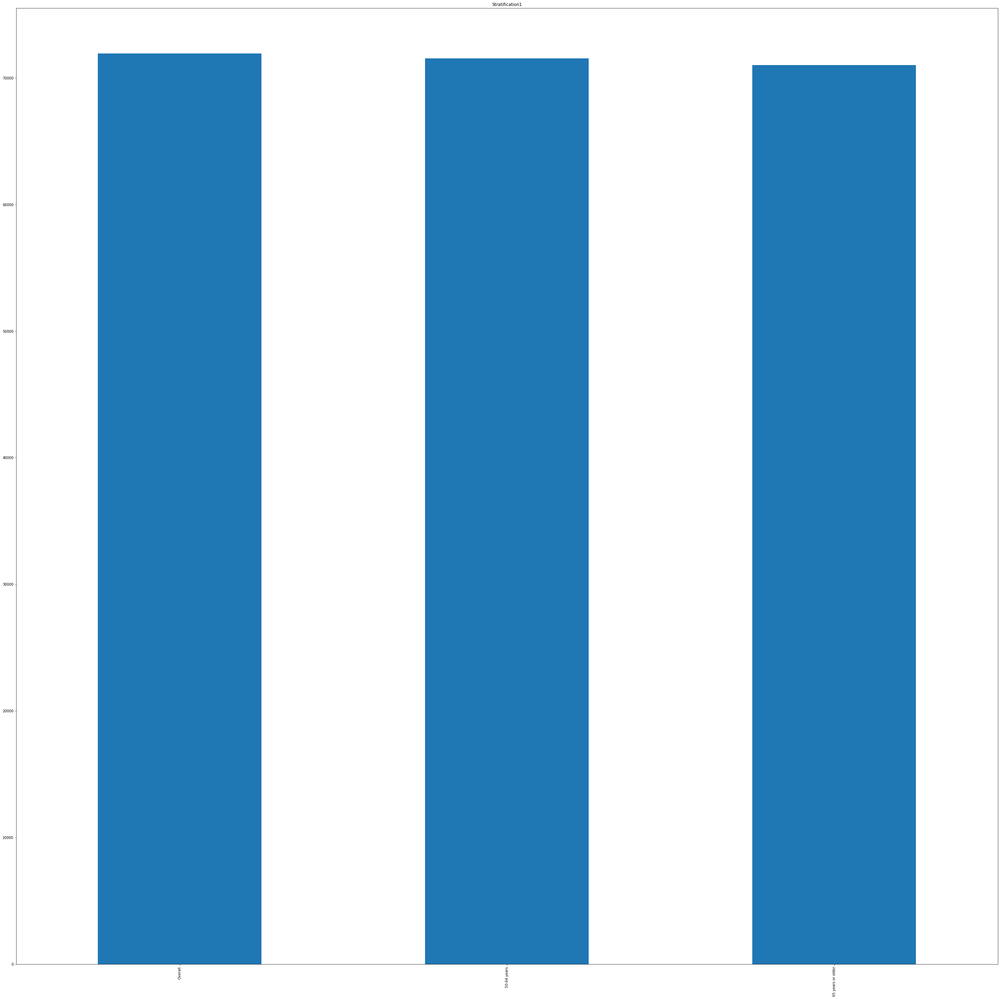

StratificationCategory2


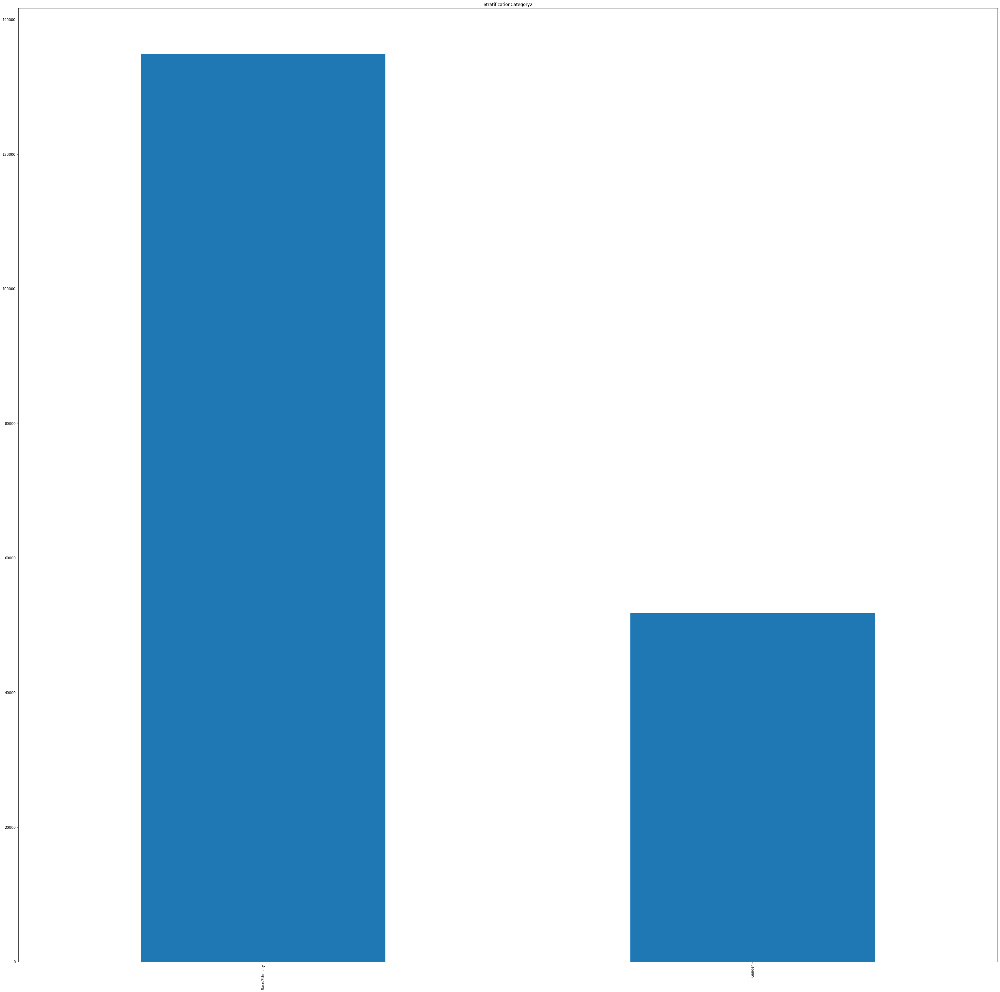

Stratification2


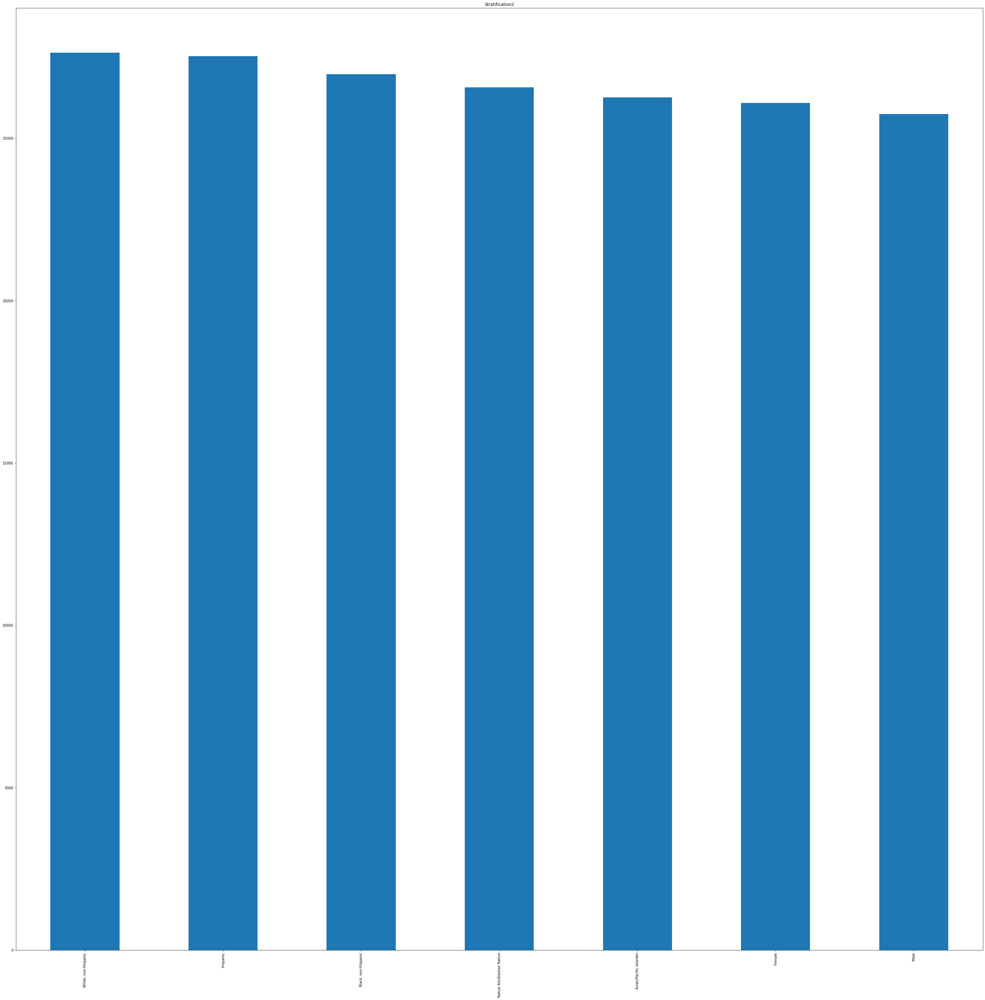

ClassID


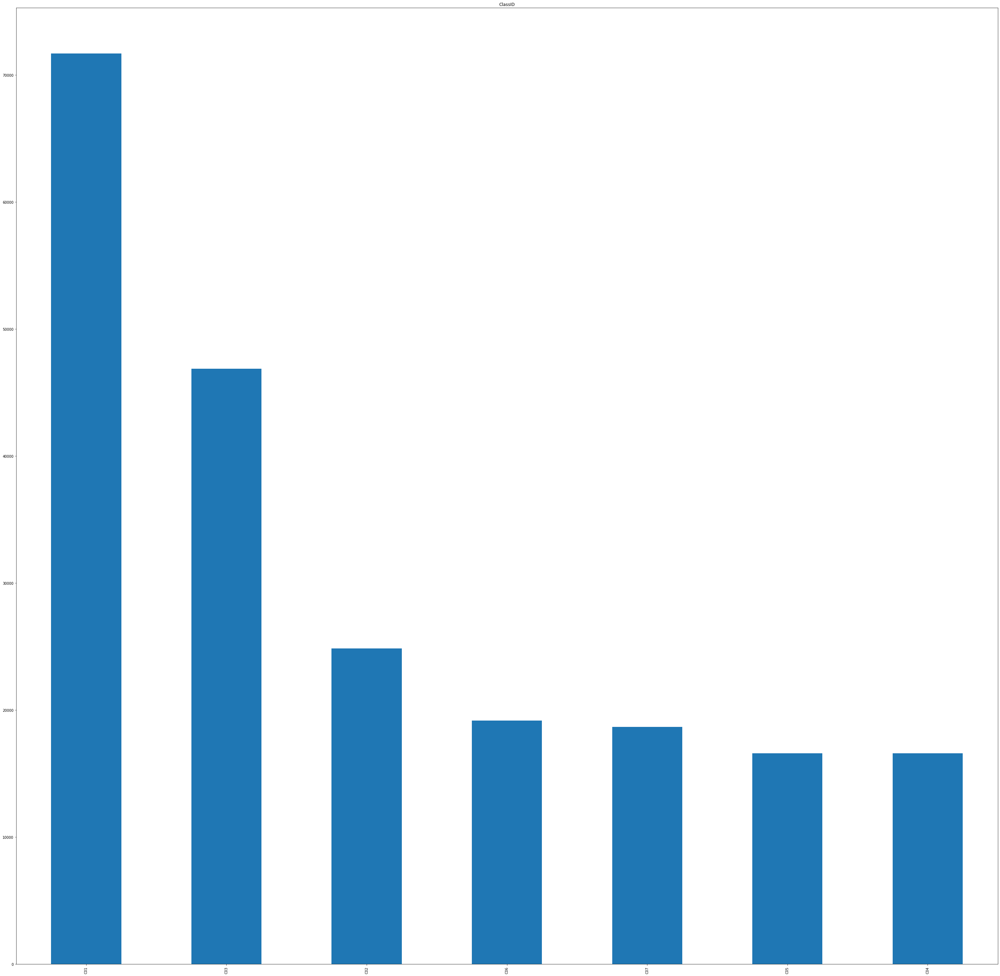

TopicID


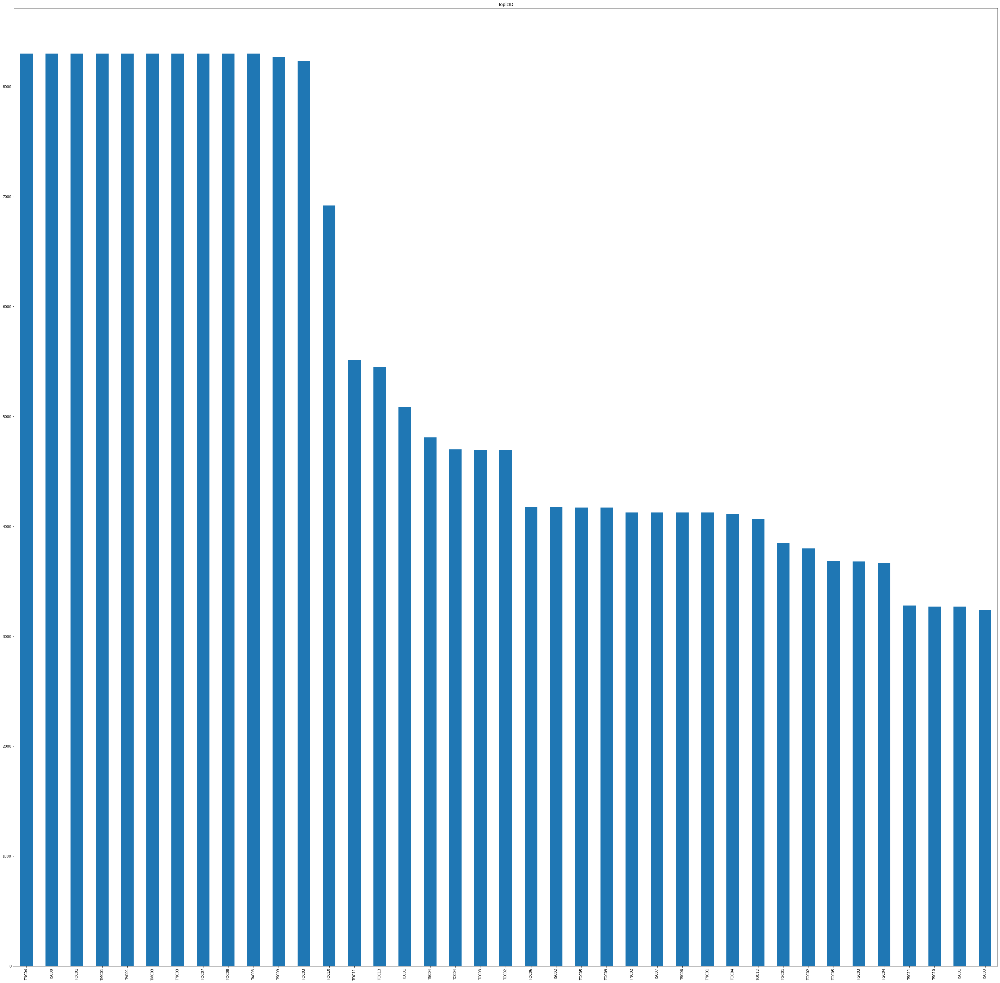

QuestionID


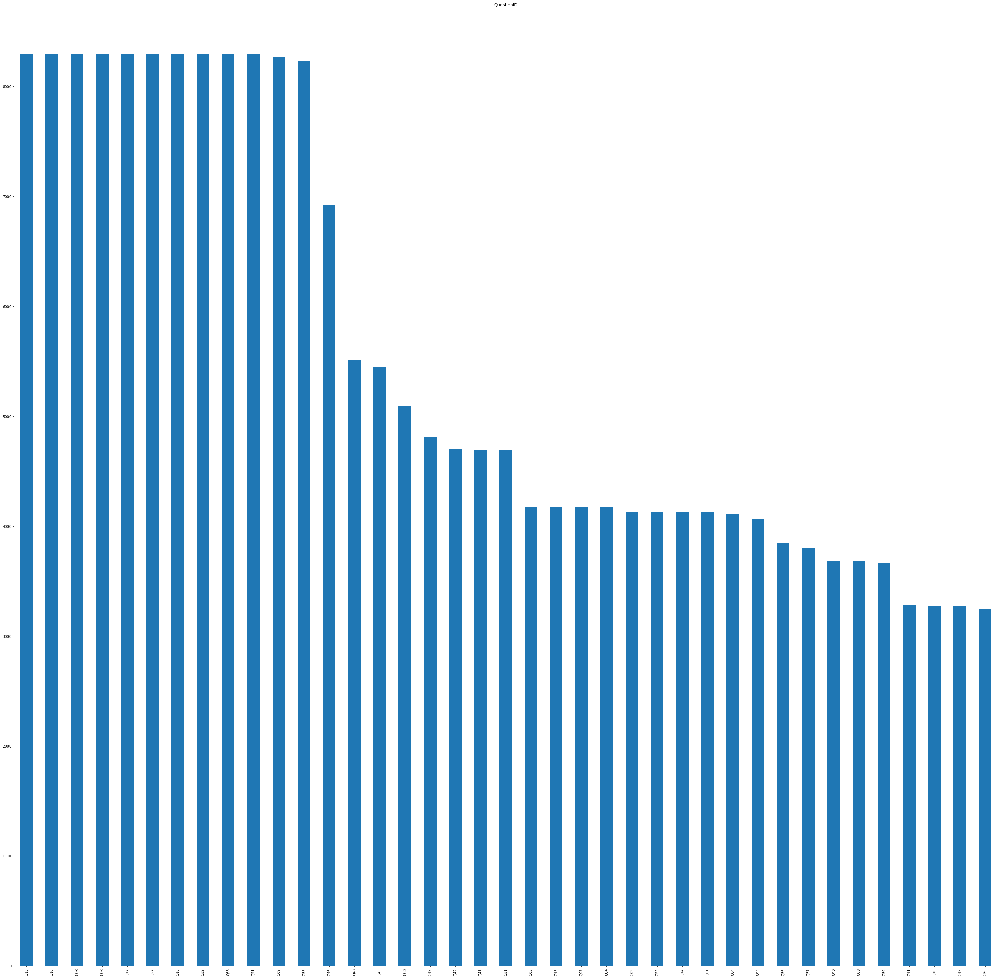

LocationID


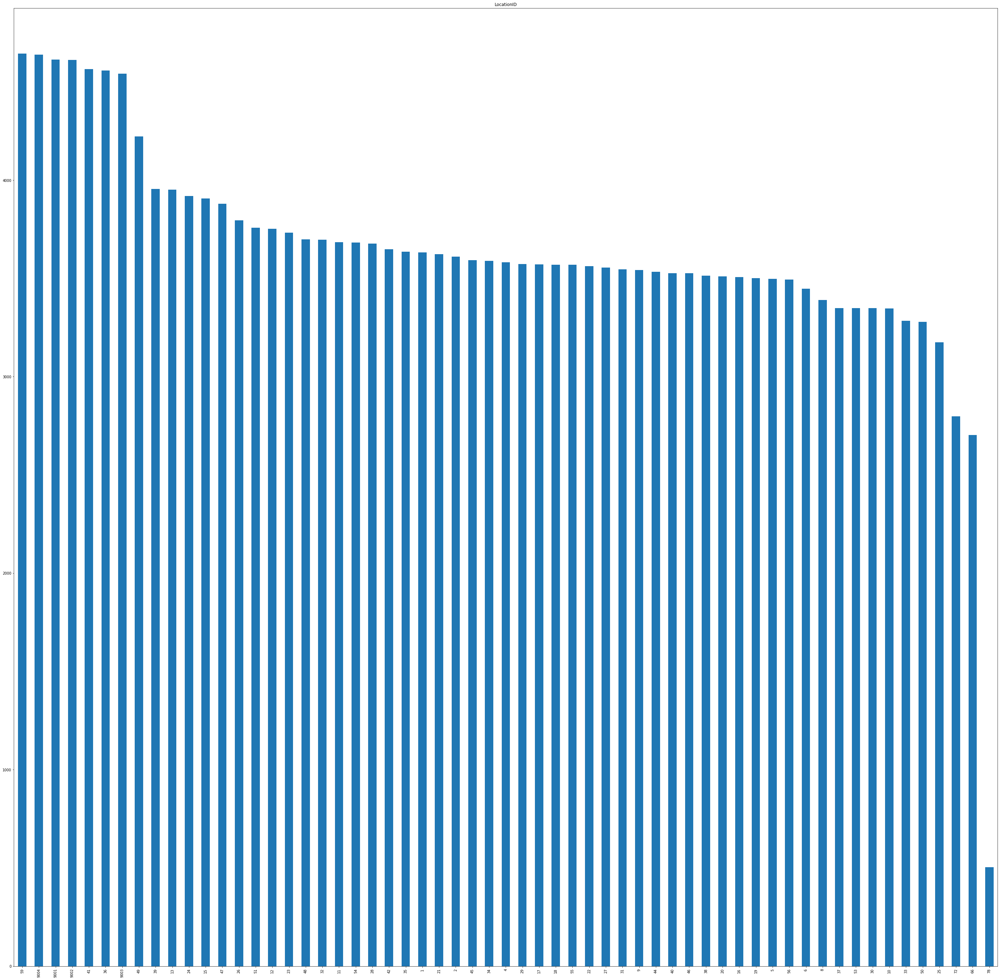

StratificationCategoryID1


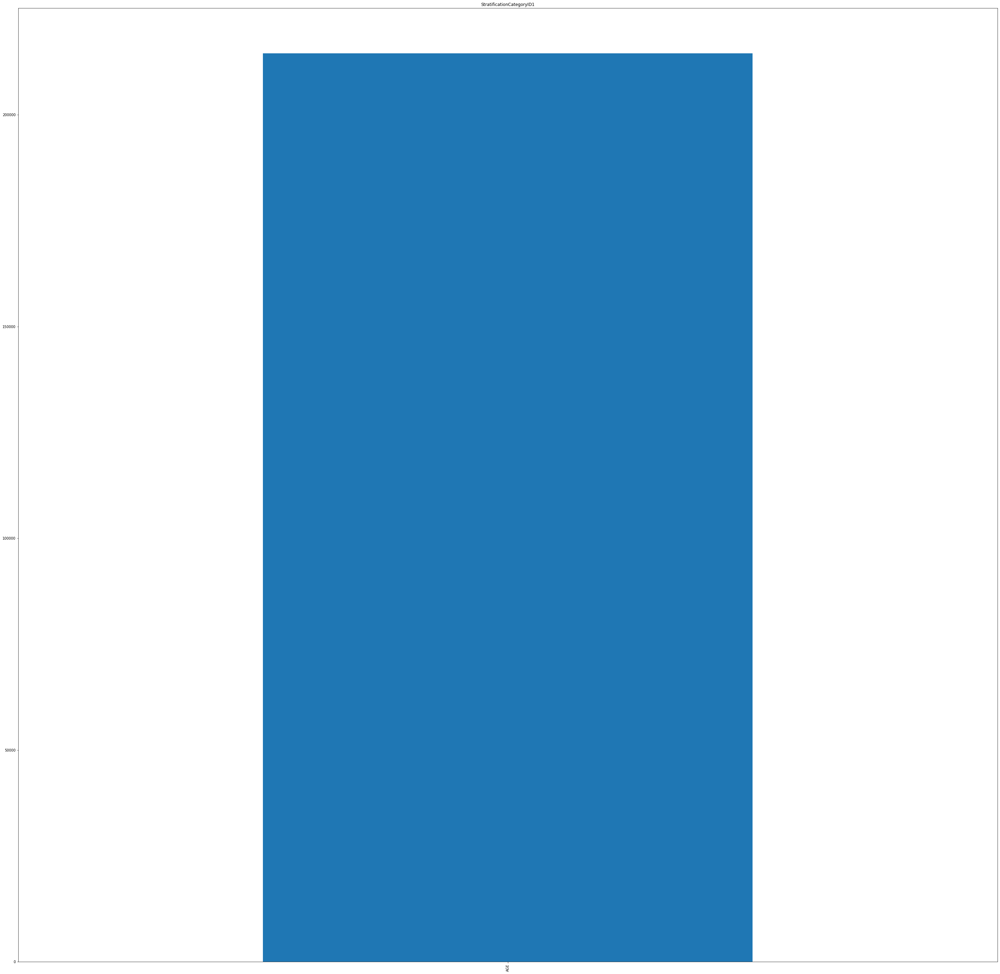

StratificationID1


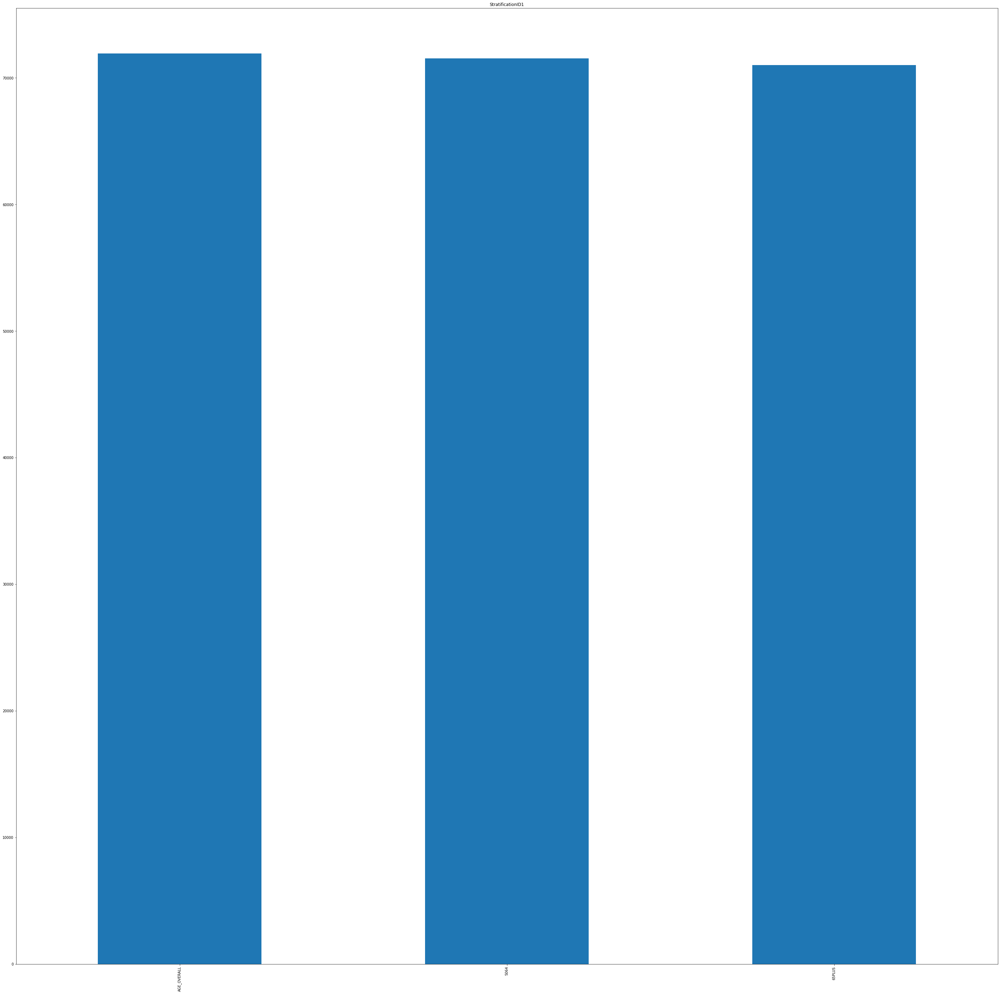

StratificationCategoryID2


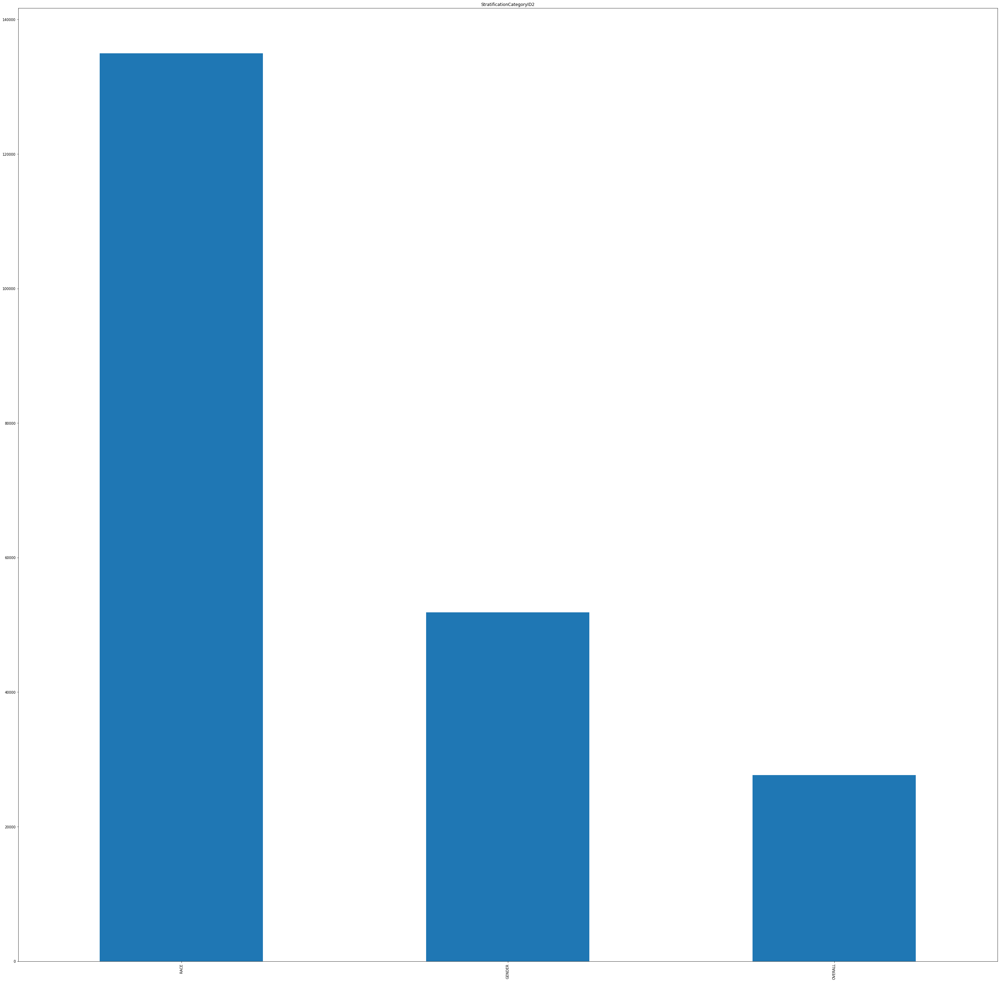

StratificationID2


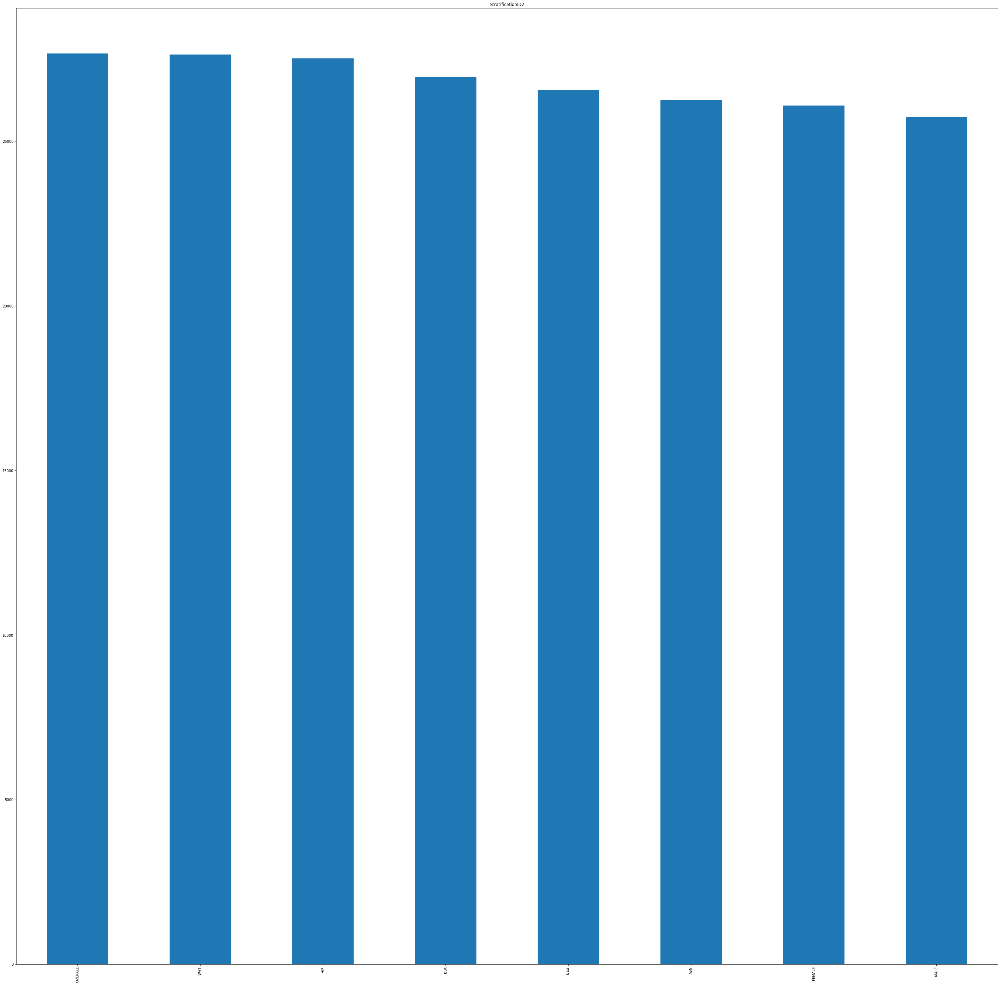

In [6]:
#使用直方图、盒图等检查数据分布及离群点
#使用条形图查看标称属性的数据分布
plt.rcParams['font.size'] = 40
for idx, attr in enumerate(nominalAttr):
    #plt.subplot(5,2,idx+1)
    print(attr)
    data[attr].value_counts().plot.bar(title = attr,figsize = (50,50))
    plt.show()

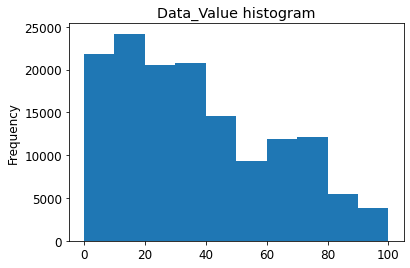

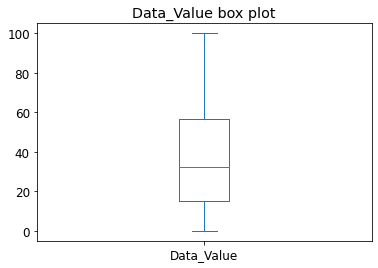

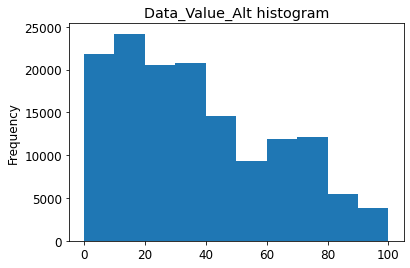

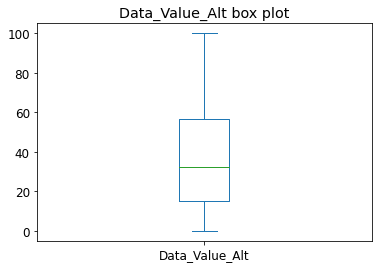

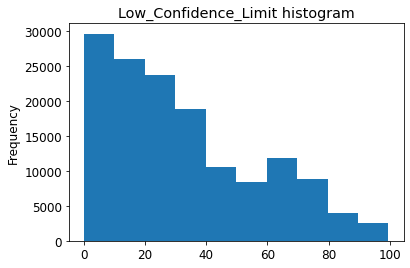

...

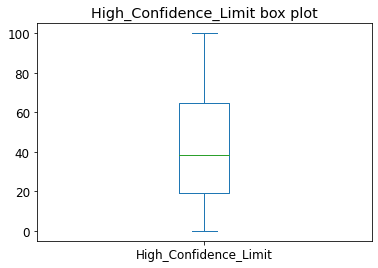

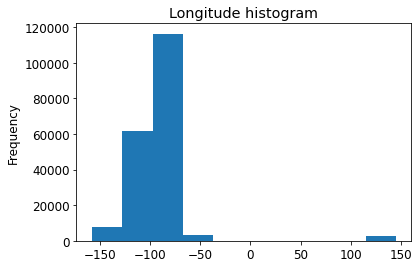

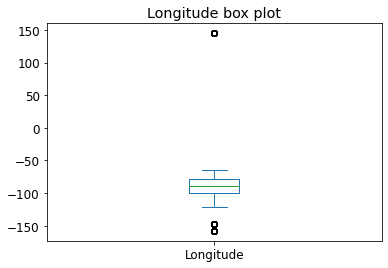

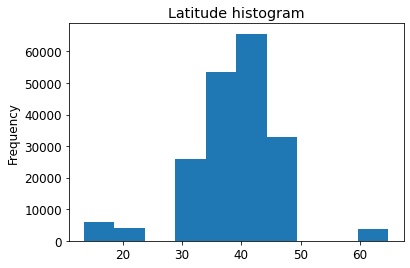

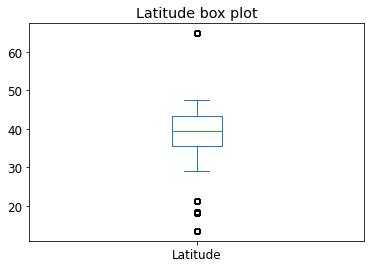

In [7]:
#使用直方图、盒图检查数据分布及离群点
plt.rcParams['font.size'] = 12
for attr in numetricAttr:
    data[attr].plot.hist(title = attr+" histogram",bins =10)#直方图
    plt.show()
    data[attr].plot.box(title = attr+" box plot")#盒图
    plt.show()

图中离散的小圆圈就是离群点,从上图可以看到Data_Value，Data_Value_Alt和High_Confidence_Limit都没有离群点；Low_Confidence_Limit只有一个超过上限的点；Longitude和Latitude都有三个离群点。总体来说数据还是较为集中的。

## 2. 数据缺失处理
观察数据集中缺失数据，分析其缺失的原因。分别使用下列四种策略对缺失值进行处理:

将缺失部分剔除
用最高频率值来填补缺失值
通过属性的相关关系来填补缺失值
通过数据对象之间的相似性来填补缺失值
注意：在处理后完成，要对比新旧数据集的差异。

In [8]:
print("该数据集中缺失数据情况如下所示：")
print(data.isnull().sum())

该数据集中缺失数据情况如下所示：
YearStart                         0
YearEnd                           0
LocationAbbr                      0
LocationDesc                      0
Datasource                        0
Class                             0
Topic                             0
Question                          0
Data_Value_Unit                   0
DataValueTypeID                   0
Data_Value_Type                   0
Data_Value                    69833
Data_Value_Alt                69833
Low_Confidence_Limit          69990
High_Confidence_Limit         69990
Sample_Size                  214462
StratificationCategory1           0
Stratification1                   0
StratificationCategory2       27669
Stratification2               27669
Geolocation                   23049
ClassID                           0
TopicID                           0
QuestionID                        0
LocationID                        0
StratificationCategoryID1         0
StratificationID1                 0
Stratificat

可以发现，本数据集共有29个属性（不含笔者增添的属性），其中Sample_Size全部为空，对于缺失属性的分析如下：
* Data_Value和Data_Value_Alt表示数据的真实值，都缺失69833个，原因可能是涉及隐私难以公开；
* Low_Confidence_Limit和High_Confidence_Limit分别表示数据置信区间的下限和上限，缺失原因可能是样本统计值的缺失或记录不全；
* Sample_Size是指用于收集数据的样本大小，该属性全部缺失，原因可能是在数据收集过程中没有收集到这些属性的信息；
* StratificationCategory2和Stratification2分别指第二个用于分层的类别和具体层次，缺失的原因可能是并不适用，只要有一个就行了；
* Geolocation是收集数据的位置的纬度和经度，缺失可能是因为未记录；
* Longitude和Latitude是笔者为了方便处理增添的两个数值属性，分别表示收集数据位置的经度和维度，与Geolocation同理

### 2.1 数据剔除

In [9]:
def compare_dataset_nominal(befDs,aftDs,nominalAttr):
    for attr in nominalAttr:
        if attr in ['LocationAbbr','LocationDesc','Topic','Question','TopicID','QuestionID','LocationID']:
            plt.rcParams['font.size'] = 40
            figx = 60
            figy = 40
        else:
            plt.rcParams['font.size'] = 12
            figx = 12
            figy = 10
        plt.subplot(1,2,1)
        befDs[attr].value_counts().plot.bar(title = attr+" before handle",figsize=(figx,figy))
        plt.subplot(1,2,2)
        aftDs[attr].value_counts().plot.bar(title = attr+" after handle",figsize = (figx,figy))
        plt.show()
        print("属性{}处理前条形图如下所示".format(attr))
        print(befDs[attr].value_counts())
        print("属性{}处理后条形图如下所示".format(attr))
        print(aftDs[attr].value_counts())
    
def compare_dataset_numetric(befDs,aftDs,numetricAttr,ifbox = False):
    plt.rcParams['font.size'] = 12
    figx = 12
    figy = 10
    for attr in numetricAttr:
        if ifbox:
            plt.subplot(2,2,1)
            befDs[attr].plot.hist(title = attr+" histogram before handle",bins = 10,figsize=(figx,figy),color='r')#直方图
            plt.subplot(2,2,2)
            aftDs[attr].plot.hist(title = attr+ " histogram after handle",bins = 10,figsize=(figx,figy),color ='r')
            plt.subplot(2,2,3)
            befDs[attr].plot.box(title = attr+" box plot",figsize = (figx,figy))#盒图
            plt.subplot(2,2,4)
            aftDs[attr].plot.box(title = attr+" box plot",figsize = (figx,figy))
            plt.show()
        else:
            plt.subplot(1,2,1)
            befDs[attr].plot.hist(title = attr+" histogram before handle",bins = 10,figsize=(figx,figy),color='r')#直方图
            plt.subplot(1,2,2)
            aftDs[attr].plot.hist(title = attr+ " histogram after handle",bins = 10,figsize=(figx,figy),color ='r')
            plt.show()
        print("属性{}处理前五数概括如下所示".format(attr))
        getFiveDes(befDs,attr)
        print("属性{}处理后五数概括如下所示".format(attr))
        getFiveDes(aftDs,attr) 

def compare_dataset(befDs,aftDs):
    print("开始对比标称属性")
    compare_dataset_nominal(befDs,aftDs,nominalAttr)

    print("开始对比数值属性")
    compare_dataset_numetric(befDs,aftDs,numetricAttr)

In [10]:
#将Sample_Size属性剔除
data.drop('Sample_Size', axis=1,inplace=True)    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 214462 entries, 0 to 214461
Data columns (total 30 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   YearStart                  214462 non-null  int64  
 1   YearEnd                    214462 non-null  int64  
 2   LocationAbbr               214462 non-null  object 
 3   LocationDesc               214462 non-null  object 
 4   Datasource                 214462 non-null  object 
 5   Class                      214462 non-null  object 
 6   Topic                      214462 non-null  object 
 7   Question                   214462 non-null  object 
 8   Data_Value_Unit            214462 non-null  object 
 9   DataValueTypeID            214462 non-null  object 
 10  Data_Value_Type            214462 non-null  object 
 11  Data_Value                 144629 non-null  float64
 12  Data_Value_Alt             144629 non-null  float64
 13  Low_Confidence_Limit       14

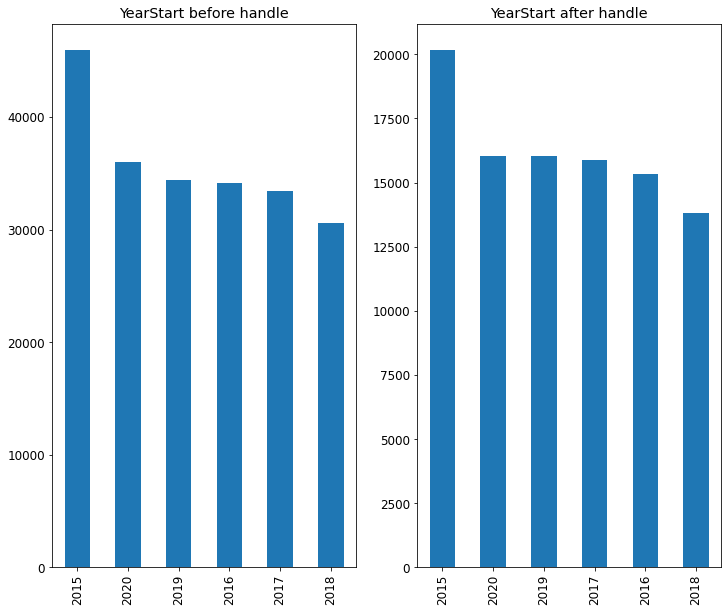

属性YearStart处理前条形图如下所示
2015    45980
2020    36006
2019    34354
2016    34145
2017    33429
2018    30548
Name: YearStart, dtype: int64
属性YearStart处理后条形图如下所示
2015    20184
2020    16039
2019    16017
2017    15862
2016    15315
2018    13821
Name: YearStart, dtype: int64


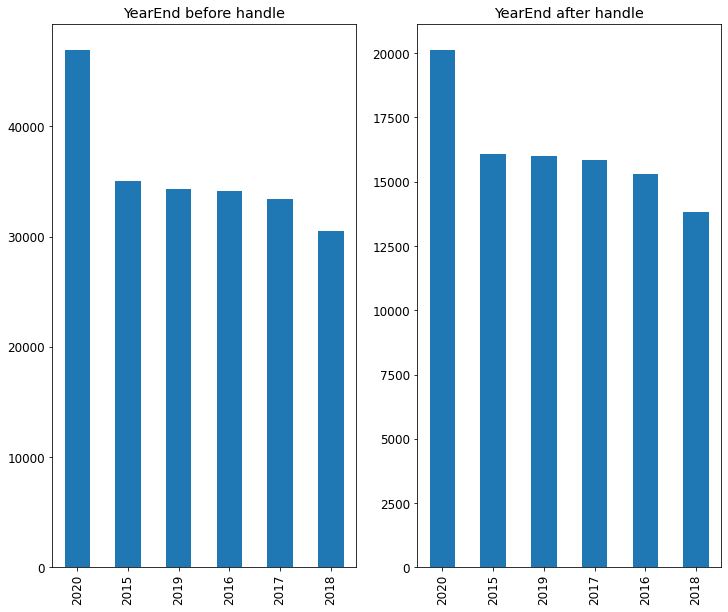

属性YearEnd处理前条形图如下所示
2020    46966
2015    35020
2019    34354
2016    34145
2017    33429
2018    30548
Name: YearEnd, dtype: int64
属性YearEnd处理后条形图如下所示
2020    20142
2015    16081
2019    16017
2017    15862
2016    15315
2018    13821
Name: YearEnd, dtype: int64


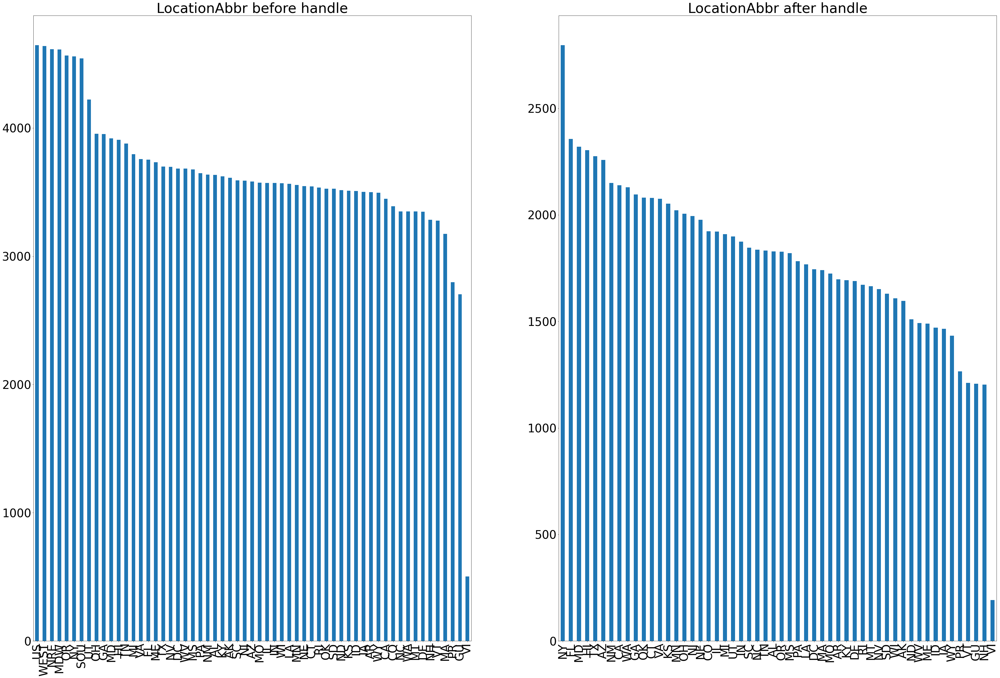

属性LocationAbbr处理前条形图如下所示
US      4644
WEST    4638
NRE     4614
MDW     4611
OR      4565
NY      4557
SOU     4542
UT      4222
OH      3955
GA      3951
MD      3919
HI      3907
TN      3879
MI      3796
VA      3758
FL      3753
ME      3733
TX      3699
NV      3696
DC      3684
WV      3682
MS      3677
PA      3648
NM      3635
AL      3633
KY      3623
AK      3611
SC      3592
NJ      3589
AZ      3582
MO      3573
IL      3571
IN      3570
WI      3569
LA      3563
MN      3555
NE      3546
CT      3543
RI      3534
OK      3526
SD      3526
ND      3514
KS      3510
ID      3507
IA      3501
AR      3498
WY      3494
CA      3447
CO      3390
NC      3349
WA      3348
MT      3348
DE      3346
NH      3284
VT      3278
MA      3174
PR      2797
GU      2703
VI       503
Name: LocationAbbr, dtype: int64
属性LocationAbbr处理后条形图如下所示
NY    2796
FL    2357
MD    2320
HI    2304
TX    2276
AZ    2258
NM    2150
CA    2139
WA    2129
GA    2096
OK    2081
CT    2079
VA    2075
KS    2

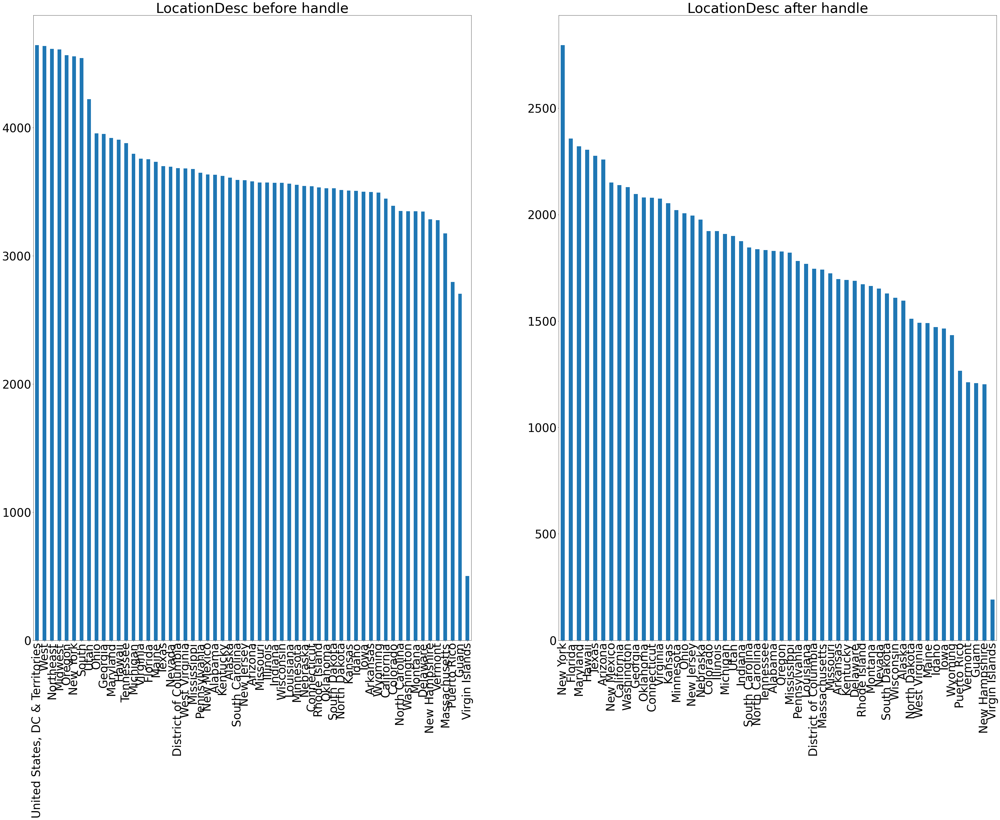

属性LocationDesc处理前条形图如下所示
United States, DC & Territories    4644
West                               4638
Northeast                          4614
Midwest                            4611
Oregon                             4565
New York                           4557
South                              4542
Utah                               4222
Ohio                               3955
Georgia                            3951
Maryland                           3919
Hawaii                             3907
Tennessee                          3879
Michigan                           3796
Virginia                           3758
Florida                            3753
Maine                              3733
Texas                              3699
Nevada                             3696
District of Columbia               3684
West Virginia                      3682
Mississippi                        3677
Pennsylvania                       3648
New Mexico                         3635
Alabama        

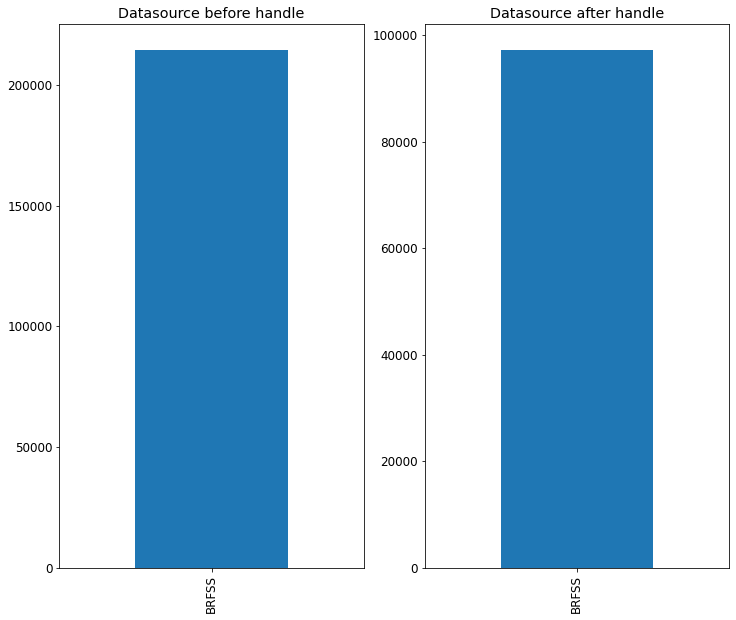

属性Datasource处理前条形图如下所示
BRFSS    214462
Name: Datasource, dtype: int64
属性Datasource处理后条形图如下所示
BRFSS    97238
Name: Datasource, dtype: int64


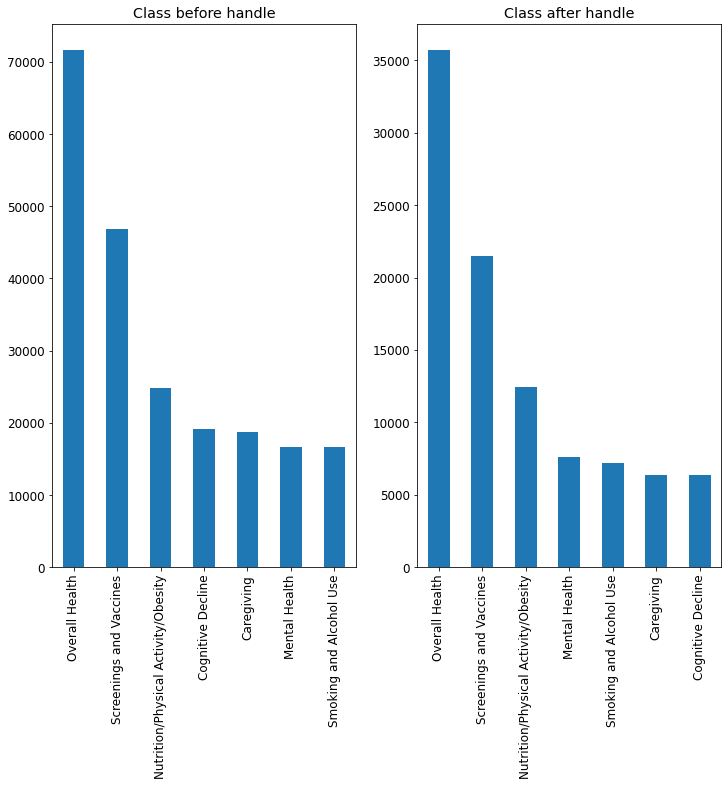

属性Class处理前条形图如下所示
Overall Health                         71694
Screenings and Vaccines                46867
Nutrition/Physical Activity/Obesity    24851
Cognitive Decline                      19180
Caregiving                             18671
Mental Health                          16600
Smoking and Alcohol Use                16599
Name: Class, dtype: int64
属性Class处理后条形图如下所示
Overall Health                         35737
Screenings and Vaccines                21503
Nutrition/Physical Activity/Obesity    12453
Mental Health                           7595
Smoking and Alcohol Use                 7178
Caregiving                              6399
Cognitive Decline                       6373
Name: Class, dtype: int64


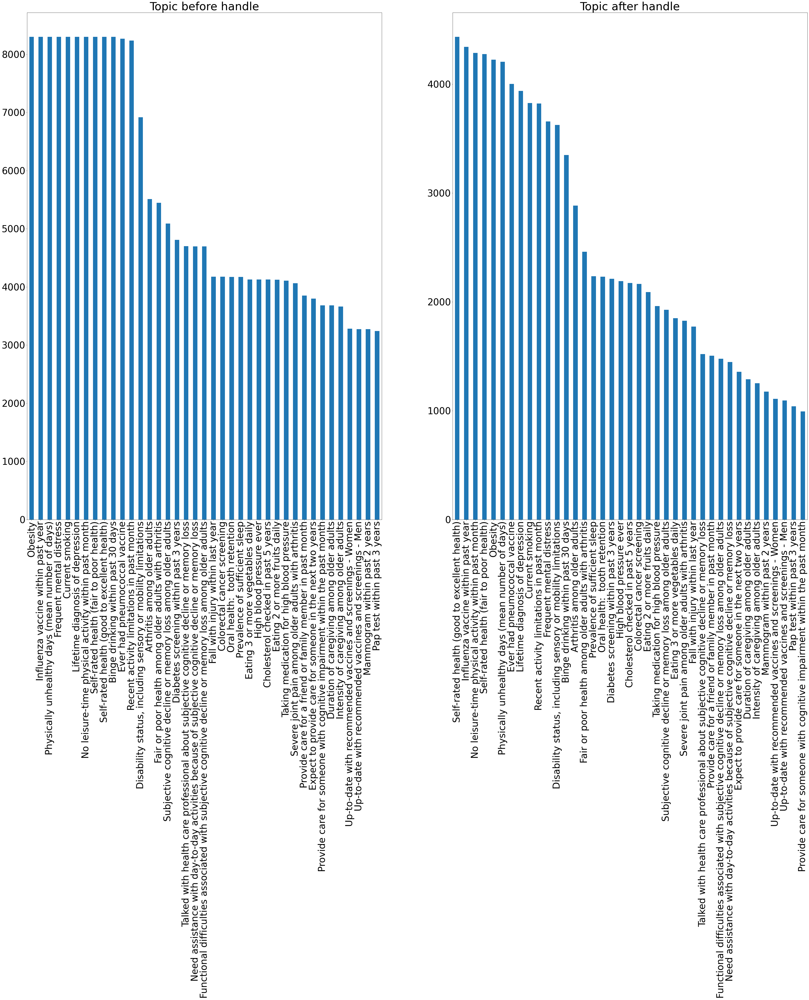

属性Topic处理前条形图如下所示
Obesity                                                                                                   8300
Influenza vaccine within past year                                                                        8300
Physically unhealthy days (mean number of days)                                                           8300
Frequent mental distress                                                                                  8300
Current smoking                                                                                           8300
Lifetime diagnosis of depression                                                                          8300
No leisure-time physical activity within past month                                                       8300
Self-rated health (fair to poor health)                                                                   8299
Self-rated health (good to excellent health)                                                  

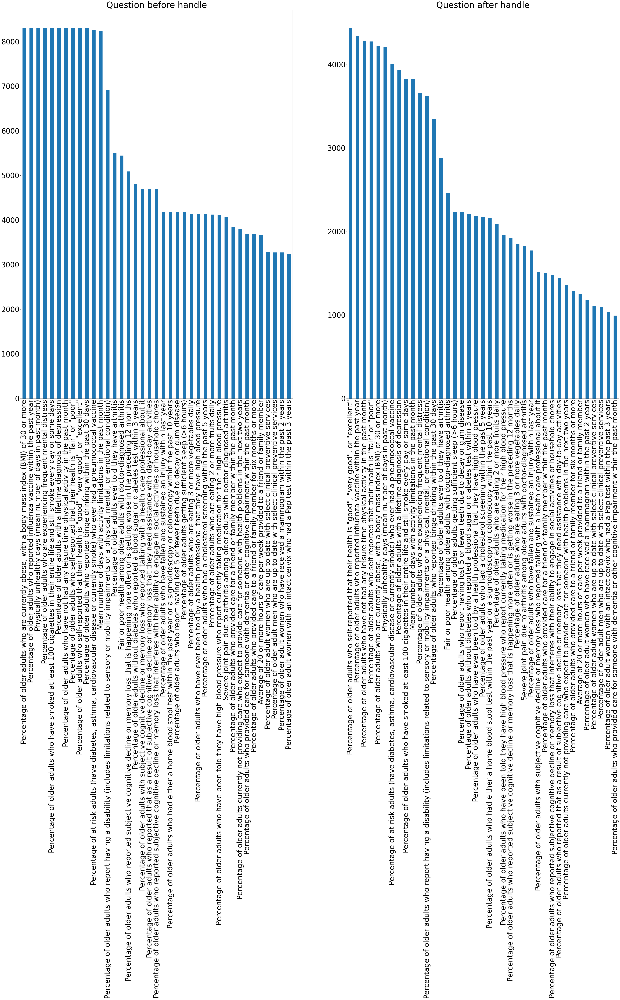

属性Question处理前条形图如下所示
Percentage of older adults who are currently obese, with a body mass index (BMI) of 30 or more                                                                               8300
Percentage of older adults who reported influenza vaccine within the past year                                                                                               8300
Physically unhealthy days (mean number of days in past month)                                                                                                                8300
Percentage of older adults who are experiencing frequent mental distress                                                                                                     8300
Percentage of older adults who have smoked at least 100 cigarettes in their entire life and still smoke every day or some days                                               8300
Percentage of older adults with a lifetime diagnosis of depression                       

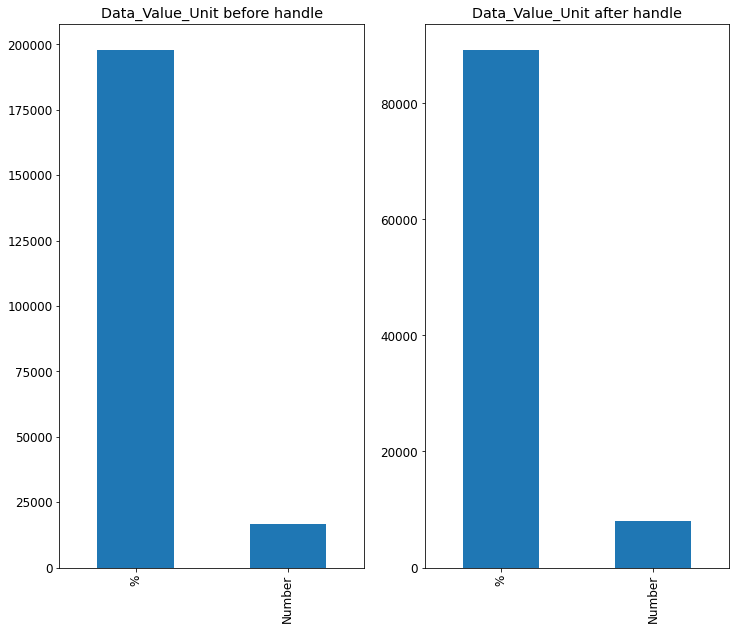

属性Data_Value_Unit处理前条形图如下所示
%         197929
Number     16533
Name: Data_Value_Unit, dtype: int64
属性Data_Value_Unit处理后条形图如下所示
%         89209
Number     8029
Name: Data_Value_Unit, dtype: int64


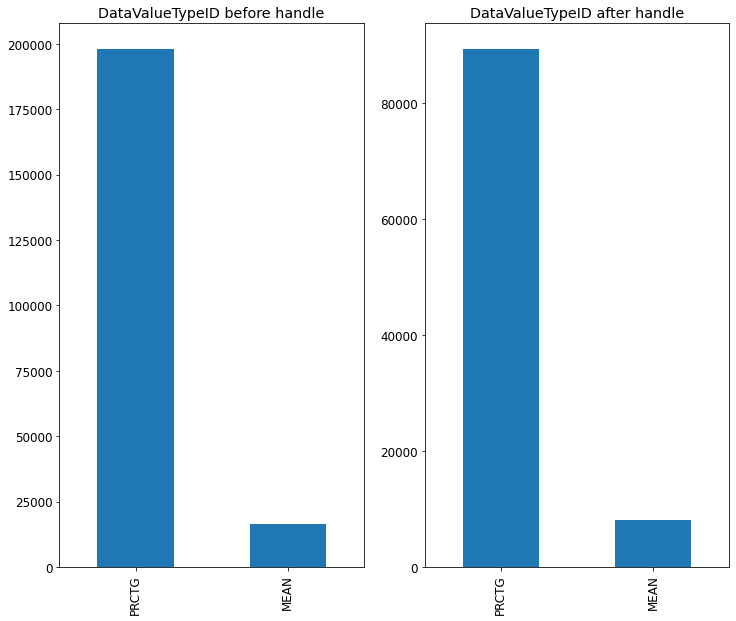

属性DataValueTypeID处理前条形图如下所示
PRCTG    197929
MEAN      16533
Name: DataValueTypeID, dtype: int64
属性DataValueTypeID处理后条形图如下所示
PRCTG    89209
MEAN      8029
Name: DataValueTypeID, dtype: int64


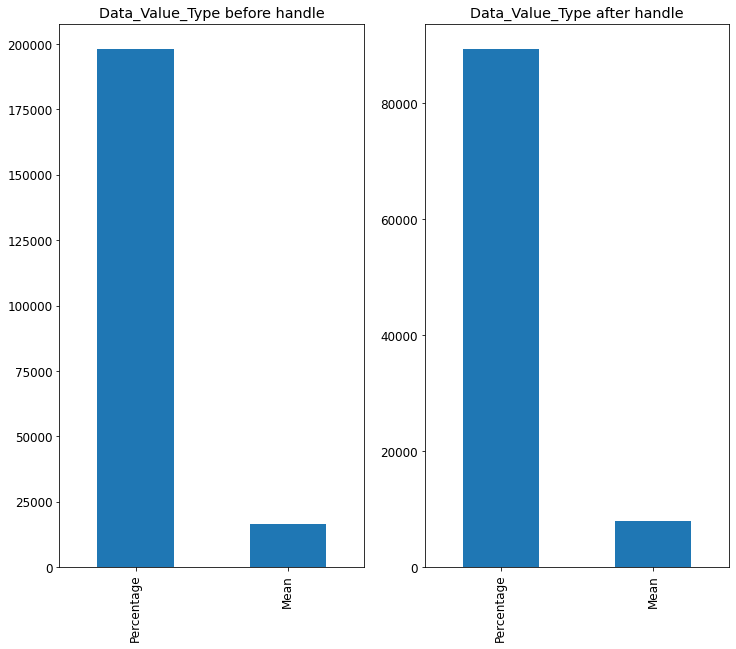

属性Data_Value_Type处理前条形图如下所示
Percentage    197929
Mean           16533
Name: Data_Value_Type, dtype: int64
属性Data_Value_Type处理后条形图如下所示
Percentage    89209
Mean           8029
Name: Data_Value_Type, dtype: int64


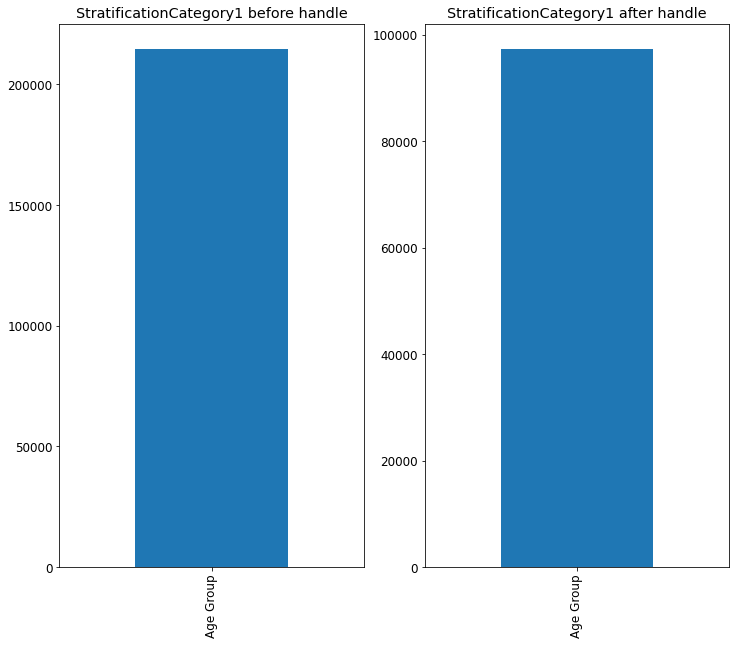

属性StratificationCategory1处理前条形图如下所示
Age Group    214462
Name: StratificationCategory1, dtype: int64
属性StratificationCategory1处理后条形图如下所示
Age Group    97238
Name: StratificationCategory1, dtype: int64


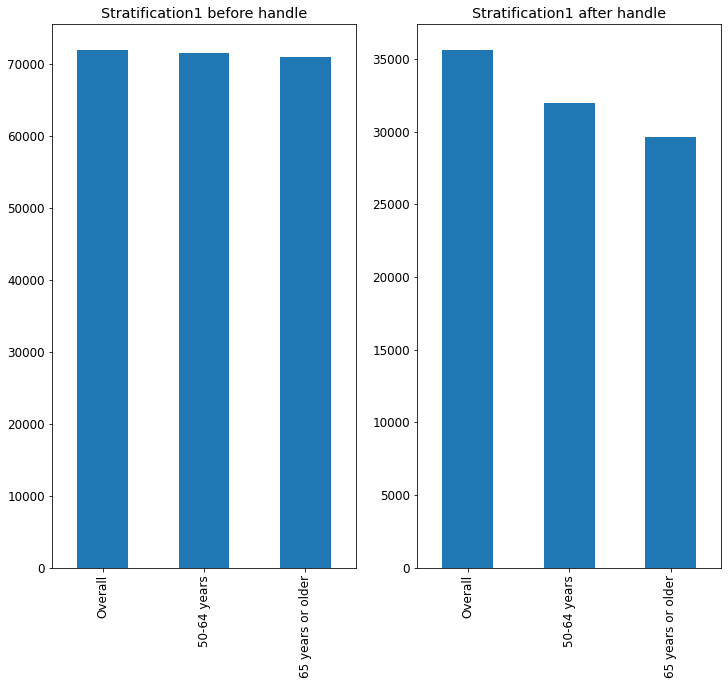

属性Stratification1处理前条形图如下所示
Overall              71919
50-64 years          71528
65 years or older    71015
Name: Stratification1, dtype: int64
属性Stratification1处理后条形图如下所示
Overall              35619
50-64 years          31989
65 years or older    29630
Name: Stratification1, dtype: int64


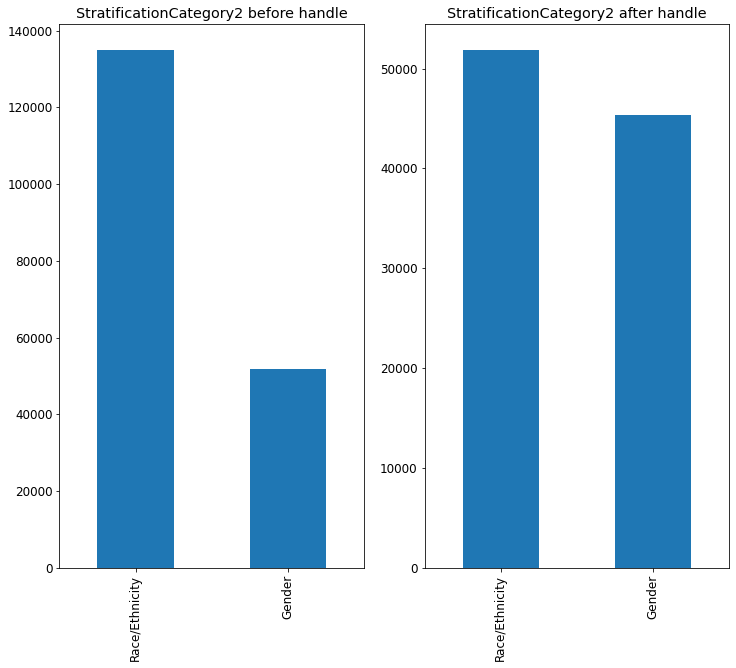

属性StratificationCategory2处理前条形图如下所示
Race/Ethnicity    134959
Gender             51834
Name: StratificationCategory2, dtype: int64
属性StratificationCategory2处理后条形图如下所示
Race/Ethnicity    51850
Gender            45388
Name: StratificationCategory2, dtype: int64


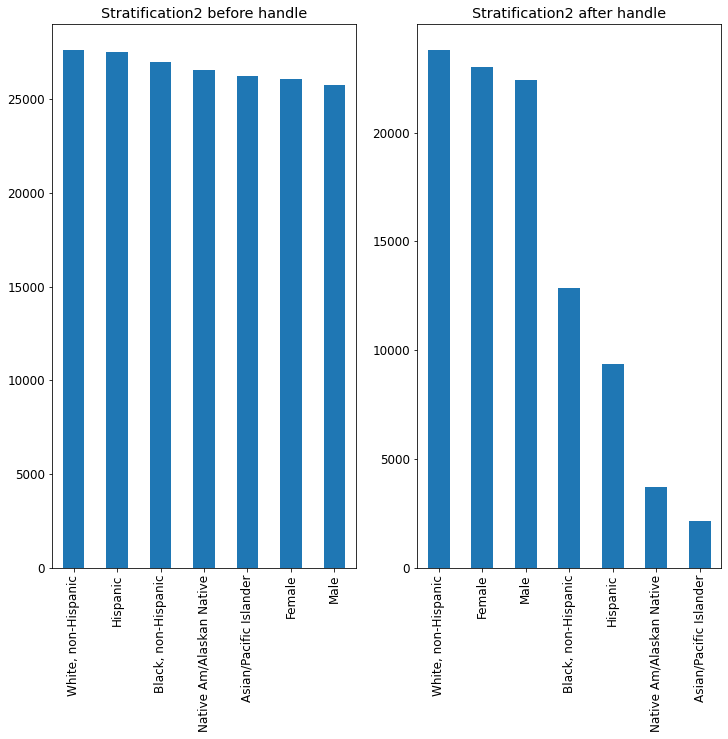

属性Stratification2处理前条形图如下所示
White, non-Hispanic         27633
Hispanic                    27525
Black, non-Hispanic         26968
Native Am/Alaskan Native    26571
Asian/Pacific Islander      26262
Female                      26091
Male                        25743
Name: Stratification2, dtype: int64
属性Stratification2处理后条形图如下所示
White, non-Hispanic         23794
Female                      22990
Male                        22398
Black, non-Hispanic         12868
Hispanic                     9338
Native Am/Alaskan Native     3709
Asian/Pacific Islander       2141
Name: Stratification2, dtype: int64


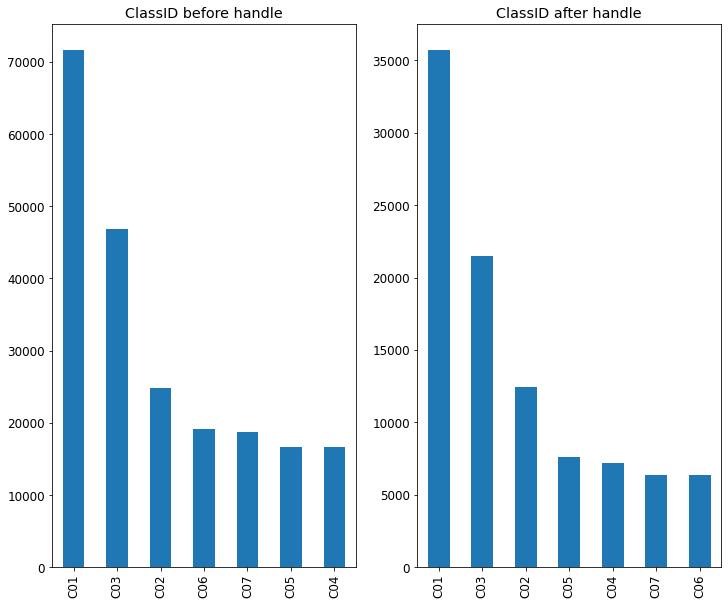

属性ClassID处理前条形图如下所示
C01    71694
C03    46867
C02    24851
C06    19180
C07    18671
C05    16600
C04    16599
Name: ClassID, dtype: int64
属性ClassID处理后条形图如下所示
C01    35737
C03    21503
C02    12453
C05     7595
C04     7178
C07     6399
C06     6373
Name: ClassID, dtype: int64


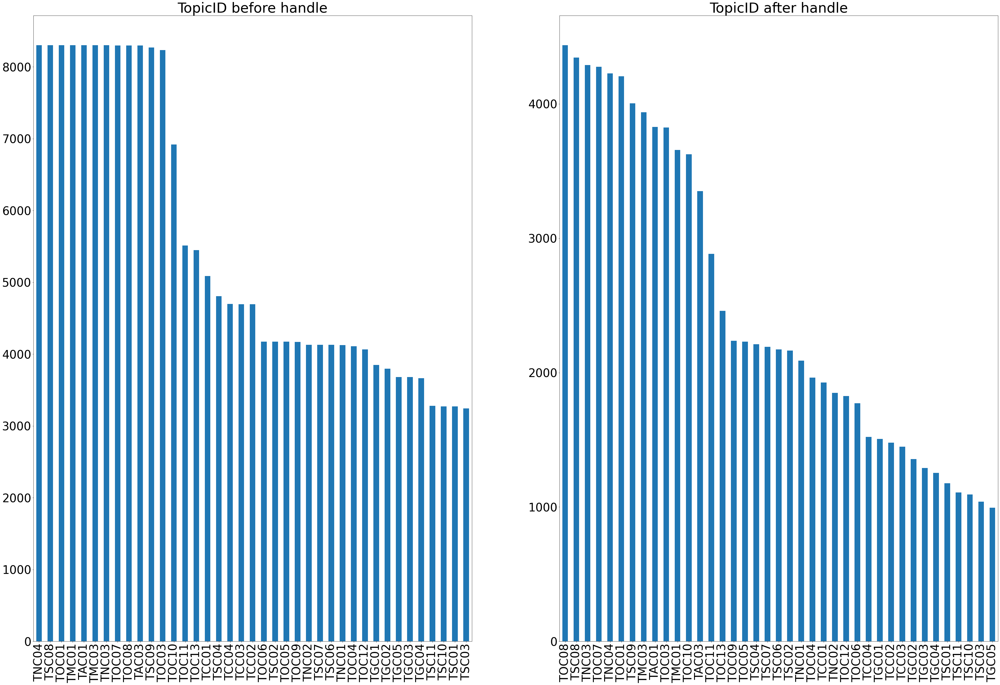

属性TopicID处理前条形图如下所示
TNC04    8300
TSC08    8300
TOC01    8300
TMC01    8300
TAC01    8300
TMC03    8300
TNC03    8300
TOC07    8299
TOC08    8299
TAC03    8299
TSC09    8268
TOC03    8233
TOC10    6917
TOC11    5511
TOC13    5447
TCC01    5088
TSC04    4808
TCC04    4700
TCC03    4696
TCC02    4696
TOC06    4173
TSC02    4173
TOC05    4172
TOC09    4171
TNC02    4127
TSC07    4127
TSC06    4127
TNC01    4124
TOC04    4108
TOC12    4064
TGC01    3848
TGC02    3797
TGC05    3682
TGC03    3681
TGC04    3663
TSC11    3280
TSC10    3271
TSC01    3271
TSC03    3242
Name: TopicID, dtype: int64
属性TopicID处理后条形图如下所示
TOC08    4436
TSC08    4344
TNC03    4288
TOC07    4276
TNC04    4226
TOC01    4206
TSC09    4003
TMC03    3938
TAC01    3828
TOC03    3823
TMC01    3657
TOC10    3625
TAC03    3350
TOC11    2884
TOC13    2460
TOC09    2236
TOC05    2231
TSC04    2211
TSC07    2191
TSC06    2173
TSC02    2164
TNC01    2090
TOC04    1962
TCC01    1926
TNC02    1849
TOC12    1826
TOC06    1772
TCC04   

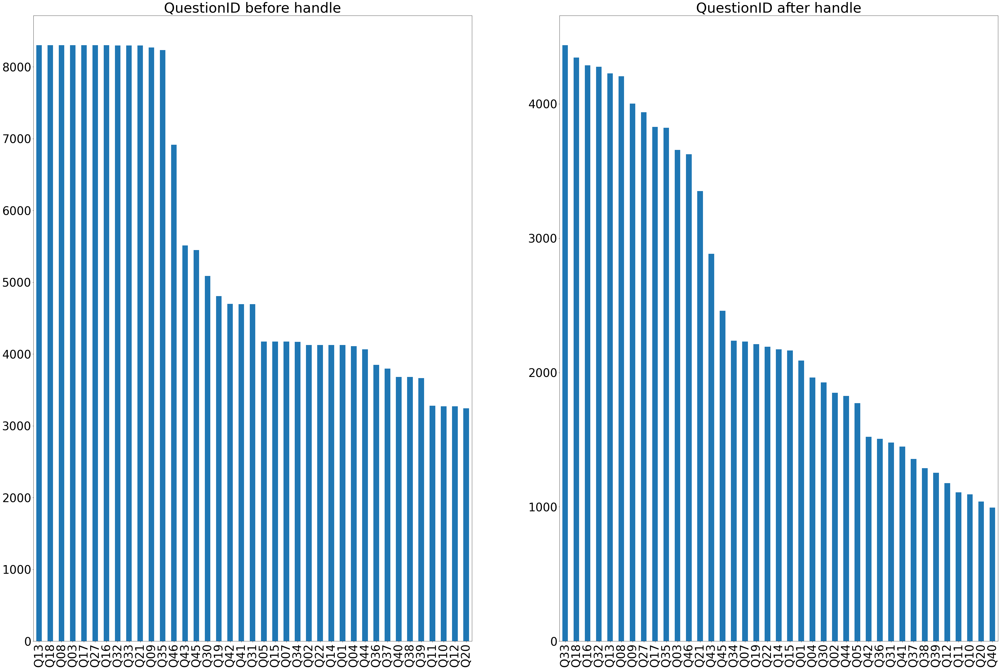

属性QuestionID处理前条形图如下所示
Q13    8300
Q18    8300
Q08    8300
Q03    8300
Q17    8300
Q27    8300
Q16    8300
Q32    8299
Q33    8299
Q21    8299
Q09    8268
Q35    8233
Q46    6917
Q43    5511
Q45    5447
Q30    5088
Q19    4808
Q42    4700
Q41    4696
Q31    4696
Q05    4173
Q15    4173
Q07    4172
Q34    4171
Q02    4127
Q22    4127
Q14    4127
Q01    4124
Q04    4108
Q44    4064
Q36    3848
Q37    3797
Q40    3682
Q38    3681
Q39    3663
Q11    3280
Q10    3271
Q12    3271
Q20    3242
Name: QuestionID, dtype: int64
属性QuestionID处理后条形图如下所示
Q33    4436
Q18    4344
Q16    4288
Q32    4276
Q13    4226
Q08    4206
Q09    4003
Q27    3938
Q17    3828
Q35    3823
Q03    3657
Q46    3625
Q21    3350
Q43    2884
Q45    2460
Q34    2236
Q07    2231
Q19    2211
Q22    2191
Q14    2173
Q15    2164
Q01    2090
Q04    1962
Q30    1926
Q02    1849
Q44    1826
Q05    1772
Q42    1521
Q36    1506
Q31    1478
Q41    1448
Q37    1357
Q38    1289
Q39    1253
Q12    1176
Q11    1108
Q10    1093
Q20    1040

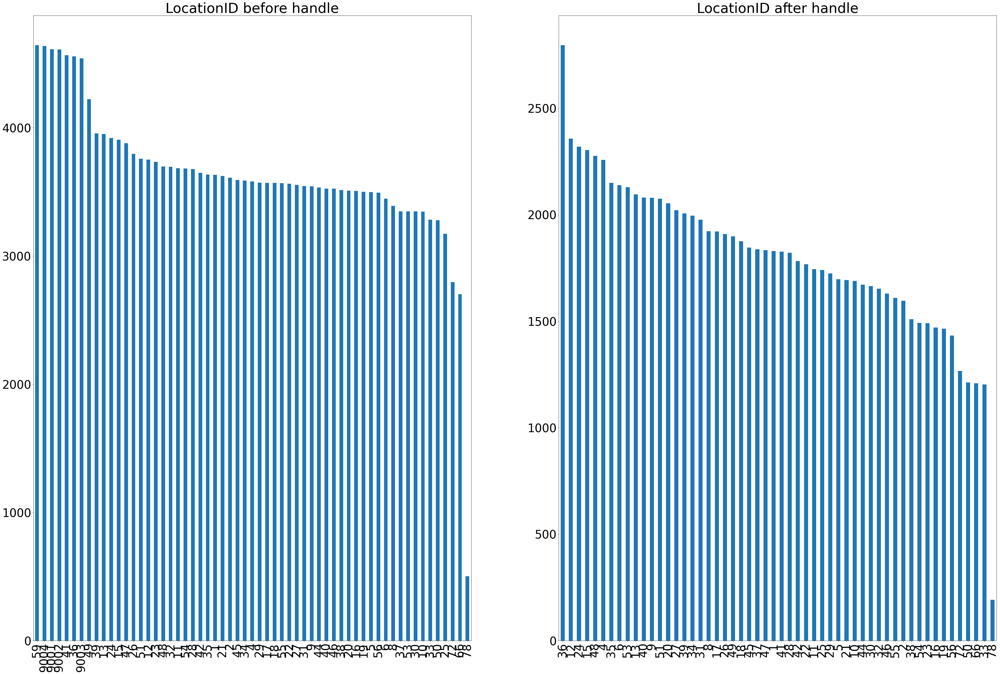

属性LocationID处理前条形图如下所示
59      4644
9004    4638
9001    4614
9002    4611
41      4565
36      4557
9003    4542
49      4222
39      3955
13      3951
24      3919
15      3907
47      3879
26      3796
51      3758
12      3753
23      3733
48      3699
32      3696
11      3684
54      3682
28      3677
42      3648
35      3635
1       3633
21      3623
2       3611
45      3592
34      3589
4       3582
29      3573
17      3571
18      3570
55      3569
22      3563
27      3555
31      3546
9       3543
44      3534
40      3526
46      3526
38      3514
20      3510
16      3507
19      3501
5       3498
56      3494
6       3447
8       3390
37      3349
53      3348
30      3348
10      3346
33      3284
50      3278
25      3174
72      2797
66      2703
78       503
Name: LocationID, dtype: int64
属性LocationID处理后条形图如下所示
36    2796
12    2357
24    2320
15    2304
48    2276
4     2258
35    2150
6     2139
53    2129
13    2096
40    2081
9     2079
51    2075
20    2053
27

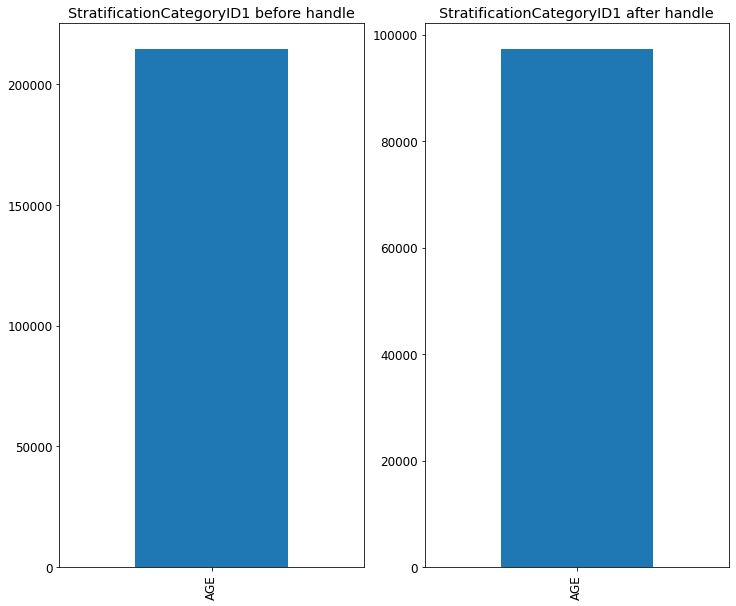

属性StratificationCategoryID1处理前条形图如下所示
AGE    214462
Name: StratificationCategoryID1, dtype: int64
属性StratificationCategoryID1处理后条形图如下所示
AGE    97238
Name: StratificationCategoryID1, dtype: int64


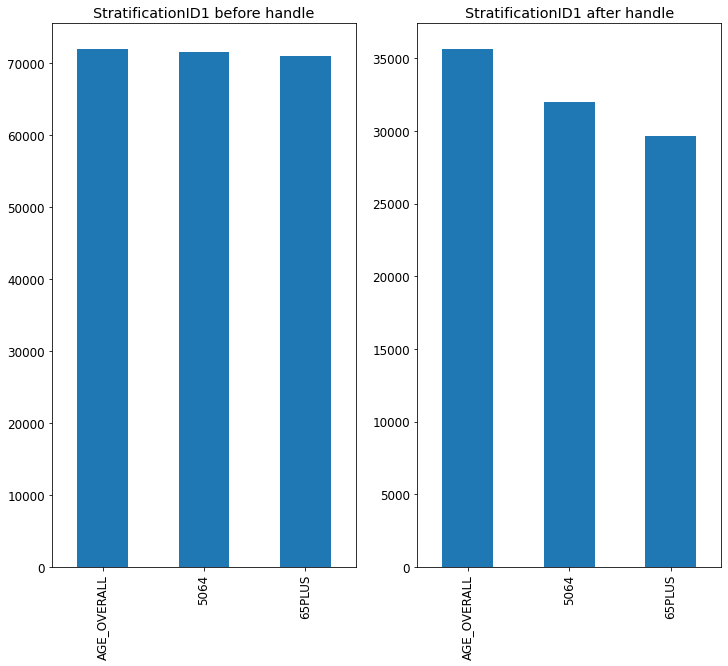

属性StratificationID1处理前条形图如下所示
AGE_OVERALL    71919
5064           71528
65PLUS         71015
Name: StratificationID1, dtype: int64
属性StratificationID1处理后条形图如下所示
AGE_OVERALL    35619
5064           31989
65PLUS         29630
Name: StratificationID1, dtype: int64


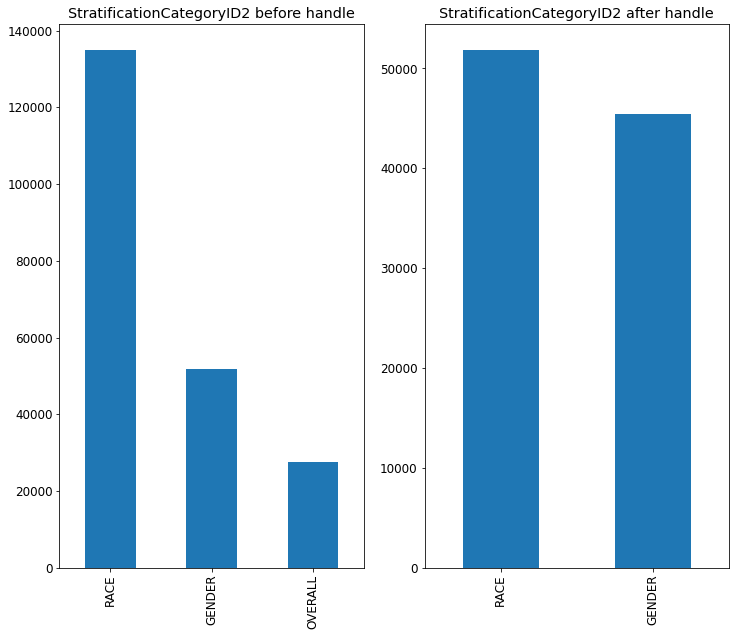

属性StratificationCategoryID2处理前条形图如下所示
RACE       134959
GENDER      51834
OVERALL     27669
Name: StratificationCategoryID2, dtype: int64
属性StratificationCategoryID2处理后条形图如下所示
RACE      51850
GENDER    45388
Name: StratificationCategoryID2, dtype: int64


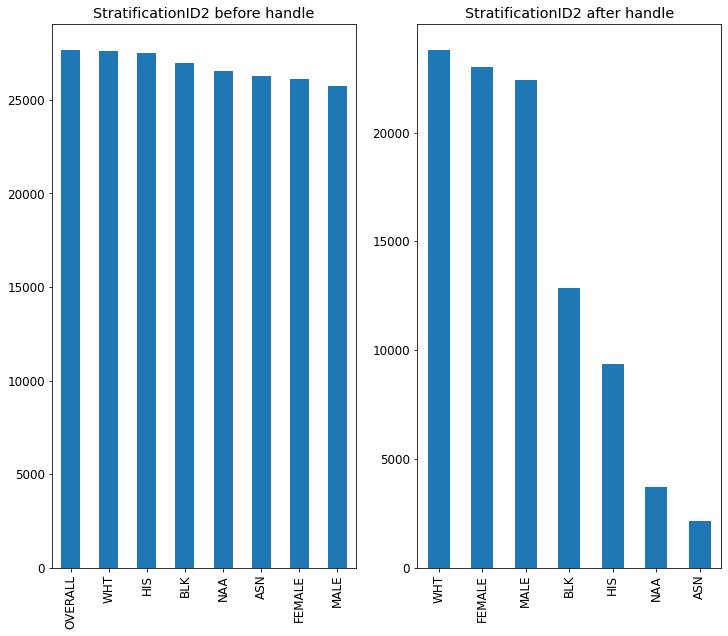

属性StratificationID2处理前条形图如下所示
OVERALL    27669
WHT        27633
HIS        27525
BLK        26968
NAA        26571
ASN        26262
FEMALE     26091
MALE       25743
Name: StratificationID2, dtype: int64
属性StratificationID2处理后条形图如下所示
WHT       23794
FEMALE    22990
MALE      22398
BLK       12868
HIS        9338
NAA        3709
ASN        2141
Name: StratificationID2, dtype: int64
开始对比数值属性


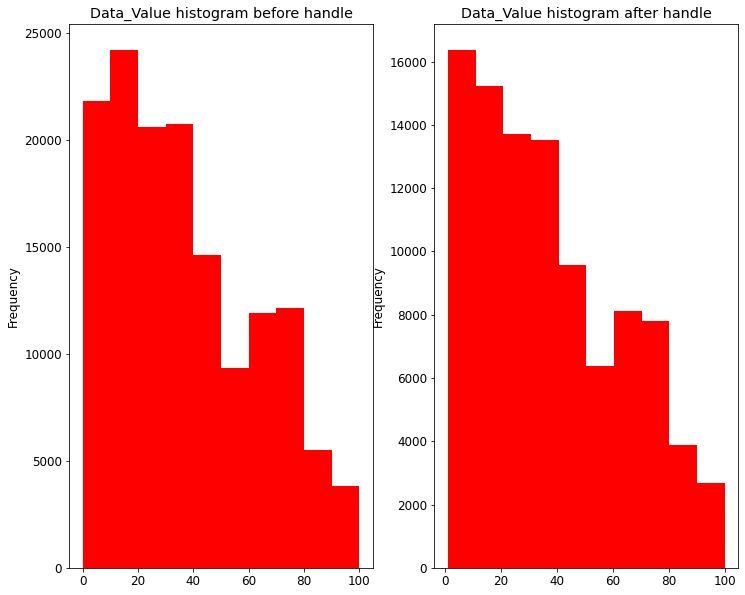

属性Data_Value处理前五数概括如下所示
对数值属性Data_Value的五数概括如下
最小值为0.0,第一四分位数为15.3,中位数为32.5,第三四分位数为56.8,最大值为100.0
属性Data_Value处理后五数概括如下所示
对数值属性Data_Value的五数概括如下
最小值为1.0,第一四分位数为15.5,中位数为32.9,第三四分位数为57.4,最大值为99.9


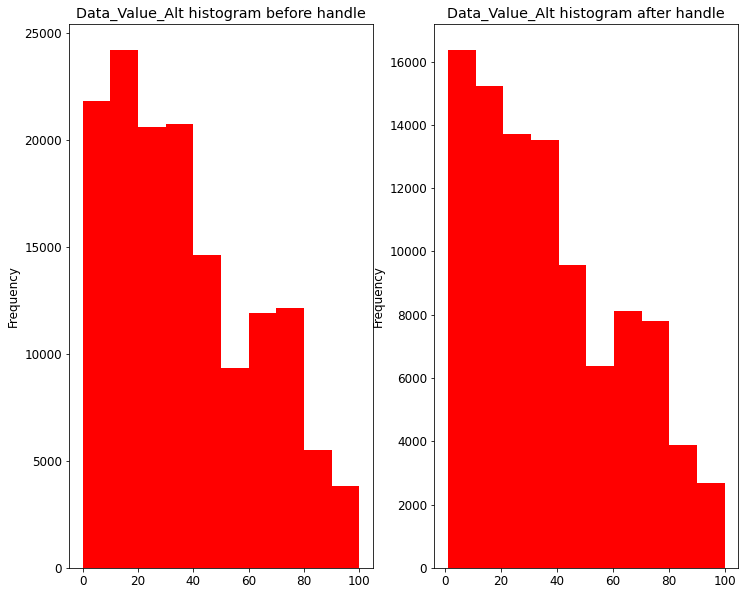

属性Data_Value_Alt处理前五数概括如下所示
对数值属性Data_Value_Alt的五数概括如下
最小值为0.0,第一四分位数为15.3,中位数为32.5,第三四分位数为56.8,最大值为100.0
属性Data_Value_Alt处理后五数概括如下所示
对数值属性Data_Value_Alt的五数概括如下
最小值为1.0,第一四分位数为15.5,中位数为32.9,第三四分位数为57.4,最大值为99.9


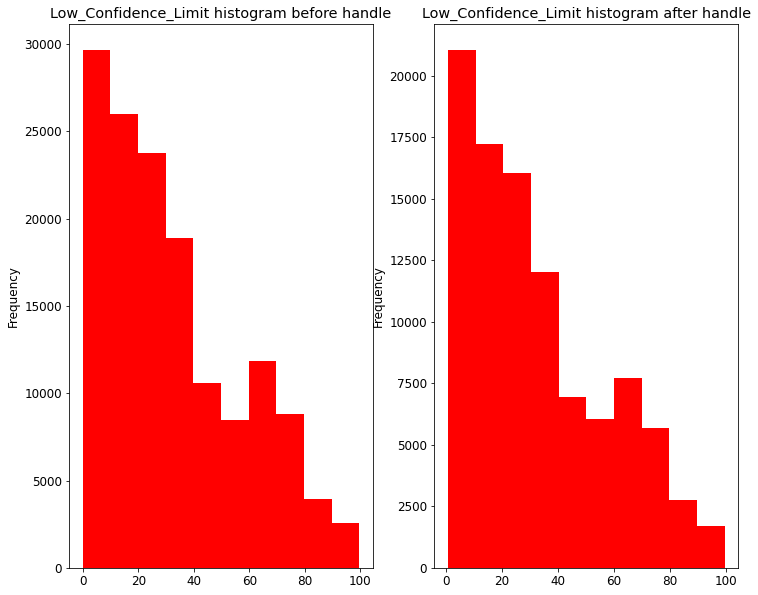

属性Low_Confidence_Limit处理前五数概括如下所示
对数值属性Low_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为12.0,中位数为26.9,第三四分位数为49.1,最大值为99.6
属性Low_Confidence_Limit处理后五数概括如下所示
对数值属性Low_Confidence_Limit的五数概括如下
最小值为0.6,第一四分位数为12.1,中位数为26.7,第三四分位数为49.3,最大值为99.6


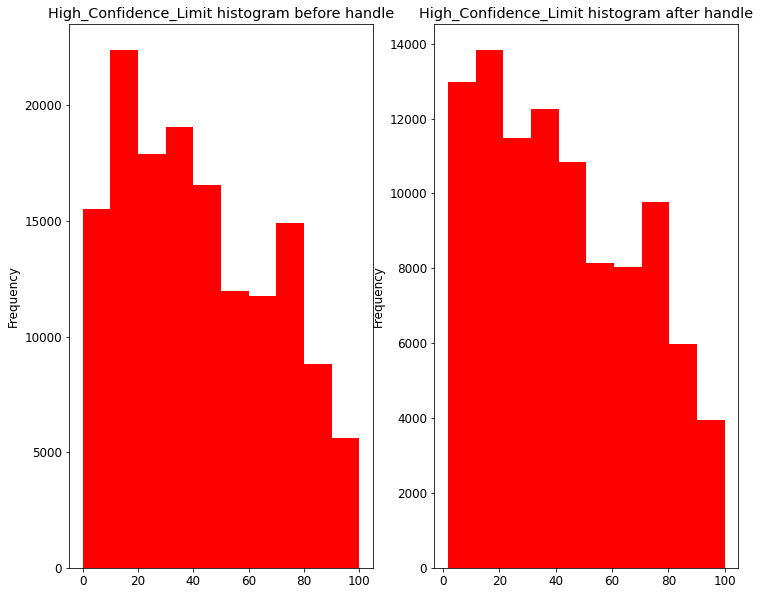

属性High_Confidence_Limit处理前五数概括如下所示
对数值属性High_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为19.0,中位数为38.5,第三四分位数为64.7,最大值为100.0
属性High_Confidence_Limit处理后五数概括如下所示
对数值属性High_Confidence_Limit的五数概括如下
最小值为1.7,第一四分位数为19.4,中位数为39.5,第三四分位数为65.3,最大值为100.0


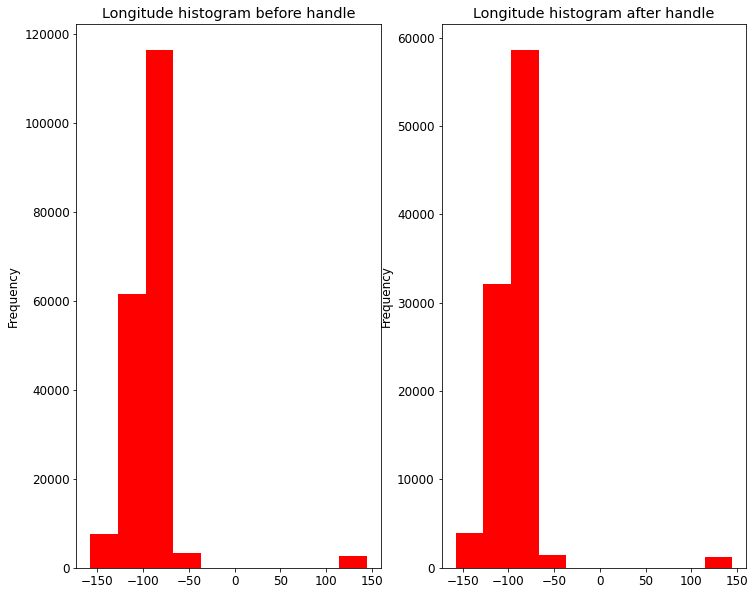

属性Longitude处理前五数概括如下所示
对数值属性Longitude的五数概括如下
最小值为-157.8577494,第一四分位数为-100.3735306,中位数为-88.99771018,第三四分位数为-77.86070029,最大值为144.793731
属性Longitude处理后五数概括如下所示
对数值属性Longitude的五数概括如下
最小值为-157.8577494,第一四分位数为-106.1336109,中位数为-88.99771018,第三四分位数为-77.86070029,最大值为144.793731


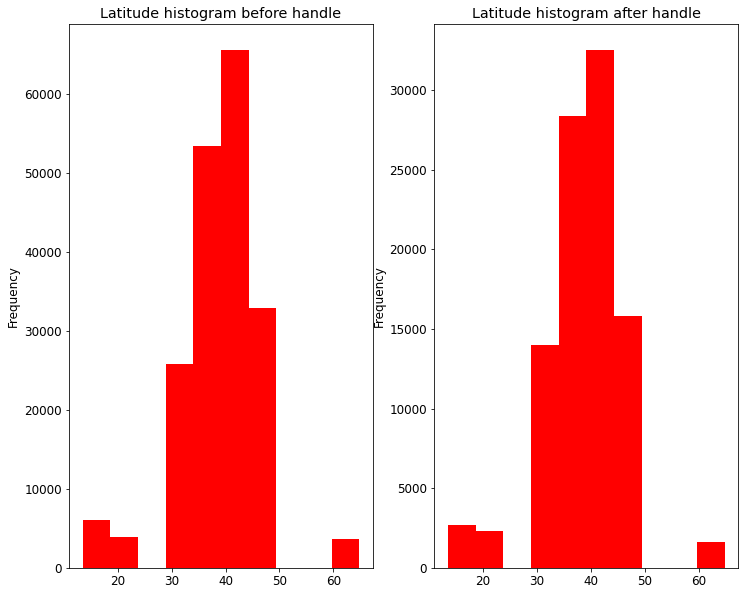

属性Latitude处理前五数概括如下所示
对数值属性Latitude的五数概括如下
最小值为13.444304,第一四分位数为35.46622098,中位数为39.36070017,第三四分位数为43.23554134,最大值为64.84507996
属性Latitude处理后五数概括如下所示
对数值属性Latitude的五数概括如下
最小值为13.444304,第一四分位数为34.86597028,中位数为39.29058096,第三四分位数为42.82700103,最大值为64.84507996


In [11]:
#将缺失部分剔除，得到新数据集并对比新旧数据集的差异
new1 = data.dropna(how = "any")
data.info()
new1.info()
#可视化对比新旧数据集，标称属性用条形图，数值属性用直方图
compare_dataset(data,new1)

如果样本缺失某一项就剔除该样本会对数据分析产生较大影响，标称属性各项的频数大大减少，StratificationCategoryID2直接减少了一类；对数值属性的影响相对较小。

### 2.2 用最高频率值填补缺失值

开始对比标称属性


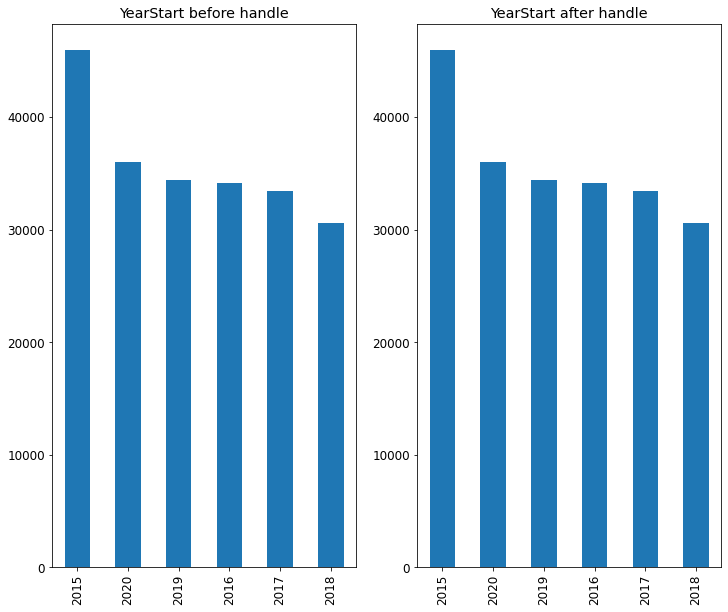

属性YearStart处理前条形图如下所示
2015    45980
2020    36006
2019    34354
2016    34145
2017    33429
2018    30548
Name: YearStart, dtype: int64
属性YearStart处理后条形图如下所示
2015    45980
2020    36006
2019    34354
2016    34145
2017    33429
2018    30548
Name: YearStart, dtype: int64


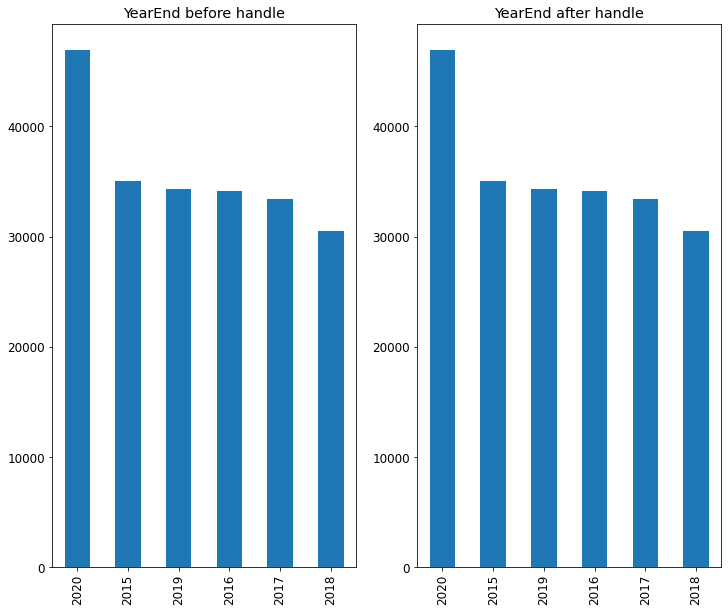

属性YearEnd处理前条形图如下所示
2020    46966
2015    35020
2019    34354
2016    34145
2017    33429
2018    30548
Name: YearEnd, dtype: int64
属性YearEnd处理后条形图如下所示
2020    46966
2015    35020
2019    34354
2016    34145
2017    33429
2018    30548
Name: YearEnd, dtype: int64


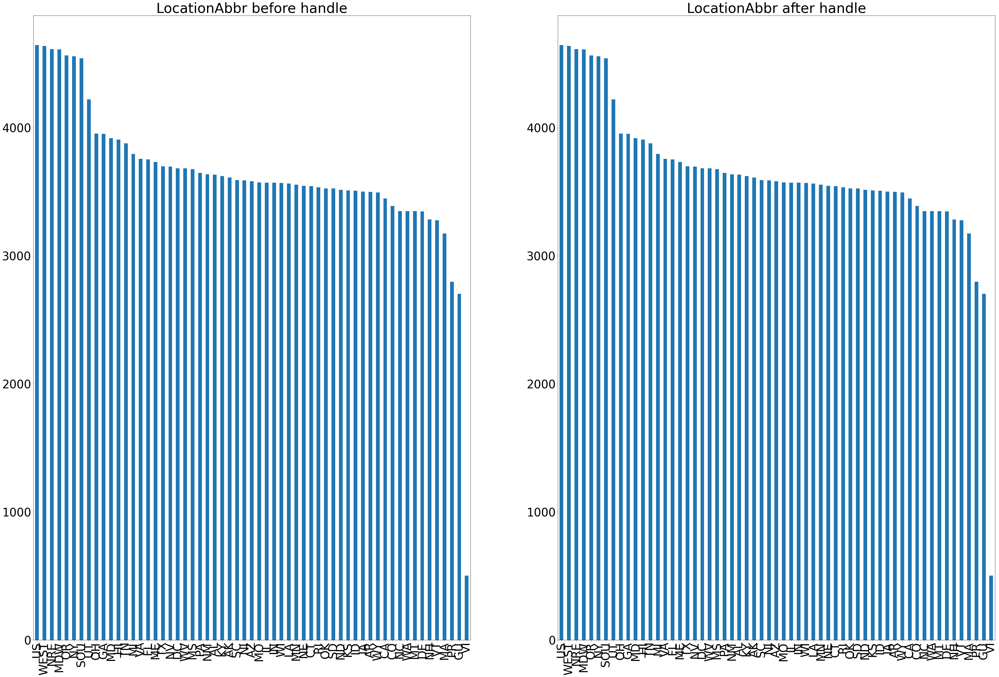

属性LocationAbbr处理前条形图如下所示
US      4644
WEST    4638
NRE     4614
MDW     4611
OR      4565
NY      4557
SOU     4542
UT      4222
OH      3955
GA      3951
MD      3919
HI      3907
TN      3879
MI      3796
VA      3758
FL      3753
ME      3733
TX      3699
NV      3696
DC      3684
WV      3682
MS      3677
PA      3648
NM      3635
AL      3633
KY      3623
AK      3611
SC      3592
NJ      3589
AZ      3582
MO      3573
IL      3571
IN      3570
WI      3569
LA      3563
MN      3555
NE      3546
CT      3543
RI      3534
OK      3526
SD      3526
ND      3514
KS      3510
ID      3507
IA      3501
AR      3498
WY      3494
CA      3447
CO      3390
NC      3349
WA      3348
MT      3348
DE      3346
NH      3284
VT      3278
MA      3174
PR      2797
GU      2703
VI       503
Name: LocationAbbr, dtype: int64
属性LocationAbbr处理后条形图如下所示
US      4644
WEST    4638
NRE     4614
MDW     4611
OR      4565
NY      4557
SOU     4542
UT      4222
OH      3955
GA      3951
MD      3919
HI     

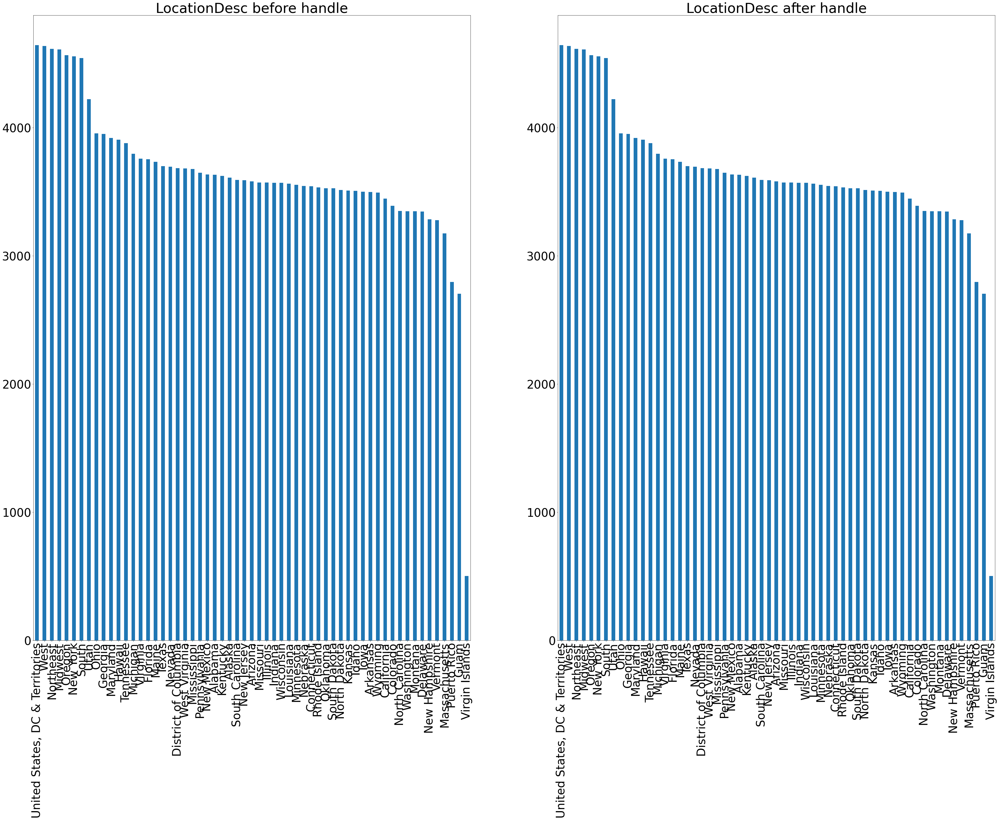

属性LocationDesc处理前条形图如下所示
United States, DC & Territories    4644
West                               4638
Northeast                          4614
Midwest                            4611
Oregon                             4565
New York                           4557
South                              4542
Utah                               4222
Ohio                               3955
Georgia                            3951
Maryland                           3919
Hawaii                             3907
Tennessee                          3879
Michigan                           3796
Virginia                           3758
Florida                            3753
Maine                              3733
Texas                              3699
Nevada                             3696
District of Columbia               3684
West Virginia                      3682
Mississippi                        3677
Pennsylvania                       3648
New Mexico                         3635
Alabama        

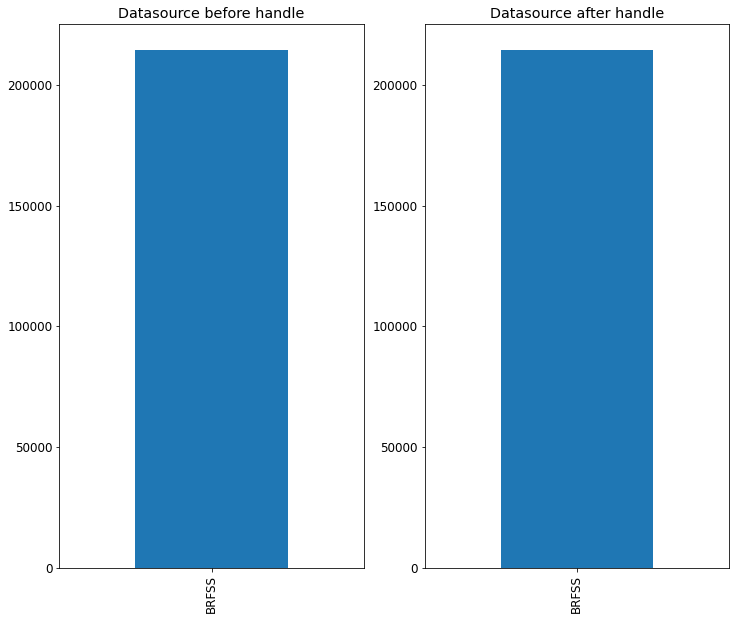

属性Datasource处理前条形图如下所示
BRFSS    214462
Name: Datasource, dtype: int64
属性Datasource处理后条形图如下所示
BRFSS    214462
Name: Datasource, dtype: int64


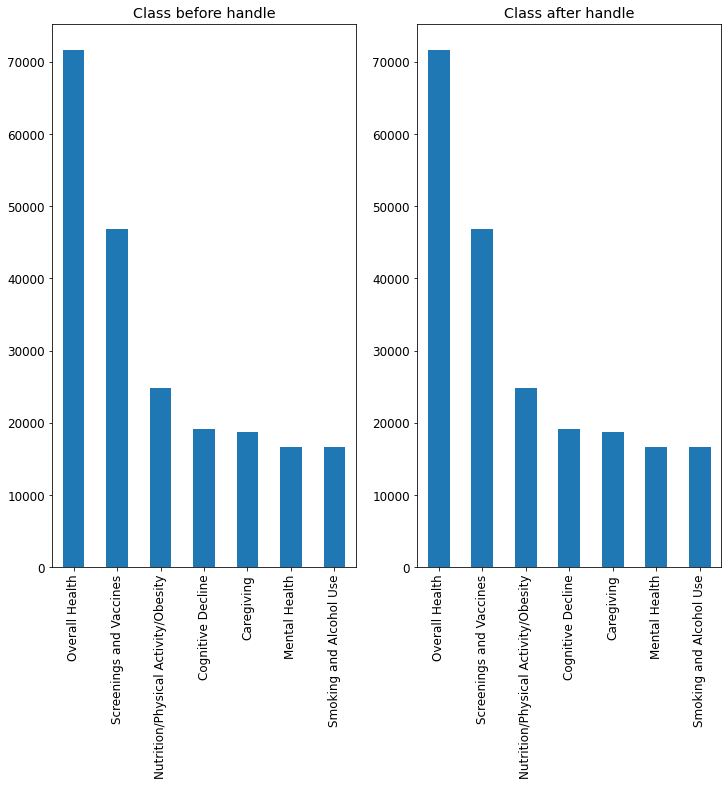

属性Class处理前条形图如下所示
Overall Health                         71694
Screenings and Vaccines                46867
Nutrition/Physical Activity/Obesity    24851
Cognitive Decline                      19180
Caregiving                             18671
Mental Health                          16600
Smoking and Alcohol Use                16599
Name: Class, dtype: int64
属性Class处理后条形图如下所示
Overall Health                         71694
Screenings and Vaccines                46867
Nutrition/Physical Activity/Obesity    24851
Cognitive Decline                      19180
Caregiving                             18671
Mental Health                          16600
Smoking and Alcohol Use                16599
Name: Class, dtype: int64


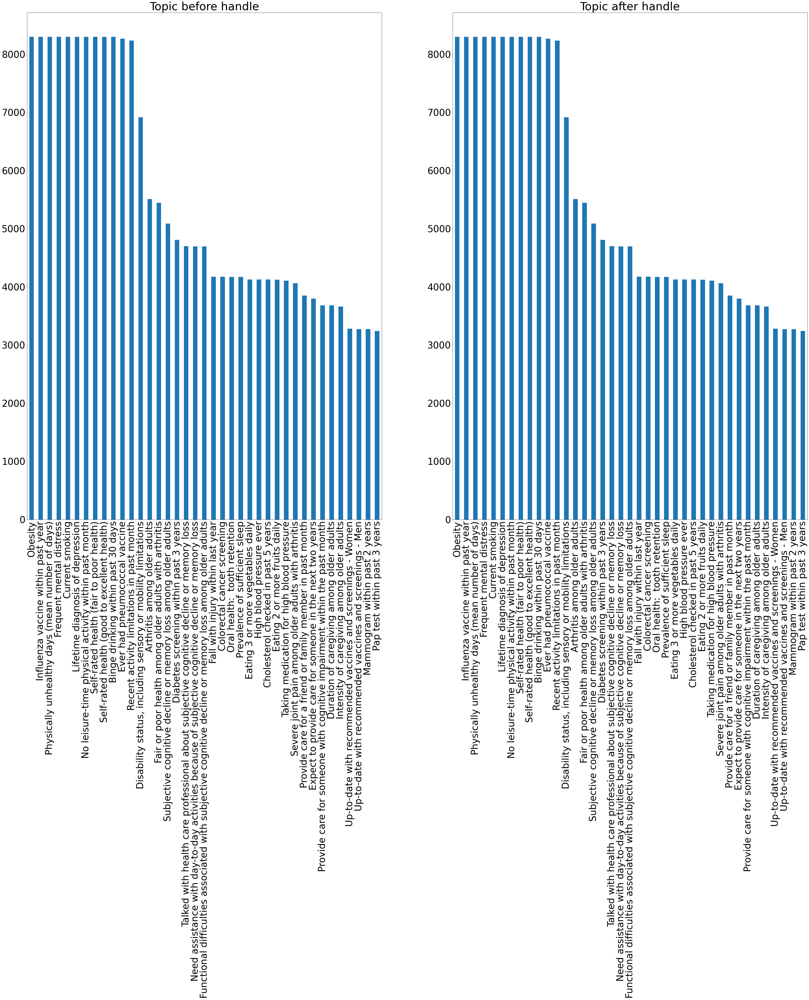

属性Topic处理前条形图如下所示
Obesity                                                                                                   8300
Influenza vaccine within past year                                                                        8300
Physically unhealthy days (mean number of days)                                                           8300
Frequent mental distress                                                                                  8300
Current smoking                                                                                           8300
Lifetime diagnosis of depression                                                                          8300
No leisure-time physical activity within past month                                                       8300
Self-rated health (fair to poor health)                                                                   8299
Self-rated health (good to excellent health)                                                  

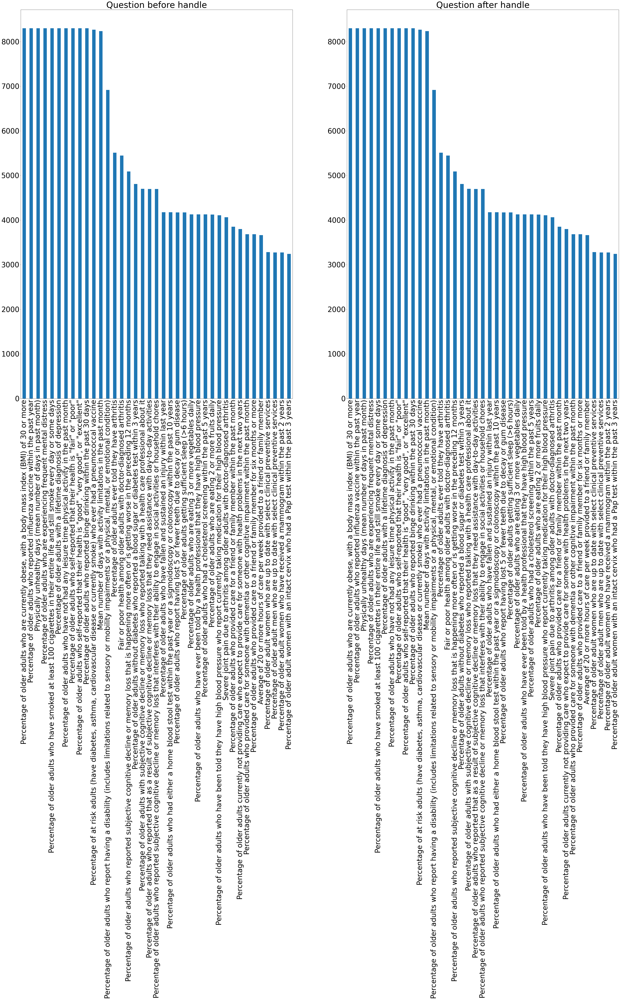

属性Question处理前条形图如下所示
Percentage of older adults who are currently obese, with a body mass index (BMI) of 30 or more                                                                               8300
Percentage of older adults who reported influenza vaccine within the past year                                                                                               8300
Physically unhealthy days (mean number of days in past month)                                                                                                                8300
Percentage of older adults who are experiencing frequent mental distress                                                                                                     8300
Percentage of older adults who have smoked at least 100 cigarettes in their entire life and still smoke every day or some days                                               8300
Percentage of older adults with a lifetime diagnosis of depression                       

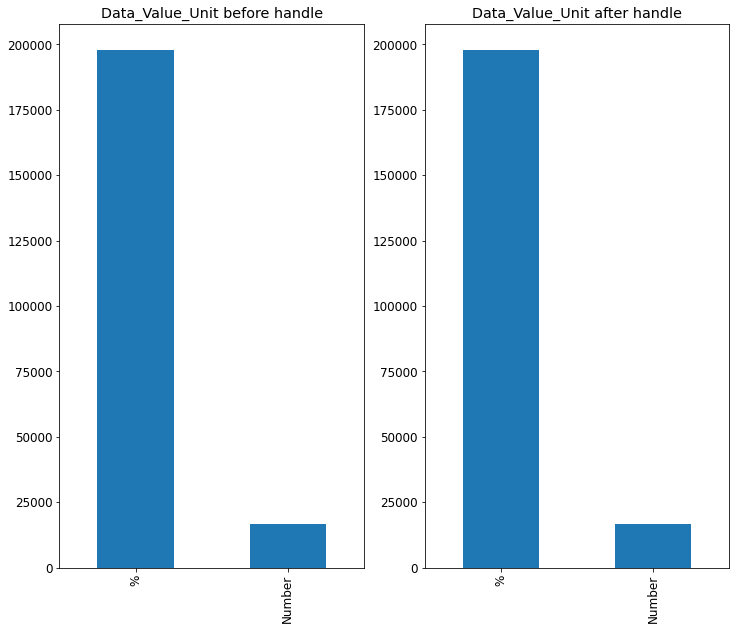

属性Data_Value_Unit处理前条形图如下所示
%         197929
Number     16533
Name: Data_Value_Unit, dtype: int64
属性Data_Value_Unit处理后条形图如下所示
%         197929
Number     16533
Name: Data_Value_Unit, dtype: int64


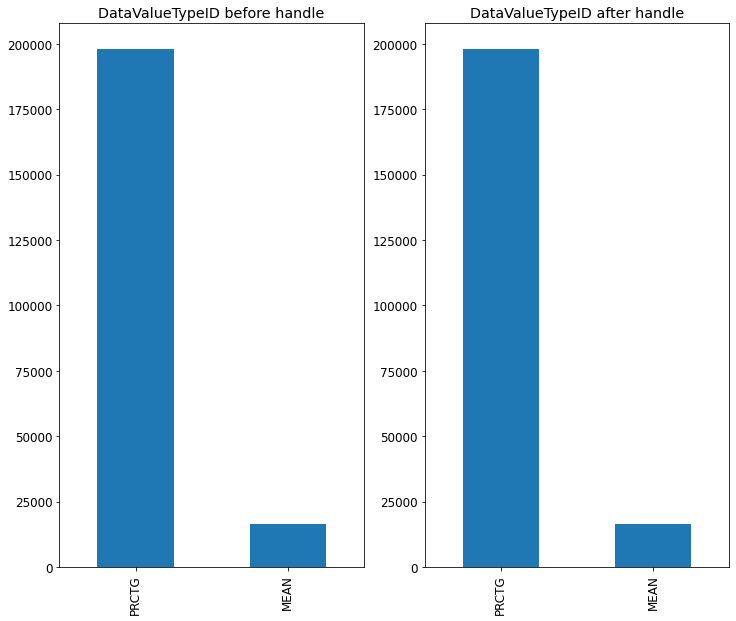

属性DataValueTypeID处理前条形图如下所示
PRCTG    197929
MEAN      16533
Name: DataValueTypeID, dtype: int64
属性DataValueTypeID处理后条形图如下所示
PRCTG    197929
MEAN      16533
Name: DataValueTypeID, dtype: int64


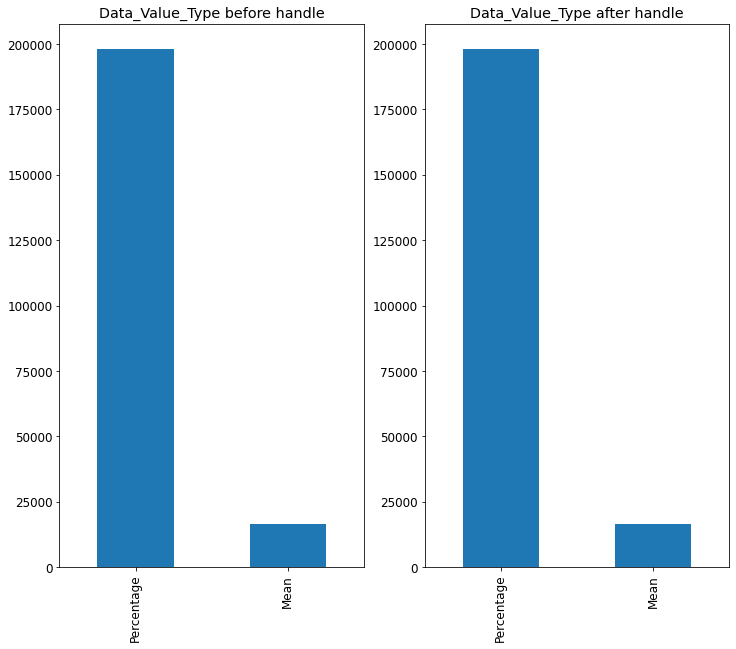

属性Data_Value_Type处理前条形图如下所示
Percentage    197929
Mean           16533
Name: Data_Value_Type, dtype: int64
属性Data_Value_Type处理后条形图如下所示
Percentage    197929
Mean           16533
Name: Data_Value_Type, dtype: int64


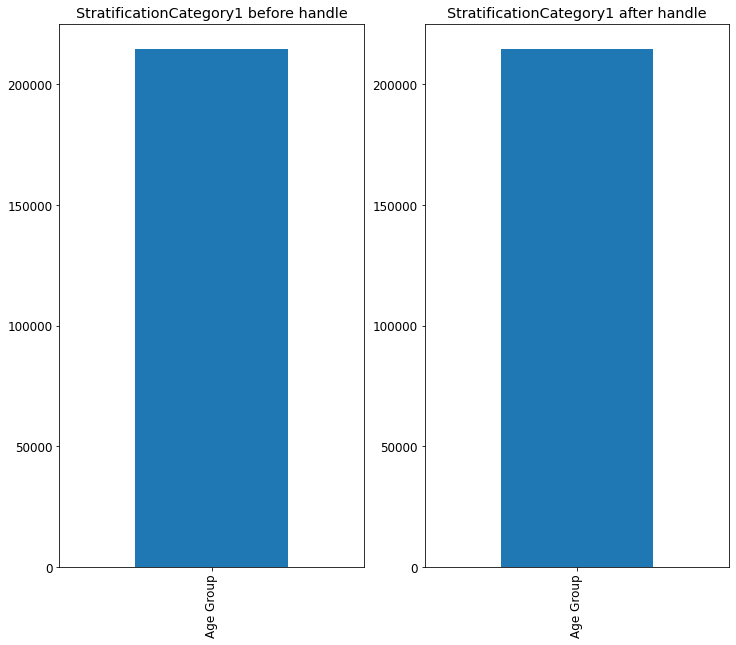

属性StratificationCategory1处理前条形图如下所示
Age Group    214462
Name: StratificationCategory1, dtype: int64
属性StratificationCategory1处理后条形图如下所示
Age Group    214462
Name: StratificationCategory1, dtype: int64


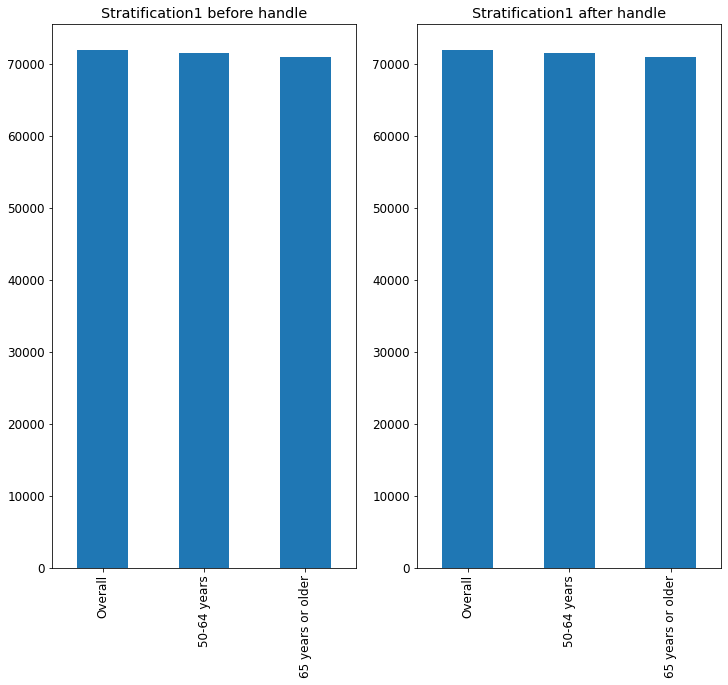

属性Stratification1处理前条形图如下所示
Overall              71919
50-64 years          71528
65 years or older    71015
Name: Stratification1, dtype: int64
属性Stratification1处理后条形图如下所示
Overall              71919
50-64 years          71528
65 years or older    71015
Name: Stratification1, dtype: int64


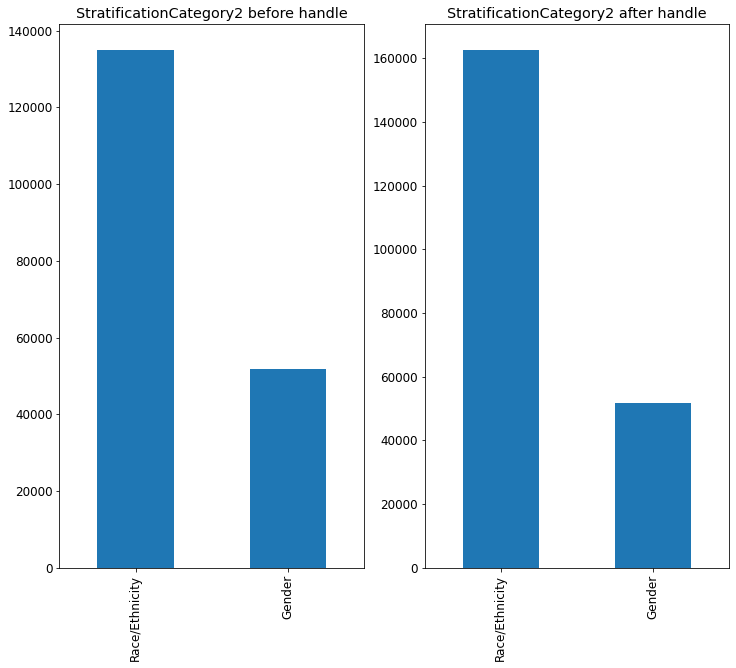

属性StratificationCategory2处理前条形图如下所示
Race/Ethnicity    134959
Gender             51834
Name: StratificationCategory2, dtype: int64
属性StratificationCategory2处理后条形图如下所示
Race/Ethnicity    162628
Gender             51834
Name: StratificationCategory2, dtype: int64


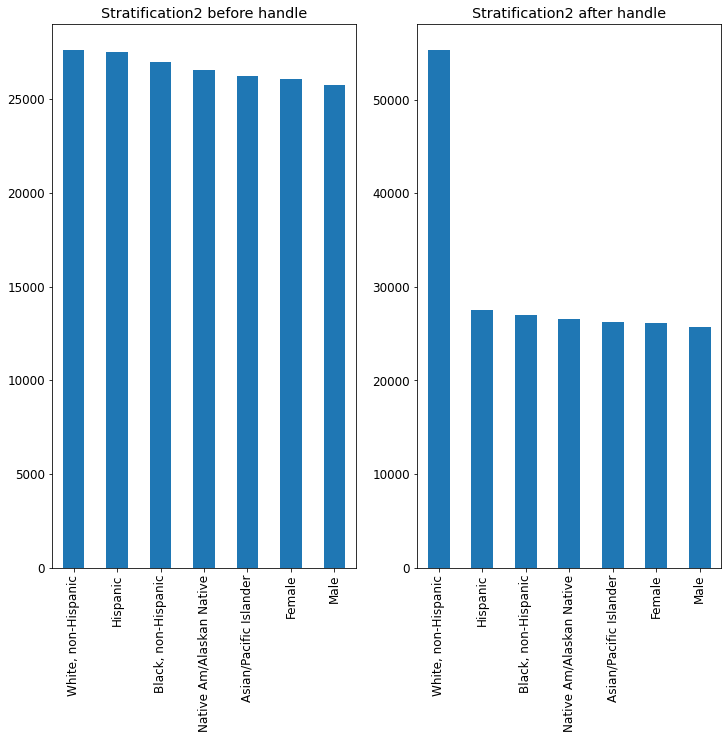

属性Stratification2处理前条形图如下所示
White, non-Hispanic         27633
Hispanic                    27525
Black, non-Hispanic         26968
Native Am/Alaskan Native    26571
Asian/Pacific Islander      26262
Female                      26091
Male                        25743
Name: Stratification2, dtype: int64
属性Stratification2处理后条形图如下所示
White, non-Hispanic         55302
Hispanic                    27525
Black, non-Hispanic         26968
Native Am/Alaskan Native    26571
Asian/Pacific Islander      26262
Female                      26091
Male                        25743
Name: Stratification2, dtype: int64


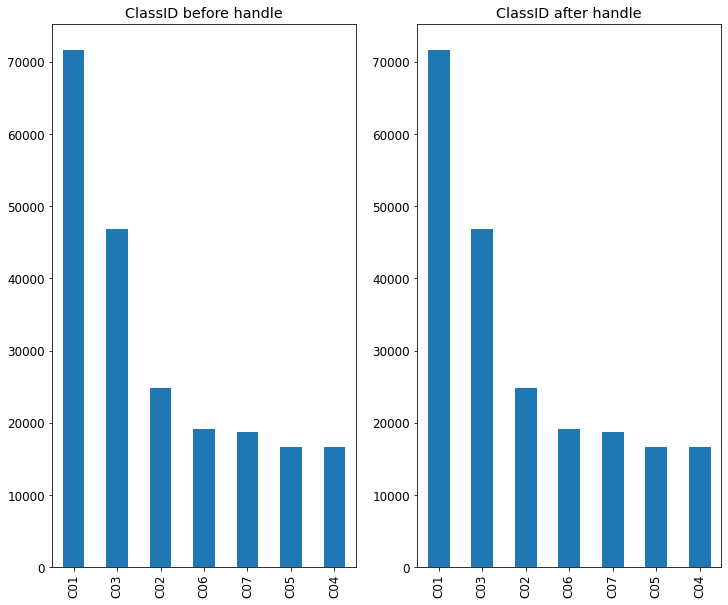

属性ClassID处理前条形图如下所示
C01    71694
C03    46867
C02    24851
C06    19180
C07    18671
C05    16600
C04    16599
Name: ClassID, dtype: int64
属性ClassID处理后条形图如下所示
C01    71694
C03    46867
C02    24851
C06    19180
C07    18671
C05    16600
C04    16599
Name: ClassID, dtype: int64


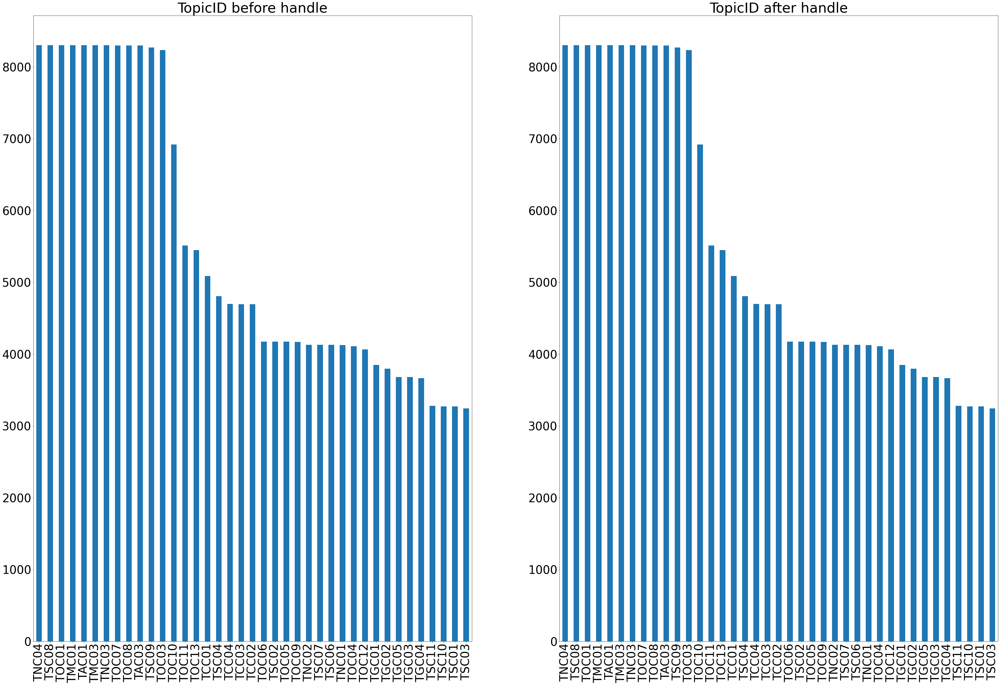

属性TopicID处理前条形图如下所示
TNC04    8300
TSC08    8300
TOC01    8300
TMC01    8300
TAC01    8300
TMC03    8300
TNC03    8300
TOC07    8299
TOC08    8299
TAC03    8299
TSC09    8268
TOC03    8233
TOC10    6917
TOC11    5511
TOC13    5447
TCC01    5088
TSC04    4808
TCC04    4700
TCC03    4696
TCC02    4696
TOC06    4173
TSC02    4173
TOC05    4172
TOC09    4171
TNC02    4127
TSC07    4127
TSC06    4127
TNC01    4124
TOC04    4108
TOC12    4064
TGC01    3848
TGC02    3797
TGC05    3682
TGC03    3681
TGC04    3663
TSC11    3280
TSC10    3271
TSC01    3271
TSC03    3242
Name: TopicID, dtype: int64
属性TopicID处理后条形图如下所示
TNC04    8300
TSC08    8300
TOC01    8300
TMC01    8300
TAC01    8300
TMC03    8300
TNC03    8300
TOC07    8299
TOC08    8299
TAC03    8299
TSC09    8268
TOC03    8233
TOC10    6917
TOC11    5511
TOC13    5447
TCC01    5088
TSC04    4808
TCC04    4700
TCC03    4696
TCC02    4696
TOC06    4173
TSC02    4173
TOC05    4172
TOC09    4171
TNC02    4127
TSC07    4127
TSC06    4127
TNC01   

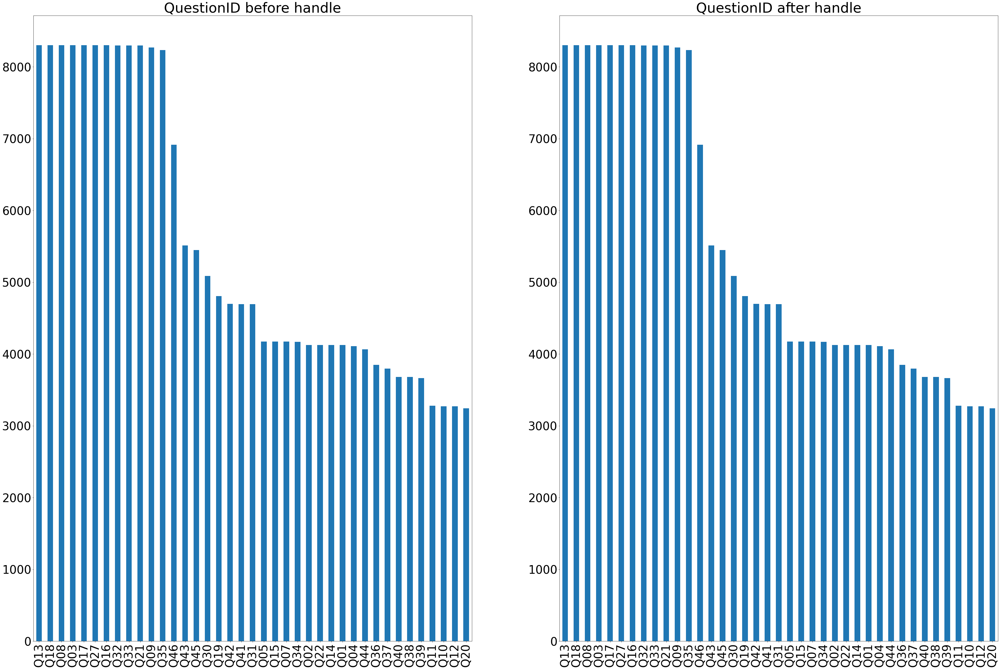

属性QuestionID处理前条形图如下所示
Q13    8300
Q18    8300
Q08    8300
Q03    8300
Q17    8300
Q27    8300
Q16    8300
Q32    8299
Q33    8299
Q21    8299
Q09    8268
Q35    8233
Q46    6917
Q43    5511
Q45    5447
Q30    5088
Q19    4808
Q42    4700
Q41    4696
Q31    4696
Q05    4173
Q15    4173
Q07    4172
Q34    4171
Q02    4127
Q22    4127
Q14    4127
Q01    4124
Q04    4108
Q44    4064
Q36    3848
Q37    3797
Q40    3682
Q38    3681
Q39    3663
Q11    3280
Q10    3271
Q12    3271
Q20    3242
Name: QuestionID, dtype: int64
属性QuestionID处理后条形图如下所示
Q13    8300
Q18    8300
Q08    8300
Q03    8300
Q17    8300
Q27    8300
Q16    8300
Q32    8299
Q33    8299
Q21    8299
Q09    8268
Q35    8233
Q46    6917
Q43    5511
Q45    5447
Q30    5088
Q19    4808
Q42    4700
Q41    4696
Q31    4696
Q05    4173
Q15    4173
Q07    4172
Q34    4171
Q02    4127
Q22    4127
Q14    4127
Q01    4124
Q04    4108
Q44    4064
Q36    3848
Q37    3797
Q40    3682
Q38    3681
Q39    3663
Q11    3280
Q10    3271
Q12    3271

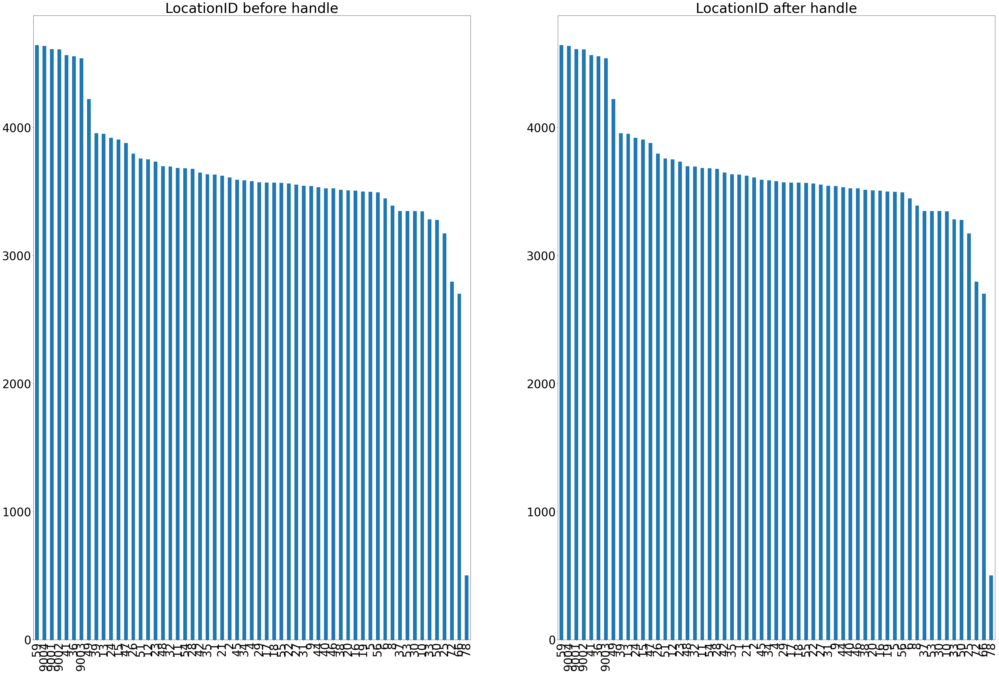

属性LocationID处理前条形图如下所示
59      4644
9004    4638
9001    4614
9002    4611
41      4565
36      4557
9003    4542
49      4222
39      3955
13      3951
24      3919
15      3907
47      3879
26      3796
51      3758
12      3753
23      3733
48      3699
32      3696
11      3684
54      3682
28      3677
42      3648
35      3635
1       3633
21      3623
2       3611
45      3592
34      3589
4       3582
29      3573
17      3571
18      3570
55      3569
22      3563
27      3555
31      3546
9       3543
44      3534
40      3526
46      3526
38      3514
20      3510
16      3507
19      3501
5       3498
56      3494
6       3447
8       3390
37      3349
53      3348
30      3348
10      3346
33      3284
50      3278
25      3174
72      2797
66      2703
78       503
Name: LocationID, dtype: int64
属性LocationID处理后条形图如下所示
59      4644
9004    4638
9001    4614
9002    4611
41      4565
36      4557
9003    4542
49      4222
39      3955
13      3951
24      3919
15      3907


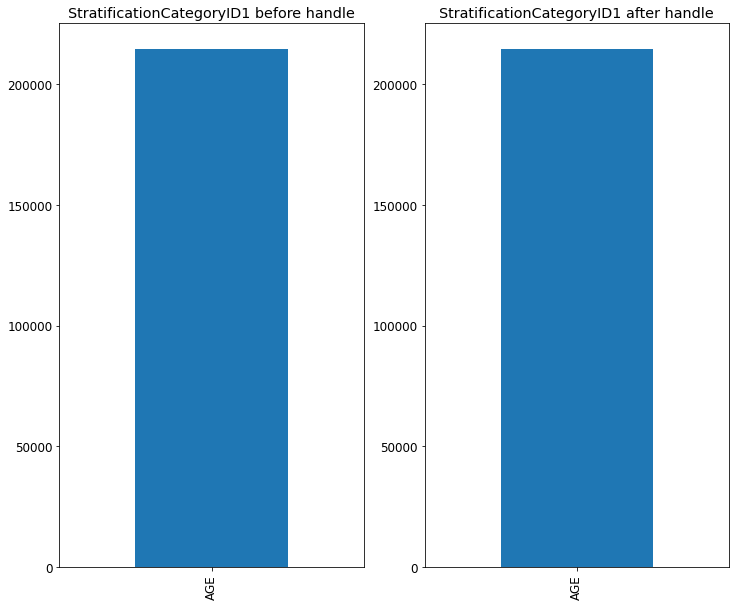

属性StratificationCategoryID1处理前条形图如下所示
AGE    214462
Name: StratificationCategoryID1, dtype: int64
属性StratificationCategoryID1处理后条形图如下所示
AGE    214462
Name: StratificationCategoryID1, dtype: int64


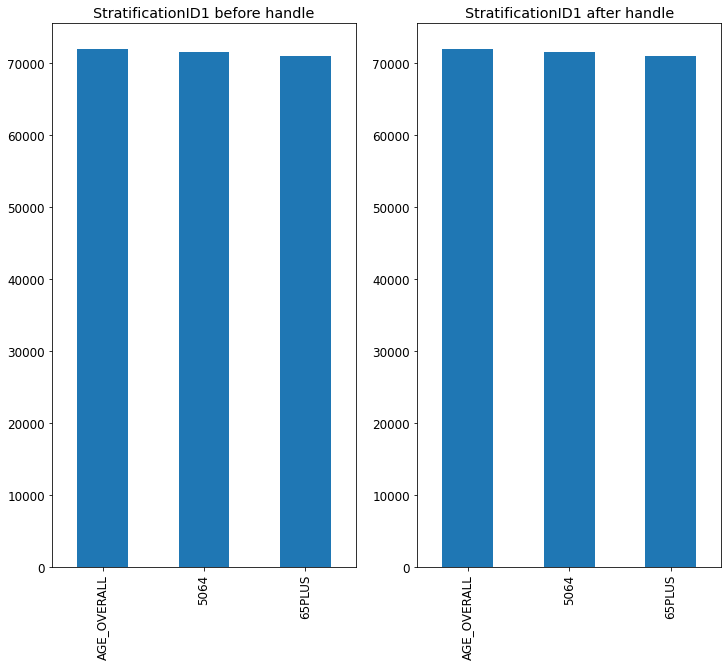

属性StratificationID1处理前条形图如下所示
AGE_OVERALL    71919
5064           71528
65PLUS         71015
Name: StratificationID1, dtype: int64
属性StratificationID1处理后条形图如下所示
AGE_OVERALL    71919
5064           71528
65PLUS         71015
Name: StratificationID1, dtype: int64


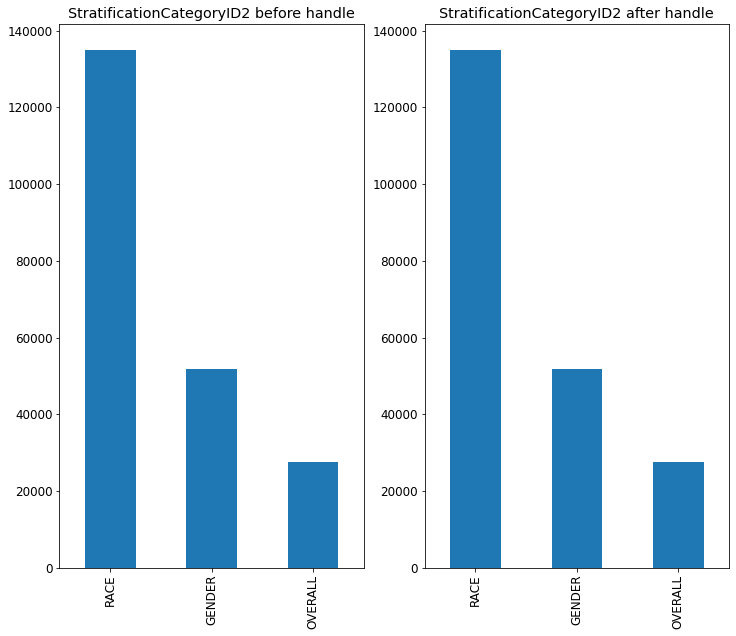

属性StratificationCategoryID2处理前条形图如下所示
RACE       134959
GENDER      51834
OVERALL     27669
Name: StratificationCategoryID2, dtype: int64
属性StratificationCategoryID2处理后条形图如下所示
RACE       134959
GENDER      51834
OVERALL     27669
Name: StratificationCategoryID2, dtype: int64


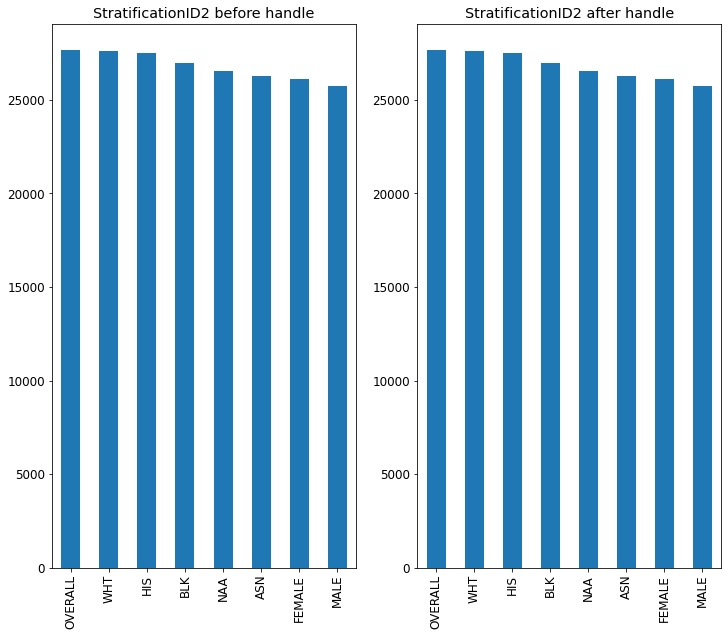

属性StratificationID2处理前条形图如下所示
OVERALL    27669
WHT        27633
HIS        27525
BLK        26968
NAA        26571
ASN        26262
FEMALE     26091
MALE       25743
Name: StratificationID2, dtype: int64
属性StratificationID2处理后条形图如下所示
OVERALL    27669
WHT        27633
HIS        27525
BLK        26968
NAA        26571
ASN        26262
FEMALE     26091
MALE       25743
Name: StratificationID2, dtype: int64
开始对比数值属性


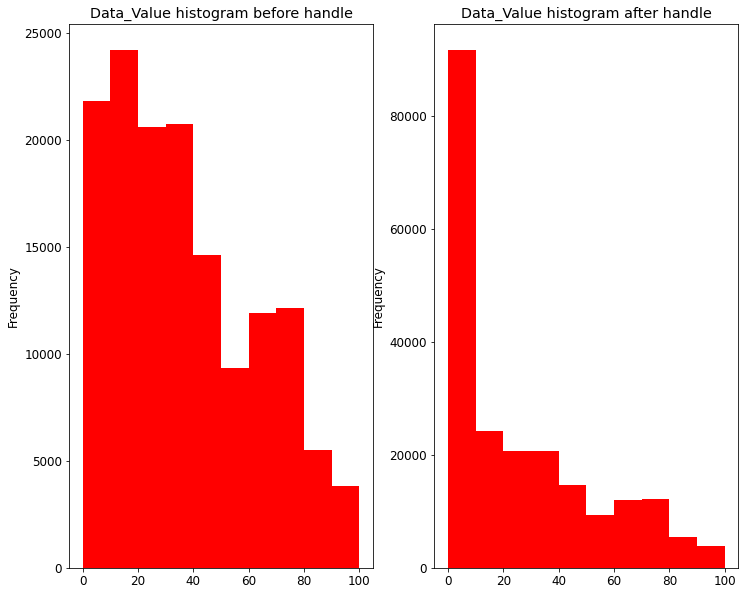

属性Data_Value处理前五数概括如下所示
对数值属性Data_Value的五数概括如下
最小值为0.0,第一四分位数为15.3,中位数为32.5,第三四分位数为56.8,最大值为100.0
属性Data_Value处理后五数概括如下所示
对数值属性Data_Value的五数概括如下
最小值为0.0,第一四分位数为6.0,中位数为15.9,第三四分位数为42.1,最大值为100.0


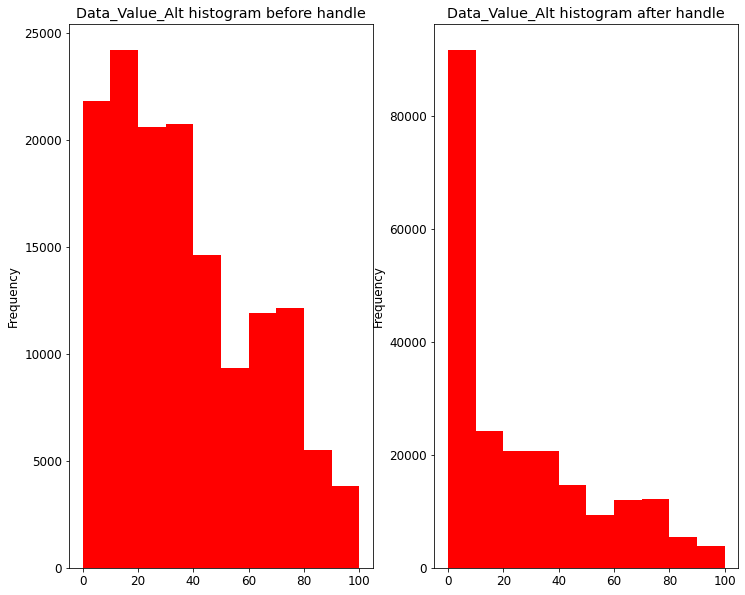

属性Data_Value_Alt处理前五数概括如下所示
对数值属性Data_Value_Alt的五数概括如下
最小值为0.0,第一四分位数为15.3,中位数为32.5,第三四分位数为56.8,最大值为100.0
属性Data_Value_Alt处理后五数概括如下所示
对数值属性Data_Value_Alt的五数概括如下
最小值为0.0,第一四分位数为6.0,中位数为15.9,第三四分位数为42.1,最大值为100.0


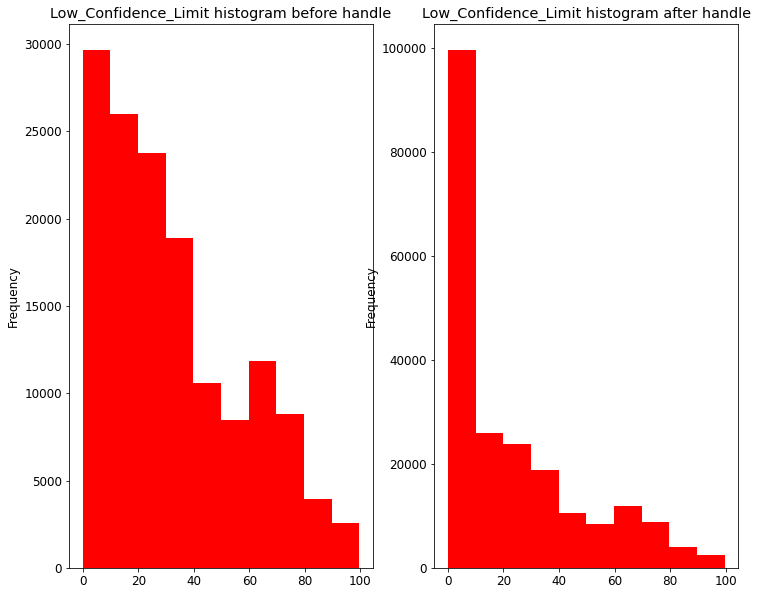

属性Low_Confidence_Limit处理前五数概括如下所示
对数值属性Low_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为12.0,中位数为26.9,第三四分位数为49.1,最大值为99.6
属性Low_Confidence_Limit处理后五数概括如下所示
对数值属性Low_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为4.8,中位数为12.5,第三四分位数为35.3,最大值为99.6


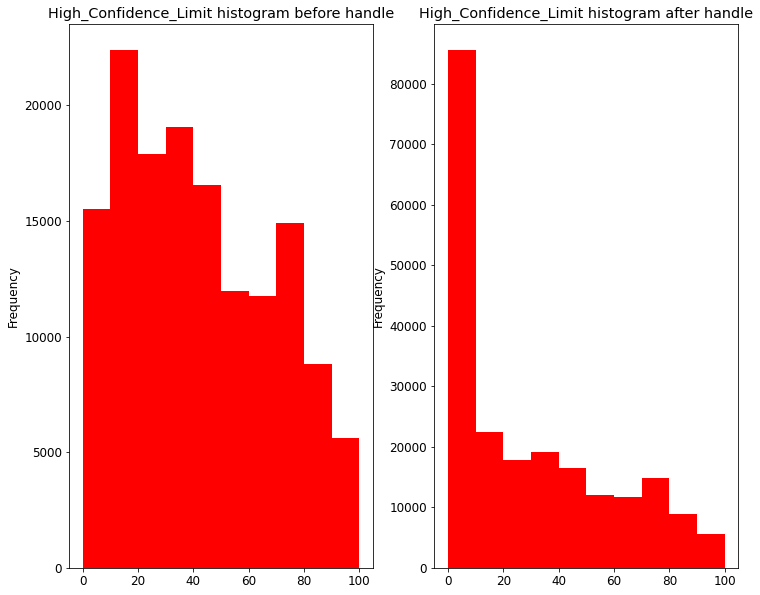

属性High_Confidence_Limit处理前五数概括如下所示
对数值属性High_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为19.0,中位数为38.5,第三四分位数为64.7,最大值为100.0
属性High_Confidence_Limit处理后五数概括如下所示
对数值属性High_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为6.5,中位数为19.6,第三四分位数为49.6,最大值为100.0


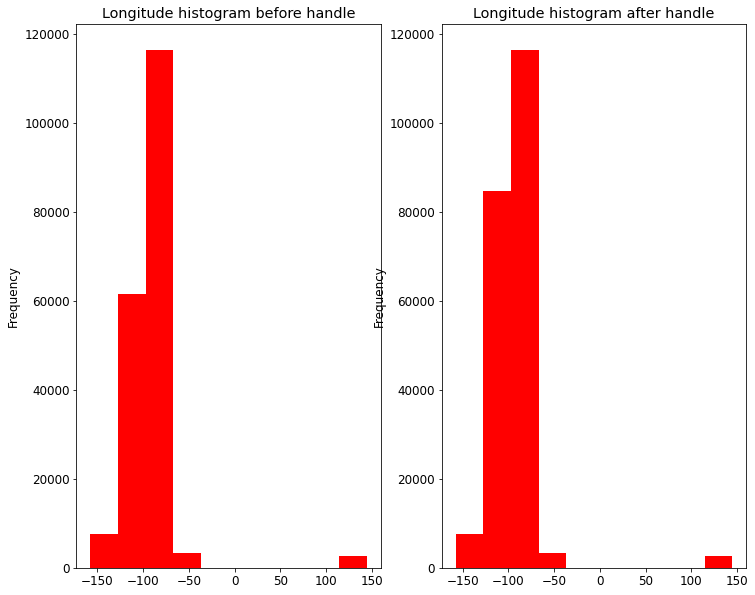

属性Longitude处理前五数概括如下所示
对数值属性Longitude的五数概括如下
最小值为-157.8577494,第一四分位数为-100.3735306,中位数为-88.99771018,第三四分位数为-77.86070029,最大值为144.793731
属性Longitude处理后五数概括如下所示
对数值属性Longitude的五数概括如下
最小值为-157.8577494,第一四分位数为-111.5871306,中位数为-92.27449074,第三四分位数为-79.15925046,最大值为144.793731


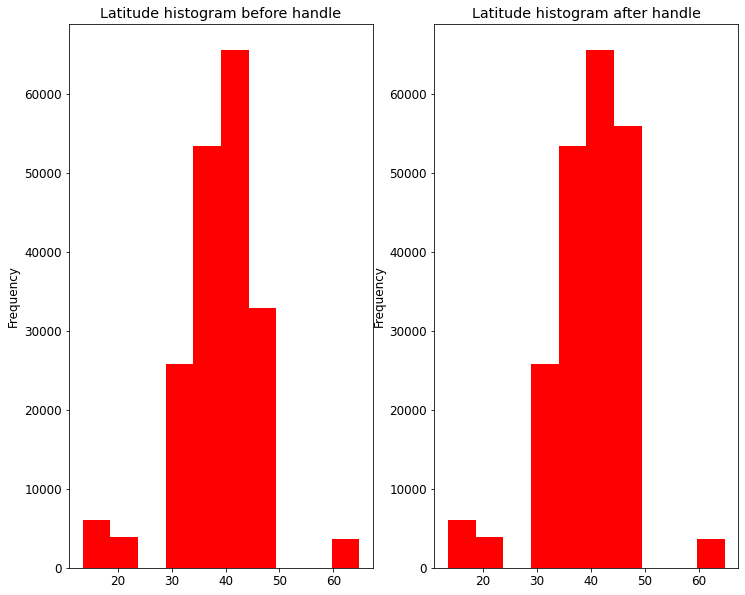

属性Latitude处理前五数概括如下所示
对数值属性Latitude的五数概括如下
最小值为13.444304,第一四分位数为35.46622098,中位数为39.36070017,第三四分位数为43.23554134,最大值为64.84507996
属性Latitude处理后五数概括如下所示
对数值属性Latitude的五数概括如下
最小值为13.444304,第一四分位数为35.68094058,中位数为40.06021014,第三四分位数为44.39319117,最大值为64.84507996


In [12]:
#即用众数填补缺失
maxFre = data.mode().iloc[0]
new2 = data.fillna(maxFre)
compare_dataset(data,new2)


可以看出，用众数进行填补不会影响数据总体分布，但会对五数概况产生影响，由此可见用众数补充标称属性缺失值是个比较好的方法，对于该数据集来说，用最高频率值填补缺失值是较好的考量。

### 2.3 通过属性的相关关系来填补缺失值
计算属性间的相关性再决定用什么方法

In [13]:
print(numetricAttr)#有四个['IMDb-rating', 'downloads', 'run_time', 'views']
#计算下属性间的相关性
score = {}
for attr in numetricAttr:
    for subattr in numetricAttr:
        if subattr == attr:
            continue
        else:
            tmpscore = data[attr].corr(data[subattr])
            score[subattr]=tmpscore
            #print(attr,subattr,tmpscore)
    sorted_score = sorted(score.items(), key=lambda x:x[1], reverse=True)
    first_item = next(iter(sorted_score))
    print("与属性{}最相关的是属性{},相关系数为{}".format(attr,first_item[0],first_item[1]))

['Data_Value', 'Data_Value_Alt', 'Low_Confidence_Limit', 'High_Confidence_Limit', 'Longitude', 'Latitude']
与属性Data_Value最相关的是属性Data_Value_Alt,相关系数为0.9999999999999999
与属性Data_Value_Alt最相关的是属性Data_Value_Alt,相关系数为0.9999999999999999
与属性Low_Confidence_Limit最相关的是属性Data_Value_Alt,相关系数为0.983006236323902
与属性High_Confidence_Limit最相关的是属性Data_Value_Alt,相关系数为0.982760198639803
与属性Longitude最相关的是属性High_Confidence_Limit,相关系数为0.021213177237664735
与属性Latitude最相关的是属性Low_Confidence_Limit,相关系数为-0.009655355161960134


In [14]:
if data['Data_Value'].equals(data['Data_Value_Alt']):
    print("Data_Value和Data_Value_Alt属性值相同")

Data_Value和Data_Value_Alt属性值相同


可以看出，Data_Value、Data_Value_Alt、Low_Confidence_Limit和High_Confidence_Limit这四个属性可以通过相关关系进行缺失值填补，它们的相关系数都达到了0.98以上，Longitude和Latitude与其它数据的相关性较弱，用回归方法进行填补是无意义的，所以笔者不打算处理这两个属性；
但经过检查发现Data_Value和Data_Value_Alt所在列的数值是一样的，所以只需要取其中一个属性进行相关分析，再用相同值填补另一个属性的缺失值即可，笔者选取Data_Value属性进行处理。
由于Data_Value、Low_Confidence_Limit和High_Confidence_Limit这三个属性都存在缺失值，从缺失个数最少的开始填充。

In [15]:
symnull = {}
newNumetricAttr = ['Data_Value','Low_Confidence_Limit','High_Confidence_Limit']
for attr in newNumetricAttr:
    tmpnull = data[attr].isnull().sum()
    symnull[attr] = tmpnull
sorted_null = sorted(symnull.items(),key=lambda x:x[1])#按照缺失个数从小到大排序，也是扔进随机森林的顺序
print(sorted_null)

new3 = data.copy()
for idx, pair in enumerate(sorted_null):
    attr = pair[0]
    print("预测属性{}".format(attr))
    numetric_val = new3[newNumetricAttr]
    known = numetric_val[numetric_val[attr].notnull()]#已知该特征的样本
    #print(known)
    unknown = numetric_val[numetric_val[attr].isnull()]
    y_train = known[attr].values
    #print(y_train)
    #print(known.loc[:,known.columns!=attr])
    x_train = known.loc[:,known.columns != attr].fillna(0).values
    #用0补上缺失值
    x_test = unknown.loc[:,unknown.columns !=attr].fillna(0).values
    rfr = RandomForestRegressor(random_state=0, n_estimators=200)
    rfr.fit(x_train,y_train)
    pred = rfr.predict(x_test)
    print(pred)
    new3.loc[(new3[attr].isnull()),attr] = pred
    if attr == 'Data_Value':
        new3.loc[(new3['Data_Value_Alt'].isnull()),'Data_Value_Alt'] = pred



[('Data_Value', 69833), ('Low_Confidence_Limit', 69990), ('High_Confidence_Limit', 69990)]
预测属性Data_Value
[10.79015763 10.79015763 10.79015763 ... 10.79015763 10.79015763
 10.79015763]
预测属性Low_Confidence_Limit
[10.52501369 10.52501369 10.52501369 ... 10.52501369 10.52501369
 10.52501369]
预测属性High_Confidence_Limit
[11.18197186 11.18197186 11.18197186 ... 11.18197186 11.18197186
 11.18197186]


使用随机森林法填充缺失值之前:
Data_Value               69833
Data_Value_Alt           69833
Low_Confidence_Limit     69990
High_Confidence_Limit    69990
Longitude                23049
Latitude                 23049
dtype: int64
使用随机森林法填充缺失值之后:
YearStart                        0
YearEnd                          0
LocationAbbr                     0
LocationDesc                     0
Datasource                       0
Class                            0
Topic                            0
Question                         0
Data_Value_Unit                  0
DataValueTypeID                  0
Data_Value_Type                  0
Data_Value                       0
Data_Value_Alt                   0
Low_Confidence_Limit             0
High_Confidence_Limit            0
StratificationCategory1          0
Stratification1                  0
StratificationCategory2      27669
Stratification2              27669
Geolocation                  23049
ClassID                          0
TopicID                          0

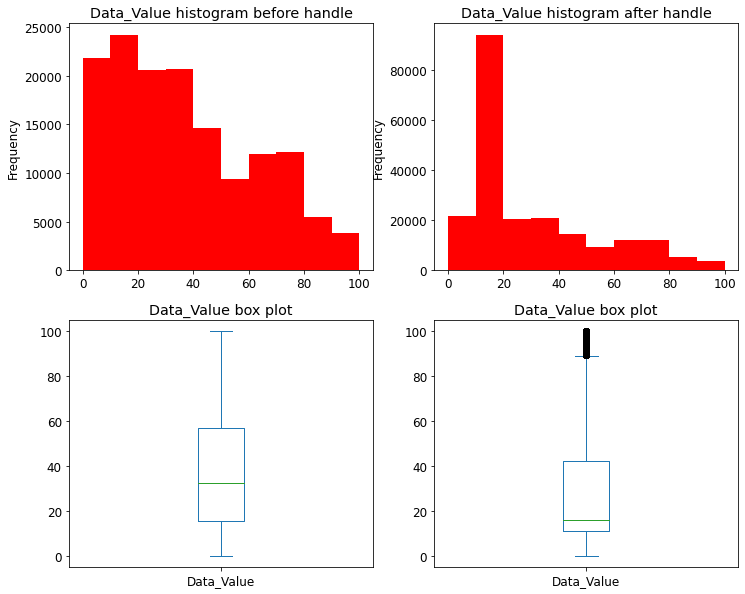

属性Data_Value处理前五数概括如下所示
对数值属性Data_Value的五数概括如下
最小值为0.0,第一四分位数为15.3,中位数为32.5,第三四分位数为56.8,最大值为100.0
属性Data_Value处理后五数概括如下所示
对数值属性Data_Value的五数概括如下
最小值为0.0,第一四分位数为10.790157634812426,中位数为15.9,第三四分位数为42.1,最大值为100.0


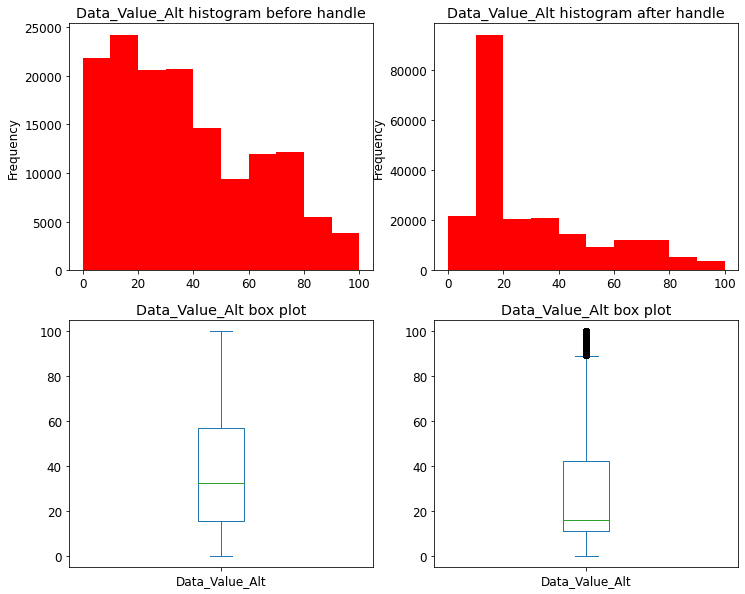

属性Data_Value_Alt处理前五数概括如下所示
对数值属性Data_Value_Alt的五数概括如下
最小值为0.0,第一四分位数为15.3,中位数为32.5,第三四分位数为56.8,最大值为100.0
属性Data_Value_Alt处理后五数概括如下所示
对数值属性Data_Value_Alt的五数概括如下
最小值为0.0,第一四分位数为10.790157634812426,中位数为15.9,第三四分位数为42.1,最大值为100.0


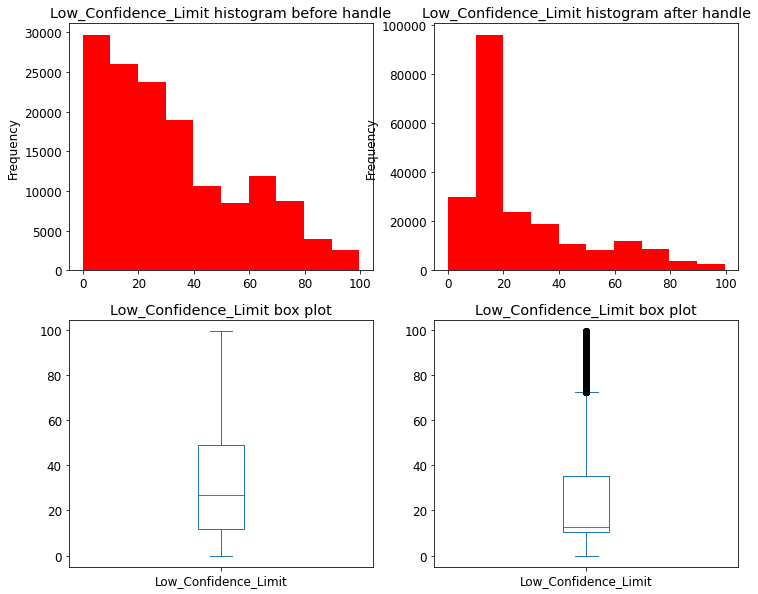

属性Low_Confidence_Limit处理前五数概括如下所示
对数值属性Low_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为12.0,中位数为26.9,第三四分位数为49.1,最大值为99.6
属性Low_Confidence_Limit处理后五数概括如下所示
对数值属性Low_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为10.525013690476175,中位数为12.5,第三四分位数为35.3,最大值为99.6


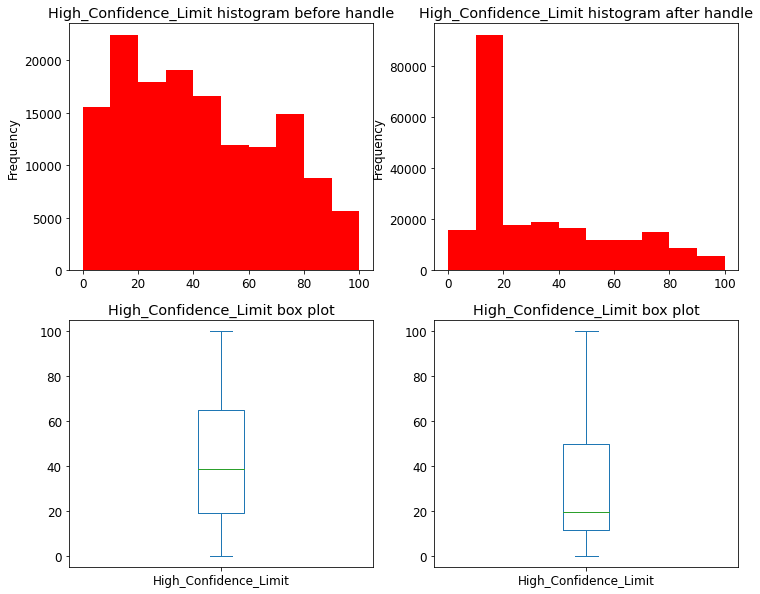

属性High_Confidence_Limit处理前五数概括如下所示
对数值属性High_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为19.0,中位数为38.5,第三四分位数为64.7,最大值为100.0
属性High_Confidence_Limit处理后五数概括如下所示
对数值属性High_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为11.181971861471864,中位数为19.6,第三四分位数为49.6,最大值为100.0


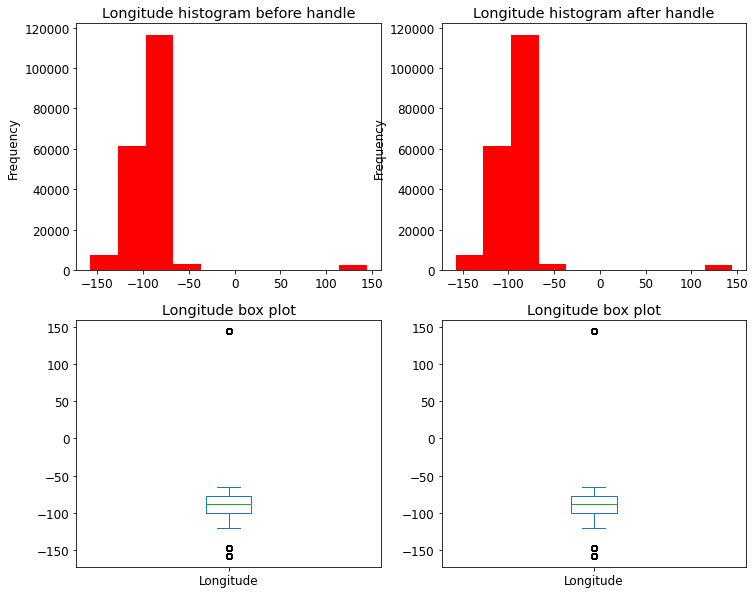

属性Longitude处理前五数概括如下所示
对数值属性Longitude的五数概括如下
最小值为-157.8577494,第一四分位数为-100.3735306,中位数为-88.99771018,第三四分位数为-77.86070029,最大值为144.793731
属性Longitude处理后五数概括如下所示
对数值属性Longitude的五数概括如下
最小值为-157.8577494,第一四分位数为-100.3735306,中位数为-88.99771018,第三四分位数为-77.86070029,最大值为144.793731


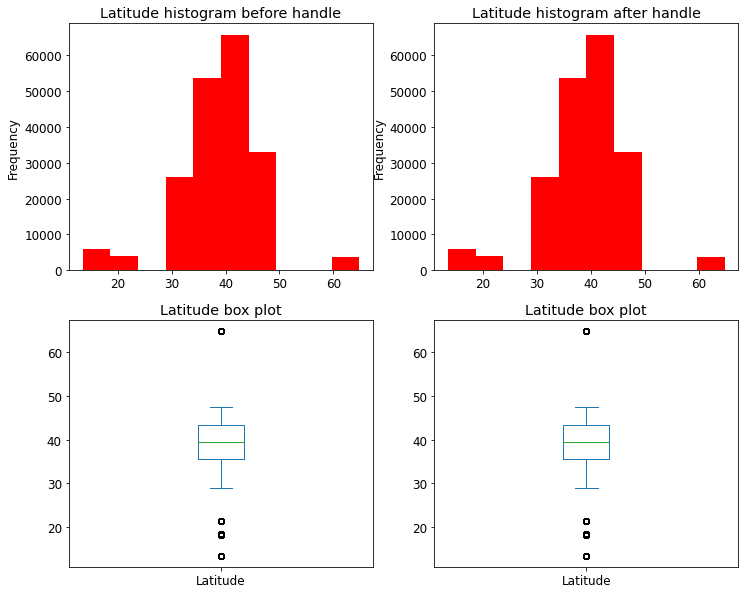

属性Latitude处理前五数概括如下所示
对数值属性Latitude的五数概括如下
最小值为13.444304,第一四分位数为35.46622098,中位数为39.36070017,第三四分位数为43.23554134,最大值为64.84507996
属性Latitude处理后五数概括如下所示
对数值属性Latitude的五数概括如下
最小值为13.444304,第一四分位数为35.46622098,中位数为39.36070017,第三四分位数为43.23554134,最大值为64.84507996


In [16]:
print("使用随机森林法填充缺失值之前:")
print(data[numetricAttr].isnull().sum())
print("使用随机森林法填充缺失值之后:")
print(new3.isnull().sum())
compare_dataset_numetric(data,new3,numetricAttr,True)

通过该方法填补缺失值会对数值属性分布产生影响，由上方绘制的盒图可以发现增加了离群点

### 2.4 通过数据对象之间的相似性来填补缺失值
使用聚类算法计算数据间的相似度从而进行填充

fast_knn是一种基于KNN算法的缺失值填充方法。它使用最近邻居的值来预测缺失值。以下是fast_knn的基本原理：

对于每个缺失值，找到最近的k个非缺失值。
使用这k个非缺失值的平均值来填充缺失值。

D:\Anaconda\lib\site-packages\impyute\imputation\cs\fast_knn.py:113: RuntimeWarning: invalid value encountered in true_divide
  weights = distances/np.sum(distances)


使用FastKNN填充缺失值之前:
Data_Value               69833
Data_Value_Alt           69833
Low_Confidence_Limit     69990
High_Confidence_Limit    69990
Longitude                23049
Latitude                 23049
dtype: int64
使用FastKNN填充缺失值之后:
Data_Value               69731
Low_Confidence_Limit     69871
High_Confidence_Limit    69871
Data_Value_Alt           69731
dtype: int64


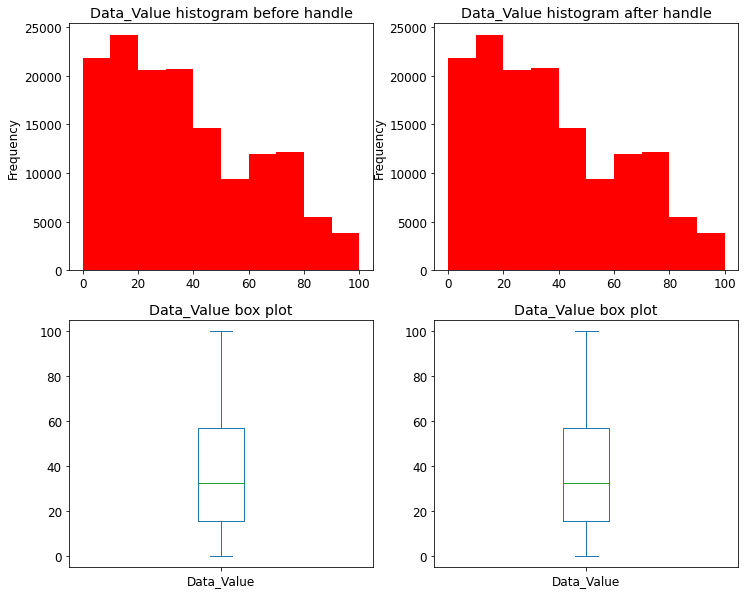

属性Data_Value处理前五数概括如下所示
对数值属性Data_Value的五数概括如下
最小值为0.0,第一四分位数为15.3,中位数为32.5,第三四分位数为56.8,最大值为100.0
属性Data_Value处理后五数概括如下所示
对数值属性Data_Value的五数概括如下
最小值为0.0,第一四分位数为15.3,中位数为32.5,第三四分位数为56.8,最大值为100.0


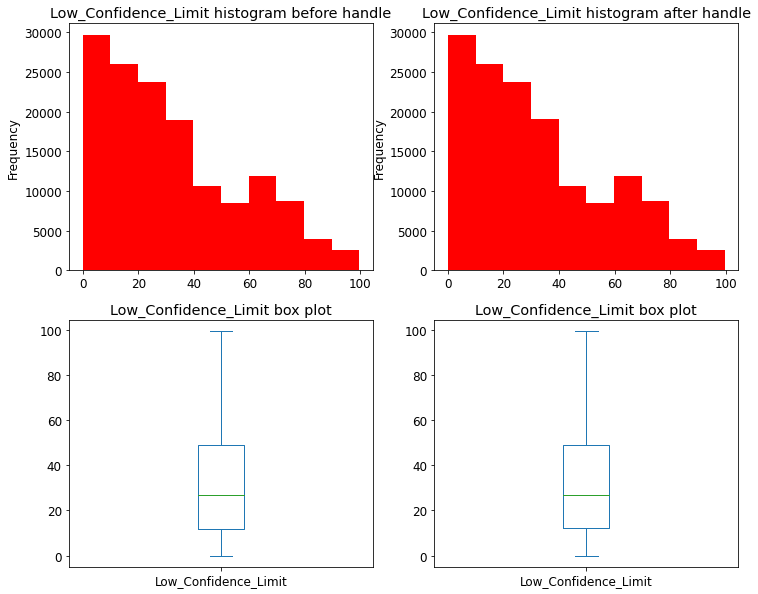

属性Low_Confidence_Limit处理前五数概括如下所示
对数值属性Low_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为12.0,中位数为26.9,第三四分位数为49.1,最大值为99.6
属性Low_Confidence_Limit处理后五数概括如下所示
对数值属性Low_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为12.1,中位数为26.9,第三四分位数为49.1,最大值为99.6


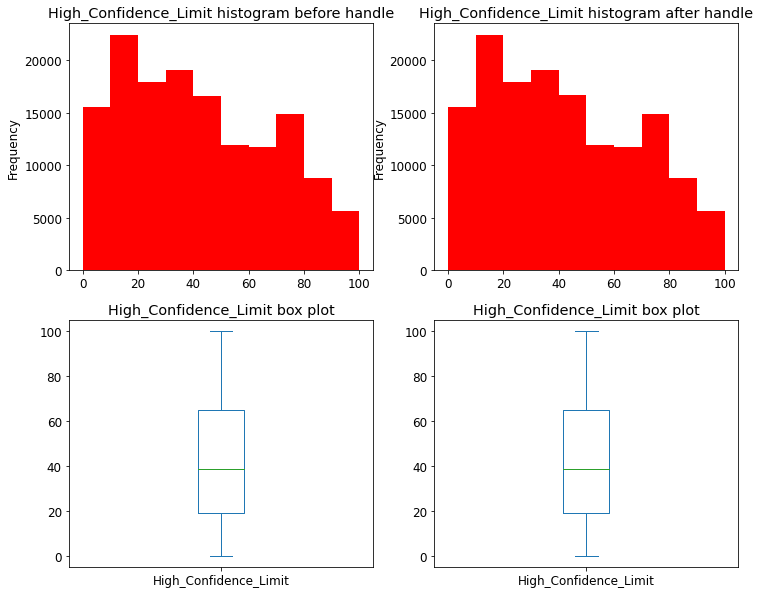

属性High_Confidence_Limit处理前五数概括如下所示
对数值属性High_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为19.0,中位数为38.5,第三四分位数为64.7,最大值为100.0
属性High_Confidence_Limit处理后五数概括如下所示
对数值属性High_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为19.0,中位数为38.5,第三四分位数为64.7,最大值为100.0


In [18]:
new4 = pd.DataFrame(fast_knn(data[newNumetricAttr].values,k=5),columns = newNumetricAttr)
new4['Data_Value_Alt'] = new4['Data_Value']
print("使用FastKNN填充缺失值之前:")
print(data[numetricAttr].isnull().sum())
print("使用FastKNN填充缺失值之后:")
print(new4.isnull().sum())
compare_dataset_numetric(data,new4,newNumetricAttr,True)

使用fast_knn只填充了少量缺失值, 效果很不好, 根据警示发现是运算过程中有除0项

        Data_Value  Low_Confidence_Limit  High_Confidence_Limit
0        26.300000              23.90000               29.00000
1        24.000000              21.20000               27.00000
2        35.700000              32.50000               39.10000
3         4.800000               4.00000                5.50000
4        13.700000              12.10000               15.40000
...            ...                   ...                    ...
214457   37.341956              32.73248               42.23888
214458   37.341956              32.73248               42.23888
214459   37.341956              32.73248               42.23888
214460   10.600000               8.60000               13.00000
214461   37.341956              32.73248               42.23888

[214462 rows x 3 columns]
使用KNNImputer填充缺失值之前:
Data_Value               69833
Data_Value_Alt           69833
Low_Confidence_Limit     69990
High_Confidence_Limit    69990
Longitude                23049
Latitude                 2304

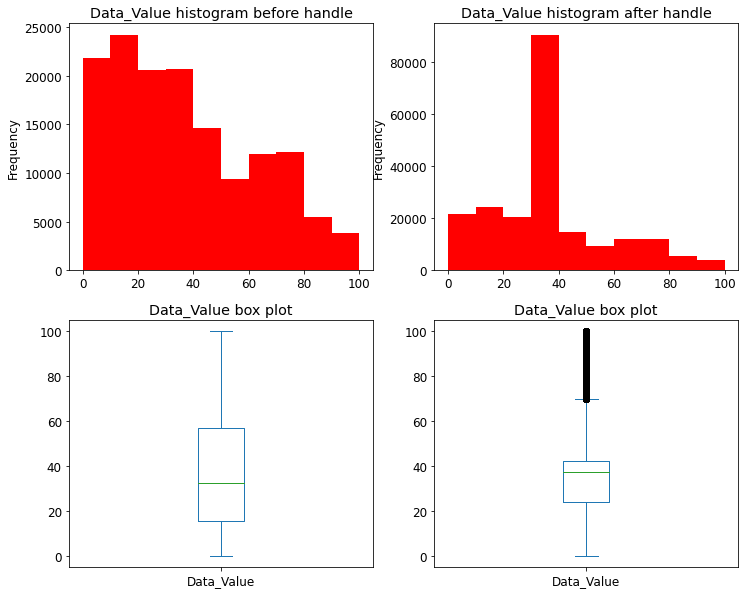

属性Data_Value处理前五数概括如下所示
对数值属性Data_Value的五数概括如下
最小值为0.0,第一四分位数为15.3,中位数为32.5,第三四分位数为56.8,最大值为100.0
属性Data_Value处理后五数概括如下所示
对数值属性Data_Value的五数概括如下
最小值为0.0,第一四分位数为23.8,中位数为37.34195562439067,第三四分位数为42.1,最大值为100.0


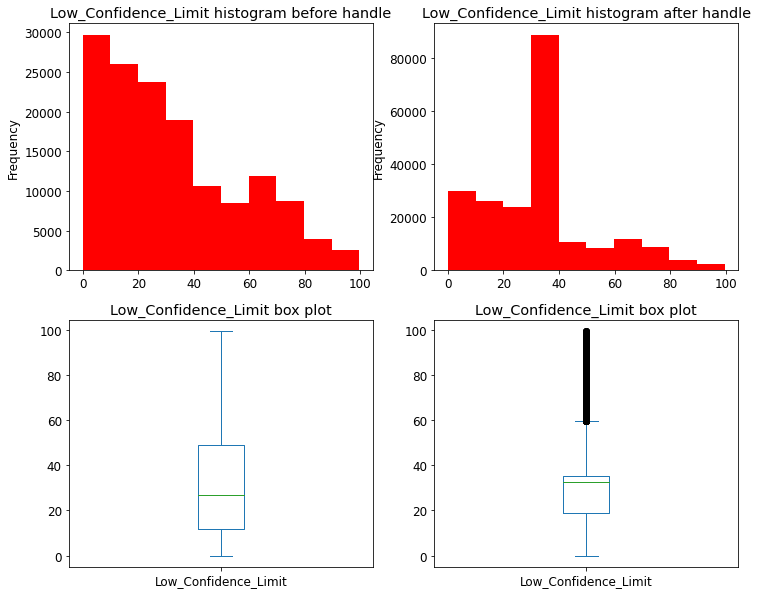

属性Low_Confidence_Limit处理前五数概括如下所示
对数值属性Low_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为12.0,中位数为26.9,第三四分位数为49.1,最大值为99.6
属性Low_Confidence_Limit处理后五数概括如下所示
对数值属性Low_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为19.0,中位数为32.732479650036,第三四分位数为35.3,最大值为99.6


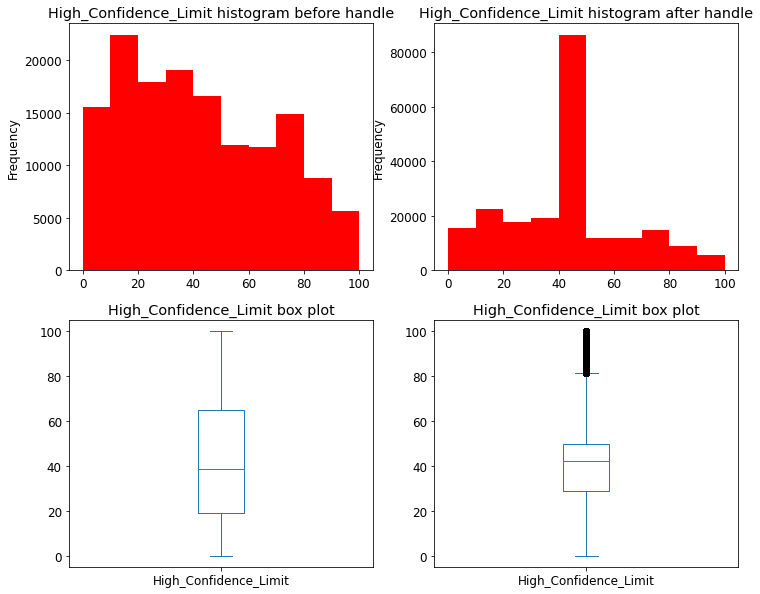

属性High_Confidence_Limit处理前五数概括如下所示
对数值属性High_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为19.0,中位数为38.5,第三四分位数为64.7,最大值为100.0
属性High_Confidence_Limit处理后五数概括如下所示
对数值属性High_Confidence_Limit的五数概括如下
最小值为0.0,第一四分位数为28.6,中位数为42.23888019823911,第三四分位数为49.6,最大值为100.0


In [21]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
new5 = data[newNumetricAttr]
new5 = imputer.fit_transform(new5)
new5 = pd.DataFrame(new5,columns = newNumetricAttr)
print(new5)
new5['Data_Value_Alt'] = new5['Data_Value']
print("使用KNNImputer填充缺失值之前:")
print(data[numetricAttr].isnull().sum())
print("使用KNNImputer填充缺失值之后:")
print(new5.isnull().sum())
compare_dataset_numetric(data,new5,newNumetricAttr,True)

使用KNNImputer能填充所有缺失值，但会产生较多离群点。fast_knn和KNNImputer都是采用k-近邻算法来估计缺失值，但是KNNImputer可以处理多个特征的缺失值。